# Detection and trend prognosis of flood frequency in the northern west of Argentina: case studies in Catamarca,  Córdoba and Tucumán

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import math
import plotly.graph_objects as go
import scienceplots # !pip install SciencePlots  plt.style.available #tienen que aparecer science y ieee
import warnings
warnings.filterwarnings("ignore")

# DATA PREPROCESSING

-BEGIN HEADER-

[NASA/POWER CERES/MERRA2](https://power.larc.nasa.gov/data-access-viewer/) Native Resolution Daily Data

Dates (month/day/year): 01/01/2000 through 12/12/2022

Location: Latitude  -28.454637   Longitude -65.764005
lonlat = c(-65.764005, -28.454637), #Catamarca

lonlat = c(-64.512592,-31.446667), #Córdoba

lonlat = c(-65.2454 ,-27.6551), #Lamadrid


Elevation from MERRA-2: **Average for 0.5 x 0.625 degree lat/lon region** = 330.23 meters

The value for missing source data that cannot be computed or is outside of the sources availability range: -999

Parameter(s):

T2M             MERRA-2 Temperature at 2 Meters (C)

T2MDEW          MERRA-2 Dew/Frost Point at 2 Meters (C)

T2MWET          MERRA-2 Wet Bulb Temperature at 2 Meters (C)

TS              MERRA-2 Earth Skin Temperature (C)

QV2M            MERRA-2 Specific Humidity at 2 Meters (g/kg)

RH2M            MERRA-2 Relative Humidity at 2 Meters (%)

PRECTOTCORR     MERRA-2 Precipitation Corrected (mm/day)

PS              MERRA-2 Surface Pressure (kPa)

WS10M           MERRA-2 Wind Speed at 10 Meters (m/s)

WS10M_MAX       MERRA-2 Wind Speed at 10 Meters Maximum (m/s).

WS10M_MIN       MERRA-2 Wind Speed at 10 Meters Minimum (m/s)

WS10M_RANGE     MERRA-2 Wind Speed at 10 Meters Range (m/s)

WD10M           MERRA-2 Wind Direction at 10 Meters (Degrees)

WS50M           MERRA-2 Wind Speed at 50 Meters (m/s)

WS50M_MAX       MERRA-2 Wind Speed at 50 Meters Maximum (m/s)

WS50M_MIN       MERRA-2 Wind Speed at 50 Meters Minimum (m/s)

WS50M_RANGE     MERRA-2 Wind Speed at 50 Meters Range (m/s)

WD50M           MERRA-2 Wind Direction at 50 Meters (Degrees)

-END HEADER-

In [ ]:
df = pd. read_csv ('2024_07_Cordoba.csv', header = 0,  sep = ',') # Datos disponibles en https://mega.nz/file/O95wgLKA#swvkQB0bvL0l4YWFDNlzamh9gtn9IuIOXD0gWt3-YKE
Anio_inicial=df['YEAR'][0]
Anio_final=df['YEAR'][len(df)-1]
print(df.head(2))
print(df.tail(2))

   YEAR  MO  DY    T2M  T2MDEW  T2MWET     TS  QV2M   RH2M  PRECTOTCORR  ...  \
0  1981   1   1  18.05    9.50   13.77  18.04  8.06  62.19         0.85  ...   
1  1981   1   2  19.90   11.58   15.73  19.51  9.22  63.06         0.17  ...   

   WS10M  WS10M_MAX  WS10M_MIN  WS10M_RANGE   WD10M  WS50M  WS50M_MAX  \
0   2.59       3.37       1.53         1.84  168.25   4.66       5.66   
1   1.59       2.63       0.88         1.74  156.69   2.60       4.74   

   WS50M_MIN  WS50M_RANGE   WD50M  
0       2.49         3.17  168.56  
1       0.33         4.41  160.19  

[2 rows x 21 columns]
       YEAR  MO  DY    T2M  T2MDEW  T2MWET    TS  QV2M   RH2M  PRECTOTCORR  \
15886  2024   6  30  11.44   -0.83    5.30  10.3  3.91  47.06          0.0   
15887  2024   7   1  10.73   -0.45    5.14  10.0  3.97  50.56          0.0   

       ...  WS10M  WS10M_MAX  WS10M_MIN  WS10M_RANGE   WD10M  WS50M  \
15886  ...   2.54       4.17       0.55         3.62  235.62   4.28   
15887  ...   2.20       3.31   

### REGION OF INTEREST Enfocando en el sitio bajo interés dado el error del 22 de junio de 2021


![image.png](attachment:image.png)

### Carga el día fallado

In [ ]:
df_F = pd. read_csv ('POWER_Point_Daily_20210620_20210626_028d4546S_065d7640W_LST.csv', header = 20,  sep = ',') # Datos disponibles en https://mega.nz/file/O95wgLKA#swvkQB0bvL0l4YWFDNlzamh9gtn9IuIOXD0gWt3-YKE

In [ ]:
df_F.head(4)

,YEAR,MO,DY,T2M,T2MDEW,T2MWET,TS,T2M_RANGE,T2M_MAX,T2M_MIN,PRECTOTCORR,RH2M,QV2M,PS,WS10M
0,2021,6,20,7.03,2.75,4.89,6.97,15.01,16.09,1.08,0.00,77.31,5.13,91.02,3.27
1,2021,6,21,9.67,2.69,6.18,8.62,14.20,18.62,4.42,11.78,67.44,5.13,91.13,2.29
2,2021,6,22,8.58,7.41,8.00,8.39,7.69,11.81,4.12,244.70,92.56,7.14,90.76,4.94
3,2021,6,23,12.37,9.82,11.10,12.22,12.03,20.10,8.07,0.00,85.06,8.42,90.37,2.29


In [ ]:
df_F['PRECTOTCORR']

0      0.00
1     11.78
2    244.70
3      0.00
4      0.00
5      0.00
6      3.04
Name: PRECTOTCORR, dtype: float64

In [ ]:
df.head(3)

,YEAR,MO,DY,T2M,T2MDEW,T2MWET,TS,QV2M,RH2M,PRECTOTCORR,...,WS10M,WS10M_MAX,WS10M_MIN,WS10M_RANGE,WD10M,WS50M,WS50M_MAX,WS50M_MIN,WS50M_RANGE,WD50M
0,1981,1,1,18.05,9.50,13.77,18.04,8.06,62.19,0.85,...,2.59,3.37,1.53,1.84,168.25,4.66,5.66,2.49,3.17,168.56
1,1981,1,2,19.90,11.58,15.73,19.51,9.22,63.06,0.17,...,1.59,2.63,0.88,1.74,156.69,2.60,4.74,0.33,4.41,160.19
2,1981,1,3,21.15,11.84,16.49,20.50,9.28,59.69,0.00,...,2.08,3.29,0.35,2.94,162.31,3.63,6.46,0.48,5.98,162.12


In [ ]:
df_t = np.array(range(len(df['YEAR'])), dtype=np.dtype('datetime64[s]'))
lluvia = np.array(range(len(df_t)), float)
for i in range(len(df['YEAR'])):
    df_t[i] = pd.to_datetime(str(df['YEAR'][i]) + '-' + str(df['MO'][i]) + '-' + str(df['DY'][i]) + ' 00:00:00')
    lluvia[i] = df['PRECTOTCORR'][i]
    if df['PRECTOTCORR'][i] < 0:
        lluvia[i] = 0.0  # Ensure non-negative precipitation
df_Pre = pd.DataFrame({'t': df_t, 'LL': lluvia})

## Cargo datos del CAPE propietarios
El sitio actual (31/5/2024) es http://www.meteo.sucytca.gob.ar/index.php

In [ ]:
df_CAPE = pd. read_csv ('SuCyTCa-CAPE.csv',header=0,   sep = ';') # Dato SuCyTCa-CAPE
df_CAPE.head(3)

,Fecha,Temperatura_Ambiente [°C],Humedad_Relativa [%],Presion_Atmosferica [hPa],Radiacion_Solar [W/m2],Precipitacion [mm],Precipitacion_Acum._Diaria [mm],Veloc._de_Viento_Max_10m [Km/h],Veloc._de_Viento_Min_10m [Km/h],Veloc._de_Viento_Prom._10m [Km/h],Direccion_de_Viento_a_10m [°],Direccion_a_10m,Veloc._de_Viento_Max_2m [Km/h],Veloc._de_Viento_Min_2m [Km/h],Veloc._de_Viento_Prom._2m [Km/h],Direccion_de_Viento_a_2m [°],Direccion_a_2m,Evaporimetro [mm],Evaporacion_Acum._Diaria [mm]
0,30/1/2020 0:15,25.1,51.2,953.8,0.0,0.0,0.0,16.9,3.6,9.7,176.8,S,11.5,0.0,5.4,181.0,S,0.08,0.08
1,30/1/2020 0:30,24.7,53.0,953.9,0.0,0.0,0.0,11.5,0.0,5.2,130.2,SSE,9.0,0.0,1.7,149.2,S,0.09,0.17
2,30/1/2020 0:45,23.8,59.0,954.2,0.0,0.0,0.0,11.5,0.0,4.4,155.5,SSO,3.6,0.0,0.1,165.8,SSE,0.09,0.26


In [ ]:
df_CAPE['Temperatura_Ambiente [°C]'][0]
df_CAPE['Precipitacion_Acum._Diaria [mm]'][0]
df_CAPE['Fecha ']=pd.to_datetime(df_CAPE['Fecha '], dayfirst=True)
df_CAPE.head(3)

,Fecha,Temperatura_Ambiente [°C],Humedad_Relativa [%],Presion_Atmosferica [hPa],Radiacion_Solar [W/m2],Precipitacion [mm],Precipitacion_Acum._Diaria [mm],Veloc._de_Viento_Max_10m [Km/h],Veloc._de_Viento_Min_10m [Km/h],Veloc._de_Viento_Prom._10m [Km/h],Direccion_de_Viento_a_10m [°],Direccion_a_10m,Veloc._de_Viento_Max_2m [Km/h],Veloc._de_Viento_Min_2m [Km/h],Veloc._de_Viento_Prom._2m [Km/h],Direccion_de_Viento_a_2m [°],Direccion_a_2m,Evaporimetro [mm],Evaporacion_Acum._Diaria [mm]
0,2020-01-30 00:15:00,25.1,51.2,953.8,0.0,0.0,0.0,16.9,3.6,9.7,176.8,S,11.5,0.0,5.4,181.0,S,0.08,0.08
1,2020-01-30 00:30:00,24.7,53.0,953.9,0.0,0.0,0.0,11.5,0.0,5.2,130.2,SSE,9.0,0.0,1.7,149.2,S,0.09,0.17
2,2020-01-30 00:45:00,23.8,59.0,954.2,0.0,0.0,0.0,11.5,0.0,4.4,155.5,SSO,3.6,0.0,0.1,165.8,SSE,0.09,0.26


## Corrección del 14782	2021-06-22	244.70

In [ ]:
# df_Pre['LL'][14289:-1]
df_Pre[14800-20:14805-20]
# 14782	2021-06-22	244.70
df_Pre.loc[14782,'LL']=df_Pre['LL'][14781]
df_Pre[14800-20:14805-20]

,t,LL
14780,2021-06-20,0.0
14781,2021-06-21,0.0
14782,2021-06-22,0.0
14783,2021-06-23,0.0
14784,2021-06-24,0.0


### Inundaciones y crecidas del Ríos en zona de estudio Región Córdoba (desde 1981 a la fecha)

---


Año	Mes	Letras	Detalles
1985	1	Enero	Fuertes lluvias causaron inundaciones en varias partes de Córdoba, incluyendo zonas cercanas a la capital.

1992	3	Marzo	 Lluvias intensas durante varios días causaron inundaciones en la ciudad y  reas suburbanas. Se registraron evacuaciones masivas y pérdidas agrícolas significativas.

1992	12	Diciembre	Lluvias intensas provocaron crecidas en r¡os y arroyos, afectando  reas urbanas y rurales.

2003	4	Abril	Lluvias extraordinarias (m s de 200 mm en 48 horas) causaron inundaciones generalizadas. Se reportaron cortes de energ¡a y desbordamiento de alcantarillados.

2015	2	Febrero	Intensas precipitaciones en las Sierras Chicas provocaron inundaciones que afectaron a diversas localidades, incluyendo Villa Allende, R­o Ceballos y Ascochinga, causando daÏos materiales significativos y p?rdidas humanas.

2017	3	Marzo	Fuertes tormentas afectaron la regi¢n, provocando inundaciones y da¤os en viviendas y caminos. Crecida Rio Anisacate.

2021	1	Enero	 En la regi¢n de Alta Gracia, las lluvias intensas provocaron crecidas del R¡o Anisacate.

2022	1	Enero	Fuertes lluvias provocaron crecidas en los r­os serranos del norte del Valle de Punilla, impactando negativamente en las comunidades locales y en la infraestructura de la zona.

2023	12	Diciembre	 En Alta Gracia y su  área circundante, las precipitaciones récord a finales de diciembre de 2023 causaron desbordes del río Anisacate.



---

    Año  Mes     Letras                                           Detalles
7  2022    1      Enero  Fuertes lluvias provocaron crecidas en los r­o...
8  2023   12  Diciembre   En Alta Gracia y su  área circundante, las pr...


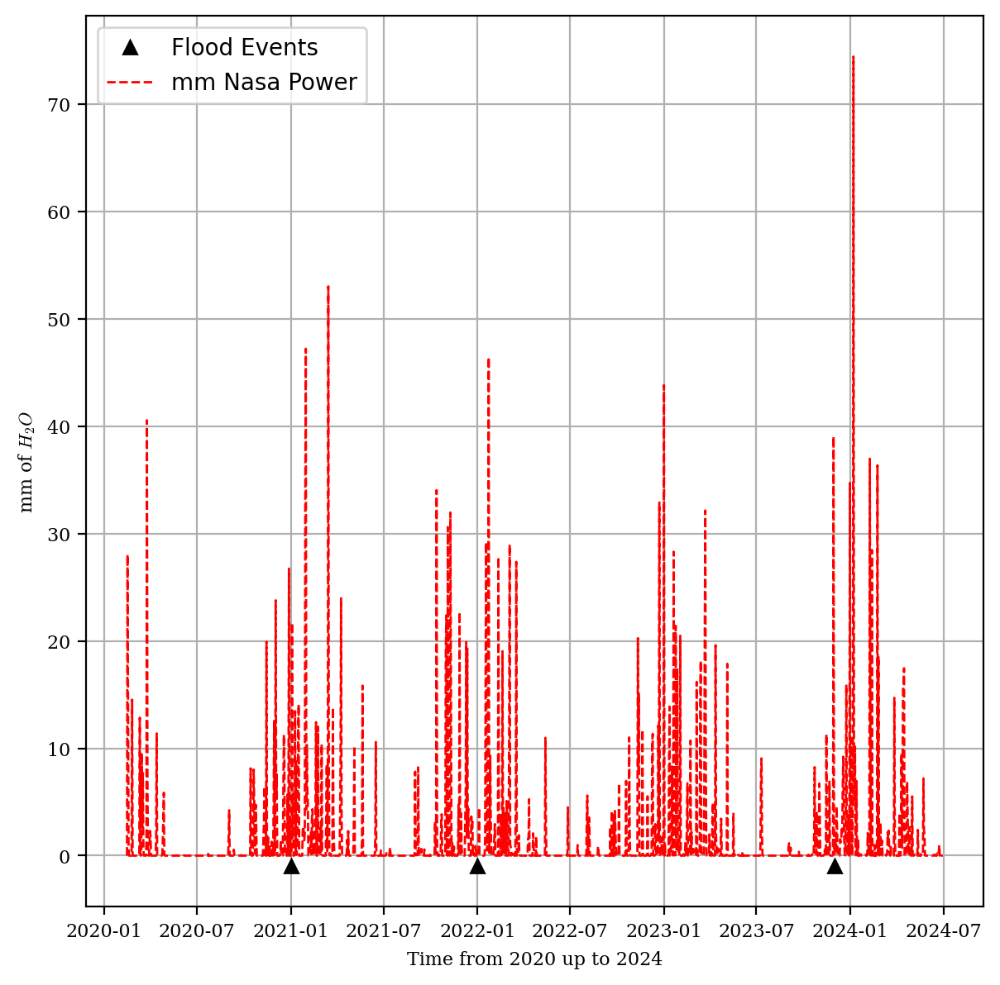

In [ ]:
df_C = pd. read_csv ('Inundaciones y crecidas de Cba.csv', header = 0,  sep = ';') # Datos disponibles
print(df_C.tail(2))
df_te=np.array(range(len(df_C['Año'])), dtype=np.dtype('datetime64[s]'))
Eventos=np.array(range(len(df_te)), float)
for i in range(len(df_C['Año'])):
   df_te[i]= pd.to_datetime( str(df_C['Año'][i])+'-'+str(df_C['Mes'][i]))
   Eventos[i] = 1.
df_Eventos = pd.DataFrame({'t_Evento': df_te,'Eventos': Eventos})
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
  fig, axs = plt.subplots(figsize=(7,7), dpi= 200)
plt.plot(df_Eventos['t_Evento'][6:],-1*df_Eventos['Eventos'][6:], 'k' , linewidth=0,marker='^')
plt.plot(df_Pre['t'][14289:-1],df_Pre['LL'][14289:-1] , linewidth =1)
axs.legend(['Flood Events','mm Nasa Power','mm CAPE'])
axs.grid( True )
plt.xlabel('Time from 2020 up to '+ str(int(df.iloc[-1]['YEAR'])))
plt.ylabel('mm of $H_2O$')
plt.show()

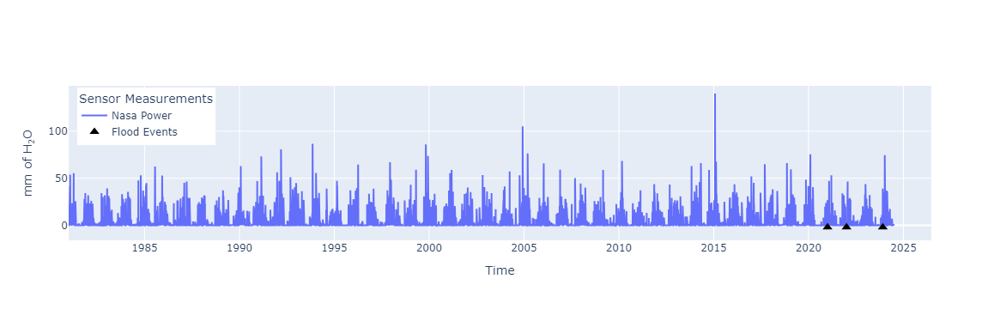

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_Pre['t'] , y=df['PRECTOTCORR'] , mode='lines', name='Nasa Power'))
fig.add_trace(go.Scatter(x=df_Eventos['t_Evento'][6:], y=-2*df_Eventos['Eventos'][6:], mode='markers', marker=dict(size=10, symbol='triangle-up-dot',color='black'), name='Flood Events'))
fig.update_layout(#title='Precipitaciones y Eventos',
                  xaxis_title='Time',
                  yaxis_title='mm of H<sub>2</sub>O',
                  legend_title='Sensor Measurements',
                  showlegend = True)
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))
fig.show()

In [ ]:
df_Eventos.tail(3)

,t_Evento,Eventos
6,2021-01-01,1.0
7,2022-01-01,1.0
8,2023-12-01,1.0


In [ ]:
df_C.head(2)

,Año,Mes,Letras,Detalles
0,1985,1,Enero,Fuertes lluvias causaron inundaciones en varia...
1,1992,3,Marzo,Lluvias intensas durante varios días causaron...


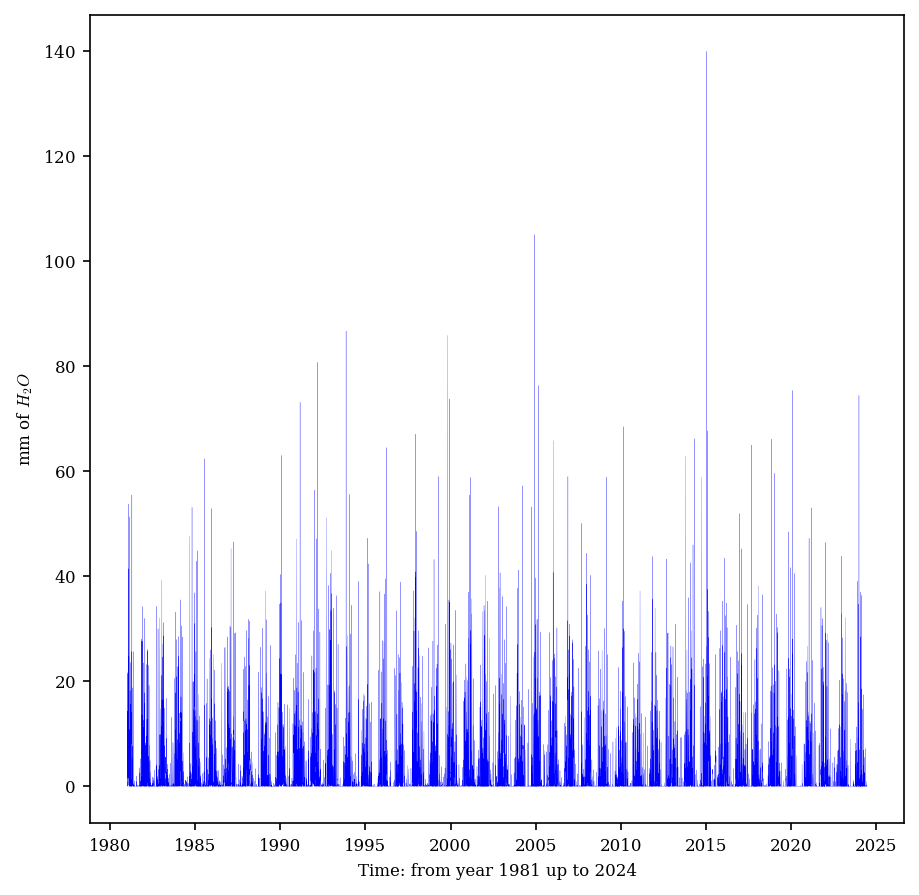

In [ ]:
df_t=np.array(range(len(df['YEAR'])), dtype=np.dtype('datetime64[s]'))
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
  fig, axs = plt.subplots(figsize=(7,7), dpi= 150)
lluvia=np.array(range(len(df_t)), float)
# Plot the raw time series
for i in range(len(df['YEAR'])):
   df_t[i]= pd.to_datetime( str(df['YEAR'][i])+'-'+str(df['MO'][i])+'-'+str(df['DY'][i])+' '+'00:00:00')
   lluvia[i] = df['PRECTOTCORR'][i]
   if df['PRECTOTCORR'][i]<0:
    lluvia[i]=0. #lluvia tiene los valores arreglados
#Corregimos el outlier usando Naive
lluvia[14782]=lluvia[14782-1]
df_Pre=pd.DataFrame({ 't': df_t,'LL': lluvia}) # Siempre conviene armar un DataFrame para graficar y procesar los datos
axs.plot(df_t,lluvia, 'b' , linewidth =.10)
plt.xlabel('Time: from year 1981 up to '+ str(int(df.iloc[-1]['YEAR'])));
plt.ylabel('mm of $H_2O$')
plt.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_Eventos['t_Evento'][1:], y=-10*df_Eventos['Eventos'][1:], mode='markers', marker=dict(size=10, symbol='triangle-up-dot',color='black'), name='Flood Events'))
fig.add_trace(go.Scatter(x=df_Pre['t'], y=df_Pre['LL'], mode='lines', name='Rainfall'))
# fig.add_trace(go.Scatter(x=df_DWv['t'], y=df_DWv['Sigma2'], mode='lines', name='Sigma 2'))
fig.update_layout(title='Precipitations and Flood Events Recorded',
                  xaxis_title='Time [Seg.]',
                  yaxis_title='mm of H<sub>2</sub>O',
                  legend_title='Variables',
                  showlegend=True,
                  legend=dict(
                    yanchor="top",
                    y=0.99,
                    xanchor="left",
                    x=0.01)
                  )
fig.show()

In [ ]:
df_Eventos.head()
str(df_t[-1])[0:4]
df_Eventos['t_Evento'][1:-1]

1   1992-03-01
2   1992-12-01
3   2003-04-01
4   2015-02-01
5   2017-03-01
6   2021-01-01
7   2022-01-01
Name: t_Evento, dtype: datetime64[s]

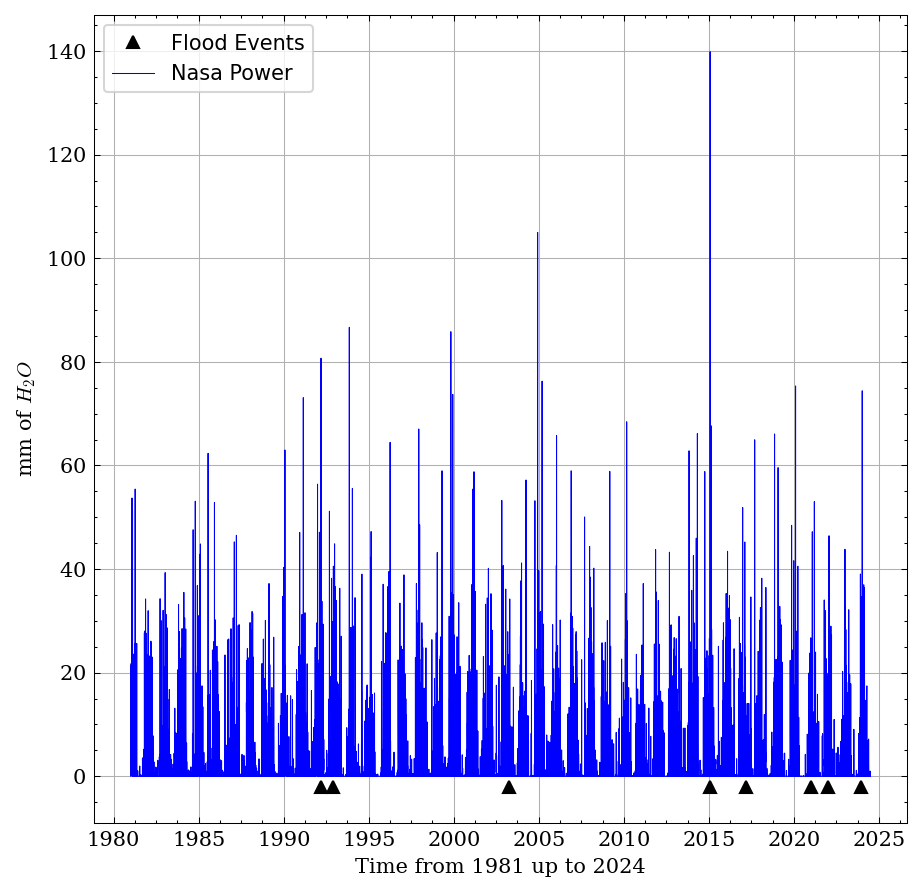

In [ ]:
df_te=np.array(range(len(df_C['Año'])), dtype=np.dtype('datetime64[s]'))
Eventos=np.array(range(len(df_te)), float)
for i in range(len(df_C['Año'])):
   df_te[i]= pd.to_datetime( str(df_C['Año'][i])+'-'+str(df_C['Mes'][i]))
   Eventos[i] = 1.
df_Eventos = pd.DataFrame({'t_Evento': df_te,'Eventos': Eventos})
with plt.style.context(['science','no-latex']):
  fig, axs = plt.subplots(figsize=(7,7), dpi= 150)
#fig.suptitle('Eventos severos de precipitaciones registrados')
plt.plot(df_Eventos['t_Evento'][1:],-2*df_Eventos['Eventos'][1:], 'k' , linewidth=0,marker='^')
plt.plot(df_t,lluvia, 'b' , linewidth =.50)
axs.legend(['Flood Events','Nasa Power','mm CAPE'])
axs.grid(True)
plt.ylabel('mm of $H_2O$')
plt.xlabel('Time from 1981 up to '+ str(df_t[-1])[0:4])
plt.show()

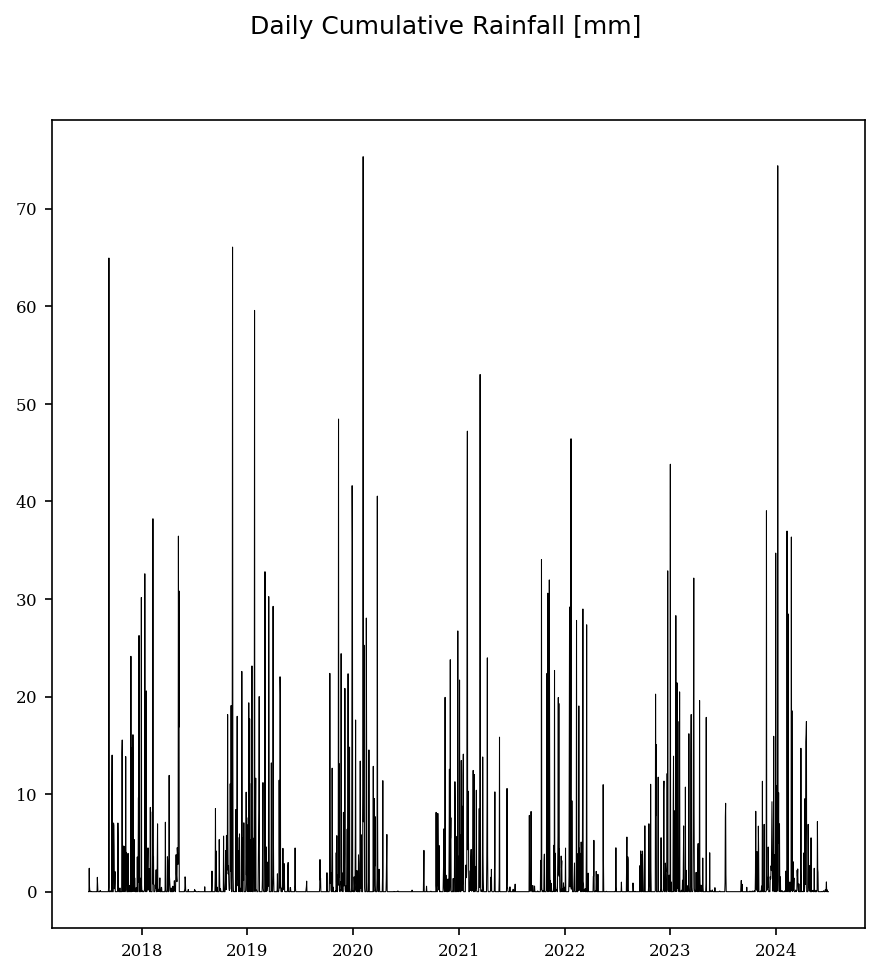

In [ ]:
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
    fig, axs = plt.subplots(figsize=(7,7), dpi= 150)
fig.suptitle('Daily Cumulative Rainfall [mm]')
Anio_inicialC=2017
mask = (df_t > pd.Timestamp(Anio_inicialC,7,1)) & (df_t <= pd.Timestamp(Anio_inicialC+7,6,30))
axs.plot(df_t[mask], lluvia[mask], linewidth =.50)
plt.show()

## Modelado empleando Gauss
Determinación de los parámetros $\mu$ y $\sigma$.

![image.png](attachment:image.png)

![image.png](attachment:image.png)

## Datos de la Central Met del CAPE
Modelado Gaussiano.

In [ ]:
Anio_inicial_A=Anio_inicial
Anio_inicial=2021
NA=6-3 #Número de años. Desde Anio_inicial hasta Anio_inicial+NA
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
  fig, axs = plt.subplots(2,NA,figsize=(10,5), dpi= 150)
f1=True;f2=True
t_anio = np.empty(NA)
df_CAPE= pd.read_csv('2023_CAPE_.csv', header = 0,  sep = ';') # Datos disponibles2023_CAPE_
df_CAPE['Precipitacion [mm]']=df_CAPE['Precipitacion [mm]'].fillna(0)
for i in range(NA):
  mask = (df_CAPE['Fecha '] > pd.Timestamp(Anio_inicial+i,7,1)) & (df_CAPE['Fecha '] <= pd.Timestamp(Anio_inicial+i+1,6,30))
  s_anio=(df_CAPE['Fecha '] == pd.Timestamp(Anio_inicial+i,7,1)) #inicio de anio hidrologico
  m_solst = (df_CAPE['Fecha '] == pd.Timestamp(Anio_inicial+i,12,21)) # Solsticio
  v_integrada=df_CAPE['Precipitacion_Acum._Diaria [mm]'][mask]
  v =df_CAPE['Precipitacion [mm]'][mask]
  t_Y=df_CAPE['Fecha '][mask]
  F_solst=df_CAPE['Fecha '][m_solst]
  I_Anio=df_CAPE['Fecha '][s_anio]
  mu_F_solst=173+30 #Es la fecha de solsticio de verano más 30 días, el centro de las lluvias
  mu_F_solst=F_solst.index[0]-I_Anio.index[0]   # t_anio[i]=(t_Y[0].astype(object).year) #Almacena el año
  t_anio[i]=t_Y.iloc[0].year
  v_mask=np.isfinite(v.values)
  P=np.cumsum(v[v_mask].values)
  P_max=P[-1]
  T1=0*1e-1
  T2=2e0
  p=np.array(range(len(P)))
  p[0]=0.
  for i1 in range(len(P)-1):
    k=i1+1
    p[k]=(T1*(P[k]-P[k-1])+T2*p[k-1]+P[k])/(T2+1)
  axs[0,i].set_title(' '+str(Anio_inicial+i), fontsize=10)
  axs[0,i].plot(df_CAPE['Fecha '][mask], df_CAPE['Precipitacion_Acum._Diaria [mm]'][mask], linewidth =.20)
  axs[0,i].axes.get_xaxis().set_visible(False) #Evita imprimir los valores de los ejes
  if f1:
    axs[0,i].set_ylabel('[mm of $H_2O$]',rotation=90, fontsize=12)
    f1= False
  axs[0,i].grid()
  h=np.sum(v[v_mask].values) #Lluvia acumulada anual
  axs[1,i].set_title(str(np.round(h))+'mm', fontsize=10)
  axs[1,i].plot( df_CAPE['Fecha '][mask], p/h, linewidth =1.0, color = 'red')
  axs[1,i].plot( df_CAPE['Fecha '][mask], np.cumsum(v)/h, linewidth =1.0, color = 'black')
  axs[1,i].xaxis.set_major_locator(ticker.AutoLocator())
  axs[1,i].xaxis.set_minor_locator(ticker.AutoMinorLocator())
  if f2:
    axs[1,i].set_ylabel('[Cumulative mm of H2O]',rotation=90, fontsize=12)
    f2= False
  axs[1,i].locator_params(axis='x', nbins=5)
  axs[1,i].grid()
  axs[1,i].tick_params(axis='x', labelrotation=90)
  temp=np.abs(p /h-.5)
  lugar=np.where(temp==np.min(temp))
  mu_m=lugar[0]
  mu_v=p[lugar[0]]
  t_mu_= t_Y.iloc[lugar[0][0]]
  temp =np.abs(p/h - .1587)
  mu_i =np.where(temp==np.min(temp,axis=0))[0]
  mu_= lugar[0] - mu_i[0]
  sigma_1 = mu_m[0]-mu_i[0]
  temp =np.abs(p/h- .8413)
  mu_s =np.where(temp==np.min(temp,axis=0))[0]
  t_mu_s = t_Y.iloc[mu_s[0]]
  sigma_2 =mu_s[0]-mu_m[0]
  sigma_ =(mu_s[0]-mu_[0])
  sigma =.5*(mu_s[0]-mu_i[0]) #;%     S_D=.5*(t_68-t_34);
  sigma_m =(mu_[0]-mu_i[0])
  pg=np.array(range(len(P)),dtype=float)
  pg_sols=np.array(range(len(P)),dtype=float)
  hh=0.
  for kk in range(len(P)):
    hh=hh+1.
    pg[kk] = (200*10*10*10/(sigma*2.5066))*math.exp(-.5*((hh-mu_m[0])/sigma)**2)
    pg_sols[kk] = (200*10*10*10/(sigma*2.5066))*math.exp(-.5*((hh-mu_F_solst)/sigma)**2)
  axs[0,i].plot( t_Y,pg, linewidth =1.0 , color = 'red')
  axs[0,i].plot( t_Y,pg_sols, linewidth =1.0 , color = 'green')
  axs[1,i].plot(t_Y,P/h, linewidth =1.0 , color = 'black')
  # Agrega los puntos importantes de la distribucion Gaussiana a cada probabilidad acumulada
  timeseries_data={
        "Date": [t_mu_, t_mu_, t_mu_s, t_mu_s, t_Y.iloc[mu_i[0]], t_Y.iloc[mu_i[0]]],
        "Result": [0 , mu_v[0], 0 , p[mu_s[0]], 0, p[mu_i[0]] ]
  }
  dfc = pd.DataFrame(timeseries_data, columns=['Date', 'Result'])
  for ii in range(0, 6, 2):
     axs[1,i].plot(dfc['Date'][ii:ii+2], dfc['Result'][ii:ii+2]/h, color='green')
     axs[1,i].plot(dfc['Date'][ii+1:ii+2], dfc['Result'][ii+1:ii+2]/h, marker ='+', color='green')
  print('Year ' + str(int(Anio_inicial+i)) + ': ' + str(np.round(h))+ 'mm of H2)') #Anio_inicial=2016
Anio_inicial=Anio_inicial_A
plt.show()

## Datos Power Merra Nasa
Modelado Gaussiano.

Year 1984: 825.0mm
Year 1985: 817.0mm
Year 1986: 928.0mm


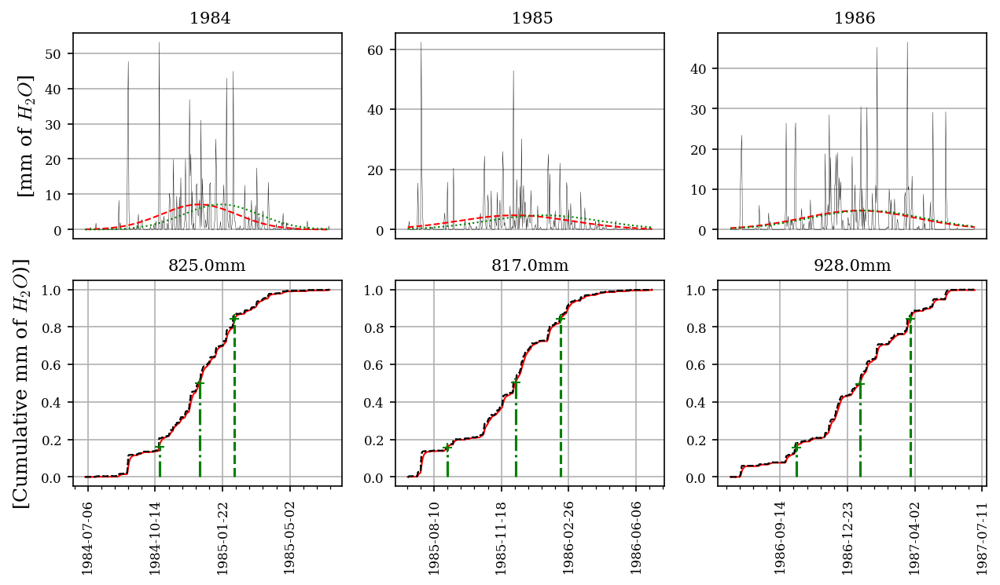

In [ ]:
Anio_inicial_A=Anio_inicial
Anio_inicial=1981+3
NA=6-3 #Número de años. Desde Anio_inicial hasta Anio_inicial+NA
V_mat = np.empty([6, NA])  #NA es el numero de años desde el 2016 =Anio_inicial.
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
# with plt.style.context(['science','no-latex']):
#with plt.style.context('dark_background'):
# with plt.style.context('seaborn-v0_8-pastel'):
# with plt.style.context('seaborn-v0_8-poster'):
  fig, axs = plt.subplots(2,NA,figsize=(10,5), dpi= 150)
f1=True;f2=True
t_anio = np.empty(NA)
for i in range(NA):
  mask = (df_t > pd.Timestamp(Anio_inicial+i,7,1)) & (df_t <= pd.Timestamp(Anio_inicial+i+1,6,30))
  m_solst = (df_t == pd.Timestamp(Anio_inicial+i,12,21)) # Solsticio
  v=lluvia[mask]
  t_Y=df_t[mask]
  F_solst=df_t[m_solst]
  mu_F_solst=173+30 #Es la fecha de solsticio de verano más 30 días, el centro de las lluvias
  t_anio[i]=(t_Y[0].astype(object).year) #Almacena el año
  P=np.cumsum(v)
  P_max=P[-1]
  T1=0*1e-1
  T2=2e0
  p=np.array(range(len(P)))
  p[0]=0.
  for i1 in range(len(P)-1):
    k=i1+1
    p[k]=(T1*(P[k]-P[k-1])+T2*p[k-1]+P[k])/(T2+1)
  axs[0,i].set_title(' '+str(Anio_inicial+i), fontsize=10)
  # mask=df['PRECTOTCORR']>0
  # lluvia=df['PRECTOTCORR'][mask]
  axs[0,i].plot(df_t[mask], lluvia[mask], linewidth =.20)
  axs[0,i].axes.get_xaxis().set_visible(False) #Evita imprimir los valores de los ejes
  if f1:
    axs[0,i].set_ylabel('[mm of $H_2O$]',rotation=90, fontsize=12)
    f1= False
  axs[0,i].grid()
  h=np.sum(lluvia[mask]) #Lluvia acumulada anual
  axs[1,i].set_title(str(np.round(h))+'mm', fontsize=10)
  axs[1,i].plot( df_t[mask], p/h, linewidth =1.0, color = 'red')
  axs[1,i].plot( df_t[mask], np.cumsum(v)/h, linewidth =1.0, color = 'black')
  axs[1,i].xaxis.set_major_locator(ticker.AutoLocator())
  axs[1,i].xaxis.set_minor_locator(ticker.AutoMinorLocator())
  if f2:
    axs[1,i].set_ylabel('[Cumulative mm of $H_2O$)]',rotation=90, fontsize=12)
    f2= False
  # axs[1,i].locator_params(axis='y', nbins=7)
  axs[1,i].locator_params(axis='x', nbins=5)
  # # plt.xlabel('Distancia [Km] %d'+ % entries, fontproperties=font_manager.FontProperties(size=10))
  # axs[1,i].set_title('D.t.: '+str(int(h))+ ' Km', fontsize=10); # fig.suptitle('Distancia [Km]')
  axs[1,i].grid()
  axs[1,i].tick_params(axis='x', labelrotation=90)
  temp=np.abs(p /h-.5)
  lugar=np.where(temp==np.min(temp))
  mu_m=lugar[0]
  mu_v=p[lugar[0]]
  t_mu_=t_Y[lugar[0]]
  temp =np.abs(p/h - .1587)
  mu_i =np.where(temp==np.min(temp,axis=0))[0]
  mu_= lugar[0] - mu_i[0]
  sigma_1 = mu_m[0]-mu_i[0]
  temp =np.abs(p/h- .8413)
  # mu_s =np.where(temp==np.min(temp))
  mu_s =np.where(temp==np.min(temp,axis=0))[0]
  t_mu_s =t_Y[mu_s[0]]
  sigma_2 =mu_s[0]-mu_m[0]
  sigma_ =(mu_s[0]-mu_[0])
  sigma =.5*(mu_s[0]-mu_i[0]) #;%     S_D=.5*(t_68-t_34);
  sigma_m =(mu_[0]-mu_i[0])
  pg=np.array(range(len(P)),dtype=float)
  pg_sols=np.array(range(len(P)),dtype=float)
  hh=0.
  for kk in range(len(P)):
    hh=hh+1.
    pg[kk] = (10*10*10/(sigma*2.5066))*math.exp(-.5*((hh-mu_m[0])/sigma)**2)
    pg_sols[kk] = (10*10*10/(sigma*2.5066))*math.exp(-.5*((hh-mu_F_solst)/sigma)**2)
  axs[0,i].plot( t_Y,pg, linewidth =1.0 , color = 'red')
  axs[0,i].plot( t_Y,pg_sols, linewidth =1.0 , color = 'green')
  axs[1,i].plot(t_Y,P/h, linewidth =1.0 , color = 'black')
  # Agrega los puntos importantes de la distribucion Gaussiana a cada probabilidad acumulada
  timeseries_data={
        "Date": [t_mu_[0], t_mu_[0], t_mu_s, t_mu_s, t_Y[mu_i][0], t_Y[mu_i][0]],
        "Result": [0 , mu_v[0], 0 , p[mu_s], 0, p[mu_i[0]] ]
  }
  dfc = pd.DataFrame(timeseries_data, columns=['Date', 'Result'])
  for ii in range(0, 6, 2):
     axs[1,i].plot(dfc['Date'][ii:ii+2], dfc['Result'][ii:ii+2]/h, color='green')
     axs[1,i].plot(dfc['Date'][ii+1:ii+2], dfc['Result'][ii+1:ii+2]/h, marker ='+', color='green')
  print('Year ' + str(int(Anio_inicial+i)) + ': ' + str(np.round(h))+ 'mm') #Anio_inicial=2016
Anio_inicial=Anio_inicial_A
plt.show()

Year 2021: 622.0mm
Year 2022: 591.0mm
Year 2023: 627.0mm


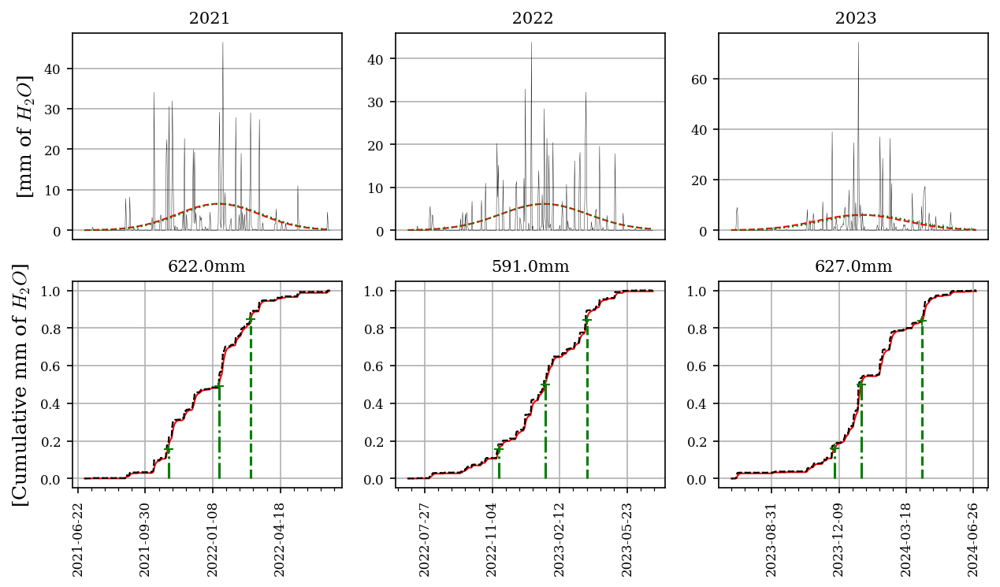

In [ ]:
Anio_inicial_A=Anio_inicial
Anio_inicial=2021
NA=6-3 #Número de años. Desde Anio_inicial hasta Anio_inicial+NA
V_mat = np.empty([6, NA])  #NA es el numero de años desde el 2016 =Anio_inicial.
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
  fig, axs = plt.subplots(2,NA,figsize=(10,5), dpi= 150)
f1=True;f2=True
t_anio = np.empty(NA)
for i in range(NA):
  mask = (df_t > pd.Timestamp(Anio_inicial+i,7,1)) & (df_t <= pd.Timestamp(Anio_inicial+i+1,6,30))
  m_solst = (df_t == pd.Timestamp(Anio_inicial+i,12,21)) # Solsticio
  v=lluvia[mask]
  t_Y=df_t[mask]
  F_solst=df_t[m_solst]
  mu_F_solst=173+30 #Es la fecha de solsticio de verano más 30 días, el centro de las lluvias
  t_anio[i]=(t_Y[0].astype(object).year) #Almacena el año
  P=np.cumsum(v)
  P_max=P[-1]
  T1=0*1e-1
  T2=2e0
  p=np.array(range(len(P)))
  p[0]=0.
  for i1 in range(len(P)-1):
    k=i1+1
    p[k]=(T1*(P[k]-P[k-1])+T2*p[k-1]+P[k])/(T2+1)
  axs[0,i].set_title(' '+str(Anio_inicial+i), fontsize=10)
  axs[0,i].plot(df_t[mask], lluvia[mask], linewidth =.20)
  axs[0,i].axes.get_xaxis().set_visible(False) #Evita imprimir los valores de los ejes
  if f1:
    axs[0,i].set_ylabel('[mm of $H_2O$]',rotation=90, fontsize=12)
    f1= False
  axs[0,i].grid()
  h=np.sum(lluvia[mask]) #Lluvia acumulada anual
  axs[1,i].set_title(str(np.round(h))+'mm', fontsize=10)
  axs[1,i].plot( df_t[mask], p/h, linewidth =1.0, color = 'red')
  axs[1,i].plot( df_t[mask], np.cumsum(v)/h, linewidth =1.0, color = 'black')
  axs[1,i].xaxis.set_major_locator(ticker.AutoLocator())
  axs[1,i].xaxis.set_minor_locator(ticker.AutoMinorLocator())
  if f2:
    axs[1,i].set_ylabel('[Cumulative mm of $H_2O$]',rotation=90, fontsize=12)
    f2= False
  axs[1,i].locator_params(axis='x', nbins=5)
  axs[1,i].grid()
  axs[1,i].tick_params(axis='x', labelrotation=90)
  temp=np.abs(p /h-.5)
  lugar=np.where(temp==np.min(temp))
  mu_m=lugar[0]
  mu_v=p[lugar[0]]
  t_mu_=t_Y[lugar[0]]
  temp =np.abs(p/h - .1587)
  mu_i =np.where(temp==np.min(temp,axis=0))[0]
  mu_= lugar[0] - mu_i[0]
  sigma_1 = mu_m[0]-mu_i[0]
  temp =np.abs(p/h- .8413)
  mu_s =np.where(temp==np.min(temp,axis=0))[0]
  t_mu_s =t_Y[mu_s[0]]
  sigma_2 =mu_s[0]-mu_m[0]
  sigma_ =(mu_s[0]-mu_[0])
  sigma =.5*(mu_s[0]-mu_i[0]) #;%     S_D=.5*(t_68-t_34);
  sigma_m =(mu_[0]-mu_i[0])
  pg=np.array(range(len(P)),dtype=float)
  pg_sols=np.array(range(len(P)),dtype=float)
  hh=0.
  for kk in range(len(P)):
    hh=hh+1.
    pg[kk] = (10*10*10/(sigma*2.5066))*math.exp(-.5*((hh-mu_m[0])/sigma)**2)
    pg_sols[kk] = (10*10*10/(sigma*2.5066))*math.exp(-.5*((hh-mu_F_solst)/sigma)**2)
  axs[0,i].plot( t_Y,pg, linewidth =1.0 , color = 'red')
  axs[0,i].plot( t_Y,pg_sols, linewidth =1.0 , color = 'green')
  axs[1,i].plot(t_Y,P/h, linewidth =1.0 , color = 'black')
  # Agrega los puntos importantes de la distribucion Gaussiana a cada probabilidad acumulada
  timeseries_data={
        "Date": [t_mu_[0], t_mu_[0], t_mu_s, t_mu_s, t_Y[mu_i][0], t_Y[mu_i][0]],
        "Result": [0 , mu_v[0], 0 , p[mu_s], 0, p[mu_i[0]] ]
  }
  dfc = pd.DataFrame(timeseries_data, columns=['Date', 'Result'])
  for ii in range(0, 6, 2):
     axs[1,i].plot(dfc['Date'][ii:ii+2], dfc['Result'][ii:ii+2]/h, color='green')
     axs[1,i].plot(dfc['Date'][ii+1:ii+2], dfc['Result'][ii+1:ii+2]/h, marker ='+', color='green')
  print('Year ' + str(int(Anio_inicial+i)) + ': ' + str(np.round(h))+ 'mm') #Anio_inicial=2016
Anio_inicial=Anio_inicial_A
plt.show()

Ahora se va a emplear todos los datos disponibles, hasta Junio de 2024.

In [ ]:
Anio_inicial=df['YEAR'][0]
Anio_final=df['YEAR'][len(df)-1]
NA=Anio_final-Anio_inicial #Número de años. Desde 1981 hasta 2016+NA
V_mat = np.empty([7, NA])  #NA es el numero de años desde el 2016.
f1=True;f2=True
t_anio = np.empty(NA)
for i in range(NA):
  mask = (df_t > pd.Timestamp(Anio_inicial+i,7,1)) & (df_t <= pd.Timestamp(Anio_inicial+i+1,6,30))
  v=lluvia[mask]
  t_Y=df_t[mask]
  t_anio[i]=(t_Y[0].astype(object).year) #Almacena el año
  P=np.cumsum(v)
  P_max=P[-1]
  T1=0*1e-1
  T2=2e0
  p=np.array(range(len(P)))
  p[0]=0.
  for i1 in range(len(P)-1):
    k=i1+1
    p[k]=(T1*(P[k]-P[k-1])+T2*p[k-1]+P[k])/(T2+1)
  h=np.sum(lluvia[mask]) #Lluvia acumulada anual
  temp=np.abs(p/h-.5)
  lugar=np.where(temp==np.min(temp))
  mu_m=lugar[0]
  mu_v=p[lugar[0]]
  t_mu_=t_Y[lugar[0]]
  temp =np.abs(p/h-.1587)
  mu_i =np.where(temp==np.min(temp))
  mu_i=min(mu_i)
  mu_= lugar[0] - mu_i[0]
  sigma_1 = mu_m[0]-mu_i[0]
  temp =np.abs(p/h-.8413)
  mu_s =np.where(temp==np.min(temp))
  mu_s=min(mu_s)
  t_mu_s =t_Y[mu_s[0]]
  sigma_2 =mu_s[0]-mu_m[0]
  sigma_ =(mu_s[0]-mu_[0])
  sigma =.5*(mu_s[0]-mu_i[0]) #;%     S_D=.5*(t_68-t_34);
  sigma_m =(mu_[0]-mu_i[0])
  pg=np.array(range(len(P)),dtype=float)
  hh=0.
  for kk in range(len(P)):
    hh=hh+1.
    pg[kk] = (10*10*10/(sigma*2.5066))*math.exp(-.5*((hh-mu_m[0])/sigma)**2)
  temp=[mu_m[0],mu_v[0],pd.to_numeric(t_mu_)[0],sigma,sigma_1,sigma_2,np.round(h)]
  for i1 in range(7):
    V_mat[i1,i]=temp[i1]
  print('Año ' + str(int(Anio_inicial+i)) + ': ' + str(np.round(h))+ 'mm')

Año 1981: 771.0mm
Año 1982: 825.0mm
Año 1983: 942.0mm
Año 1984: 825.0mm
Año 1985: 817.0mm
Año 1986: 928.0mm
Año 1987: 752.0mm
Año 1988: 753.0mm
Año 1989: 795.0mm
Año 1990: 859.0mm
Año 1991: 898.0mm
Año 1992: 1041.0mm
Año 1993: 784.0mm
Año 1994: 631.0mm
Año 1995: 761.0mm
Año 1996: 616.0mm
Año 1997: 1072.0mm
Año 1998: 819.0mm
Año 1999: 1146.0mm
Año 2000: 1088.0mm
Año 2001: 842.0mm
Año 2002: 888.0mm
Año 2003: 670.0mm
Año 2004: 1023.0mm
Año 2005: 759.0mm
Año 2006: 917.0mm
Año 2007: 704.0mm
Año 2008: 603.0mm
Año 2009: 726.0mm
Año 2010: 600.0mm
Año 2011: 635.0mm
Año 2012: 751.0mm
Año 2013: 975.0mm
Año 2014: 1092.0mm
Año 2015: 991.0mm
Año 2016: 699.0mm
Año 2017: 653.0mm
Año 2018: 859.0mm
Año 2019: 736.0mm
Año 2020: 651.0mm
Año 2021: 622.0mm
Año 2022: 591.0mm
Año 2023: 627.0mm


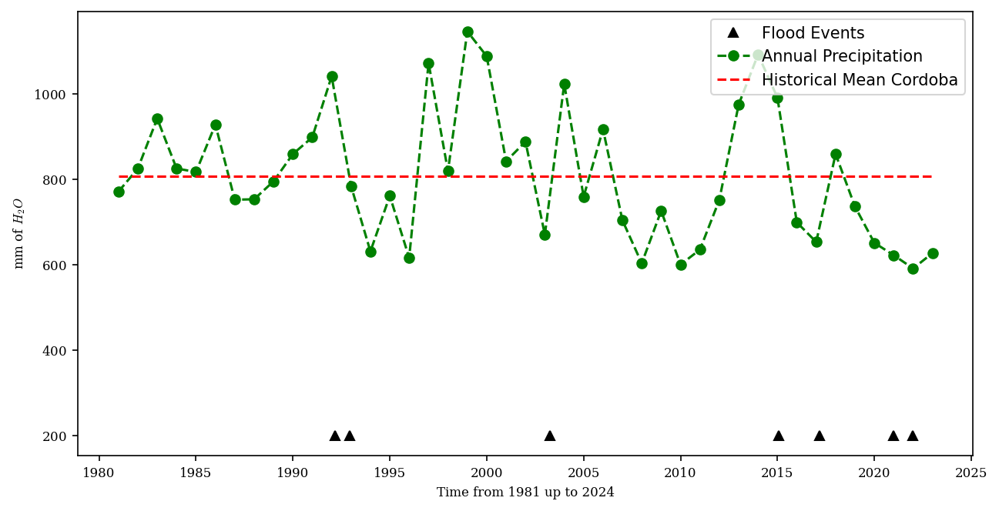

In [ ]:
# Media histórica de mm de lámina partiendo del 2000
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
    fig, ax1 = plt.subplots(figsize=(10,5), dpi= 150)
datat = pd.DataFrame({'Year': t_anio})
datat['Year'] = pd.to_datetime(datat['Year'], format='%Y')
ax1.plot(df_Eventos['t_Evento'][1:-1], 200*df_Eventos['Eventos'][1:-1], 'k' , linewidth=0,marker='^')
ax1.plot((datat['Year']), V_mat[6,:],'--og')
mua_1=np.mean(V_mat[0,0:14]) #primeros 15 años, desde 2000
ax1.plot(datat['Year'],np.ones_like(t_anio)* np.mean(V_mat[6,:]))
ax1.legend(['Flood Events','Annual Precipitation','Historical Mean Cordoba'])
plt.ylabel('mm of $H_2O$')
plt.xlabel('Time from 1981 up to '+ str(df_t[-1])[0:4])
plt.show()

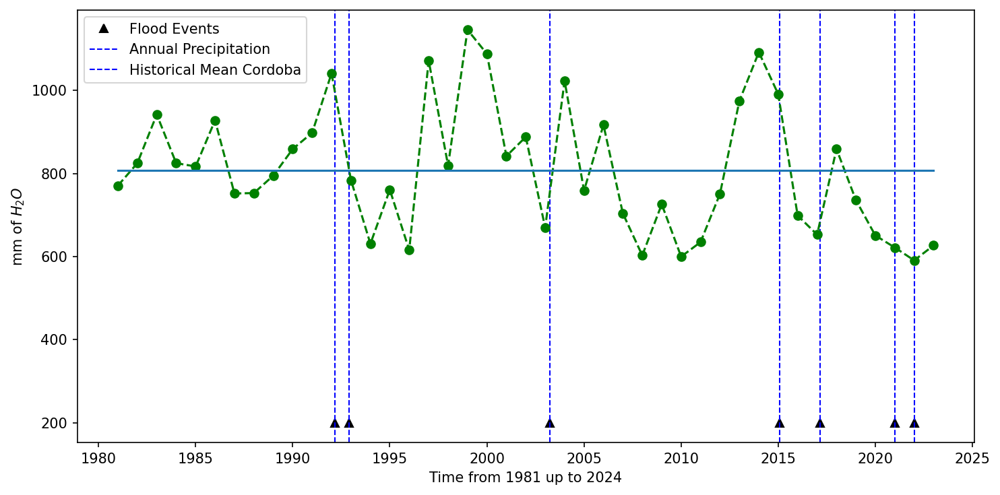

In [ ]:
fig, ax1 = plt.subplots(figsize=(10, 5), dpi=150)
datat = pd.DataFrame({'Year': t_anio})
datat['Year'] = pd.to_datetime(datat['Year'], format='%Y')
# Plot Flood Events (black triangles)
flood_times = df_Eventos['t_Evento'][1:-1]
ax1.plot(flood_times, 200 * df_Eventos['Eventos'][1:-1], 'k', linewidth=0, marker='^')
# Add vertical blue lines for each flood event
for ft in flood_times:
    ax1.axvline(x=ft, color='blue', ls='--', linewidth=1)
# Plot annual precipitation
ax1.plot(datat['Year'], V_mat[6, :], '--og')
# Historical mean line
mua_1 = np.mean(V_mat[0, 0:14])
ax1.plot(datat['Year'], np.ones_like(t_anio) * np.mean(V_mat[6, :]))
# Legend and labels
ax1.legend(['Flood Events', 'Annual Precipitation', 'Historical Mean Cordoba'])
plt.ylabel('mm of $H_2O$')
plt.xlabel('Time from 1981 up to ' + str(df_t[-1])[:4])
plt.tight_layout()
plt.show()

El análisis consiste en estudiar la distribución de lluvias en el año hidrológico, que empieza el 1º de julio de cada año y termina el 30 de junio del siguiente. Como la distribución ideal es Gaussiana, se analizan los parámetros $\mu$ y $\sigma$ como día de ubicación y cantidad de días de dispersión.

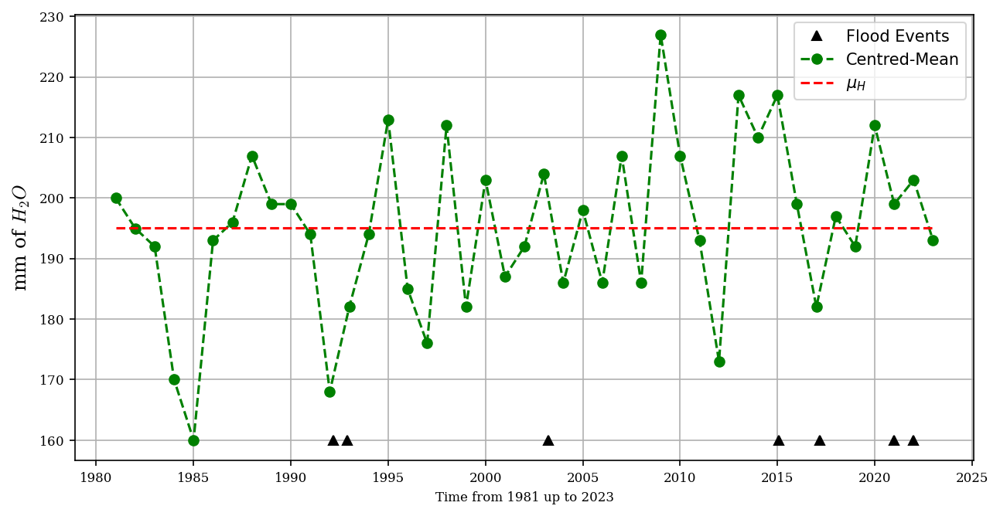

In [ ]:
# Analisis de NA años partiendo de 1981
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
    fig, ax1 = plt.subplots(figsize=(10,5), dpi= 150)
datat = pd.DataFrame({'Year': t_anio})
datat['Year'] = pd.to_datetime(datat['Year'], format='%Y')
ax1.plot(df_Eventos['t_Evento'][1:-1],160*df_Eventos['Eventos'][1:-1], 'k' , linewidth=0,marker='^')
ax1.plot((datat['Year']), V_mat[0,:],'--og')
mu_1=np.mean(V_mat[0,0:14]) #primeros 15 años, desde 2016
ax1.plot(datat['Year'],np.ones_like(t_anio)* np.mean(V_mat[0,:]))
ax1.set_xlabel('Time from 1981 up to '+ str(int(np.round(t_anio[-1]))))
ax1.set_ylabel('From 1st of July',rotation=90, fontsize=12)
ax1.legend(['Flood Events','Centred-Mean',r'$\mu_H$'])
plt.grid('True')
plt.ylabel('mm of $H_2O$')
plt.show()

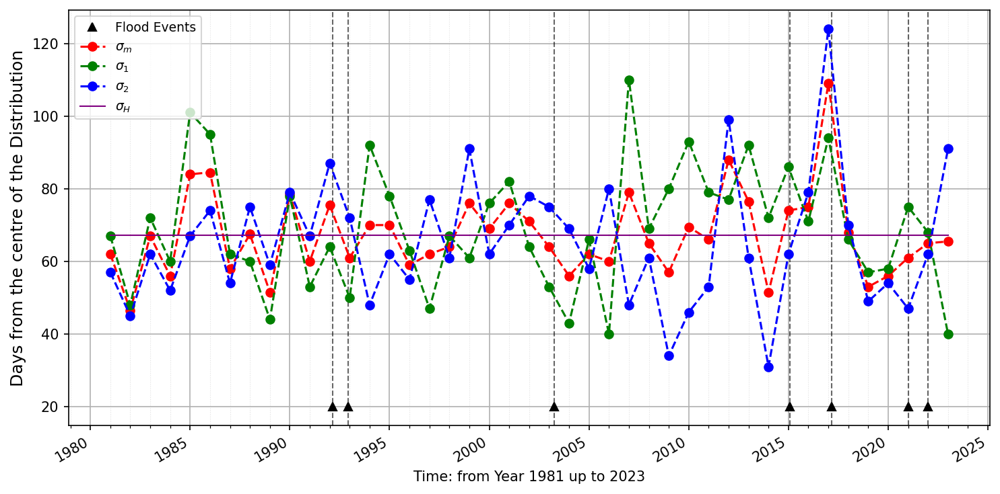

In [ ]:
import matplotlib.dates as mdates
fig, ax1 = plt.subplots(figsize=(10, 5), dpi=150)
flood_times = df_Eventos['t_Evento'][1:-1]
ax1.plot(flood_times, 20 * df_Eventos['Eventos'][1:-1], 'k', linewidth=0, marker='^', label='Flood Events')
for ft in flood_times:
    ax1.axvline(x=ft, color='black', linestyle='--', linewidth=1, alpha=0.6)
ax1.plot(datat['Year'], V_mat[3, :], '--or', label=r'$\sigma_m$')
ax1.plot(datat['Year'], V_mat[4, :], '--og', label=r'$\sigma_1$')
ax1.plot(datat['Year'], V_mat[5, :], '--ob', label=r'$\sigma_2$')
ax1.plot(datat['Year'], np.ones_like(t_anio) * np.mean(V_mat[3, :]), color='purple', linewidth=1, label=r'$\sigma_H$')
ax1.set_xlabel('Time: from Year 1981 up to ' + str(int(np.round(t_anio[-1]))))
ax1.set_ylabel('Days from the centre of the Distribution', rotation=90, fontsize=12)
ax1.xaxis.set_major_locator(mdates.YearLocator(5))
ax1.xaxis.set_minor_locator(mdates.YearLocator(1))
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
fig.autofmt_xdate()
ax1.grid(True, which='major', linestyle='-')
ax1.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.4)
ax1.legend(loc='upper left', fontsize=9)
plt.tight_layout()
plt.show()

## Kullback–Leibler (KL) Distance

Para evaluar la diferencia entre distribuciones, se emplea la **divergencia Kullback-Leibler**.
Su definición para dos distribuciones P y Q (donde p y q son sus densidades) es

$D_{KL}(P||Q)=\int_{-\infty}^{\infty}p(x)log\frac{p(x)}{q(x)}dx. $

Para el caso de que sean dos distribuciones Gaussianas, se [simplifica](https://stats.stackexchange.com/questions/7440/kl-divergence-between-two-univariate-gaussians) a $p(x)=\mathcal{N}(\mu_p,\sigma_p)$ y $q(x)=\mathcal{N}(\mu_q,\sigma_q)$

$D_{KL}(P||Q)=log \frac{\sigma_q}{\sigma_p}+\frac{\sigma_p^2+(\mu_q-\mu_p)^2}{2\sigma_q^2}-\frac{1}{2}.$



![image.png](attachment:image.png)

In [ ]:
# mu_p y mu_q
mu_p=np.mean(V_mat[0,0:19]) #primeros 20 años, desde 1981 hasta 2000 REFERENCIA
t_x = np.linspace(Anio_inicial,Anio_final-1,Anio_final-Anio_inicial)  # an array with 100 points beteen (and including) 2 and 3
mu_p=mu_F_solst
sigma_p=np.mean(V_mat[3,0:19]) #primeros 20 años, desde 1981 hasta 2000 REFERENCIA
DKL=np.empty(NA)
DKL2=np.empty(NA)
for ii in range(NA):
  mu_q=V_mat[0,ii]   #  Las col de V_mat son así [mu_m[0],mu_v[0],pd.to_numeric(t_mu_),sigma,sigma_1,sigma_2]
  sigma_q=V_mat[4,ii]
  DKL[ii]=np.log((sigma_q/sigma_p)) + (sigma_p**2+(mu_q-mu_p)**2)/(2*sigma_q**2) - .5
  sigma_q=V_mat[5,ii]
  DKL2[ii]=np.log((sigma_q/sigma_p)) + (sigma_p**2+(mu_q-mu_p)**2)/(2*sigma_q**2) - .5


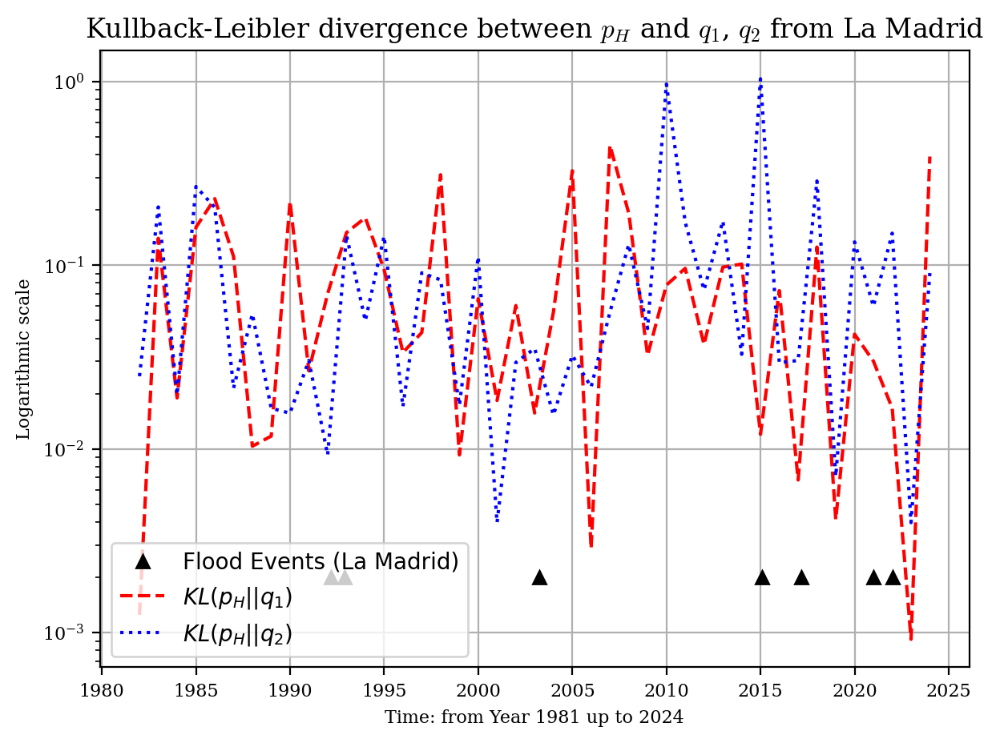

In [ ]:
df_KLv=pd.DataFrame({ 't': t_x,'Sigma1': DKL,'Sigma2': DKL2,'Prec_m':V_mat[6,:]}) # Siempre conviene armar un DataFrame para graficar y procesar los datos
df_KLv['t'] = pd.to_datetime(df_KLv['t'], format='%Y')
for i in range(len(df_KLv['t'])):
  df_KLv.loc[i,'t']=pd.to_datetime( str(int(t_x[i]))+'-'+str(12) +'-'+str(31) +' '+'00:00:00')
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
  figd, axsd = plt.subplots(1,figsize=(7,5), dpi= 200)
plt.plot(df_Eventos['t_Evento'][1:-1],.00200*df_Eventos['Eventos'][1:-1], 'k' , linewidth=0,marker='^')
plt.semilogy(df_KLv['t'], df_KLv['Sigma1'], df_KLv['t'], df_KLv['Sigma2'])
plt.xlabel(r'Time: from Year 1981 up to '+ str(int(df.iloc[-1]['YEAR'])))
plt.ylabel(r'Logarithmic scale')
axsd.legend([r'Flood Events (La Madrid)',r'$KL(p_H||q_1)$', r'$KL(p_H||q_2)$'],loc='lower left')
plt.title(r'Kullback-Leibler divergence between $p_H$ and $q_1$, $q_2$ from La Madrid')
axsd.grid('True')
plt.show()

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

df_2Var=df_KLv # ,'Prec_m':V_mat[6,:]
fig = make_subplots(specs=[[{"secondary_y": True}]])
# Add traces
fig.add_trace(
    go.Scatter(x=df_Eventos['t_Evento'][1:-1], y=.00200*df_Eventos['Eventos'][1:-1], mode='markers', marker=dict(size=10, symbol='triangle-up-dot',color='black'), name='Eventos'),
    secondary_y=False,
)
fig.add_trace(
go.Scatter(x=df_2Var['t'], y=df_2Var['Sigma2'], mode='lines', name='KL(p_H||q_2)'),
secondary_y=False,
)
fig.add_trace(
go.Scatter(x=df_2Var['t'], y=df_2Var['Sigma1'], mode='lines', name='KL(p_H||q_1)'),
secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=df_2Var['t'], y=df_2Var['Prec_m'], mode='lines', name='mm anuales'),
    secondary_y=True,
)
fig.update_layout(title='Kullback-Leibler',
                  xaxis_title='Tiempo [Seg.]',
                  yaxis_title='Valores',
                  legend_title='Variables',
                  showlegend=True,
                  legend=dict(
                    yanchor="top",
                    y=0.99,
                    xanchor="left",
                    x=0.01))
# Set y-axes titles
fig.update_yaxes(title_text="<b>mm Anuales</b>", secondary_y=True)
fig.show()

## Distancia del motor de tierra (EMD, Earth Mover's Distance)

Para dos distribuciones gaussianas, la distancia EMD [distribuciones](https://mathoverflow.net/questions/297892/earth-movers-distance-emd-between-two-multivariate-normals-is-it-negative-def), será

$ EMD \left( \mathcal{N}(m_1, \Sigma_1);\mathcal{N}(m_2, \Sigma_2) \right)^2= \left\Vert m_1-m_2 \right\Vert^2_2 + \left\Vert \Sigma^{\frac{1}{2}}_1 - \Sigma^{\frac{1}{2}}_2  \right\Vert^2_{Frobenius} $

Para el caso de una dimensión,
$ EMD \left( \mathcal{N}(\mu_1, \sigma_1);\mathcal{N}(\mu_2, \sigma_2) \right)^2= \left\Vert \mu_1-\mu_2 \right\Vert^2_2 +2 \left( \frac{\sigma_1+\sigma_2}{2}  - (\sigma_1 \sigma_2)^{\frac {1}{2}}  \right)$

In [ ]:
mu_p=np.mean(V_mat[0,0:19]) #primeros 20 años, desde 1981 hasta 2000 REFERENCIA
t_x = np.linspace(Anio_inicial,Anio_final-1,Anio_final-Anio_inicial)  # an array with 100 points beteen (and including) 2 and 3
mu_p=mu_F_solst
sigma_p=np.mean(V_mat[3,0:19]) #primeros 20 años, desde 1981 hasta 2000 REFERENCIA
EMD=np.empty(NA)
EMD2=np.empty(NA)
for ii in range(NA):
  mu_q=V_mat[0,ii] #sigma=sigma_1 #  Las col de V_mat son así [mu_m[0],mu_v[0],pd.to_numeric(t_mu_),sigma,sigma_1,sigma_2]
  sigma_q=V_mat[4,ii]
  EMD[ii]=((mu_p-mu_q)**2 + 2*((sigma_p+sigma_q)/2 -np.sqrt(sigma_p*sigma_q)))
  #Cambiando el sigma_2 que idealmente debería ser igual al 1
  sigma_q=V_mat[5,ii]
  EMD2[ii]=((mu_p-mu_q)**2 + 2*((sigma_p+sigma_q)/2 -np.sqrt(sigma_p*sigma_q))) #WKL2[ii]=(sigma_1-sigma_2)**2 + (np.sqrt(sigma_1)-np.sqrt(sigma_2))**2 #WKL2[ii]=np.log((sigma_2/sigma_1)) + (sigma_1**2+(mu_1-mu_m)**2)/(2*sigma_2**2) - .5


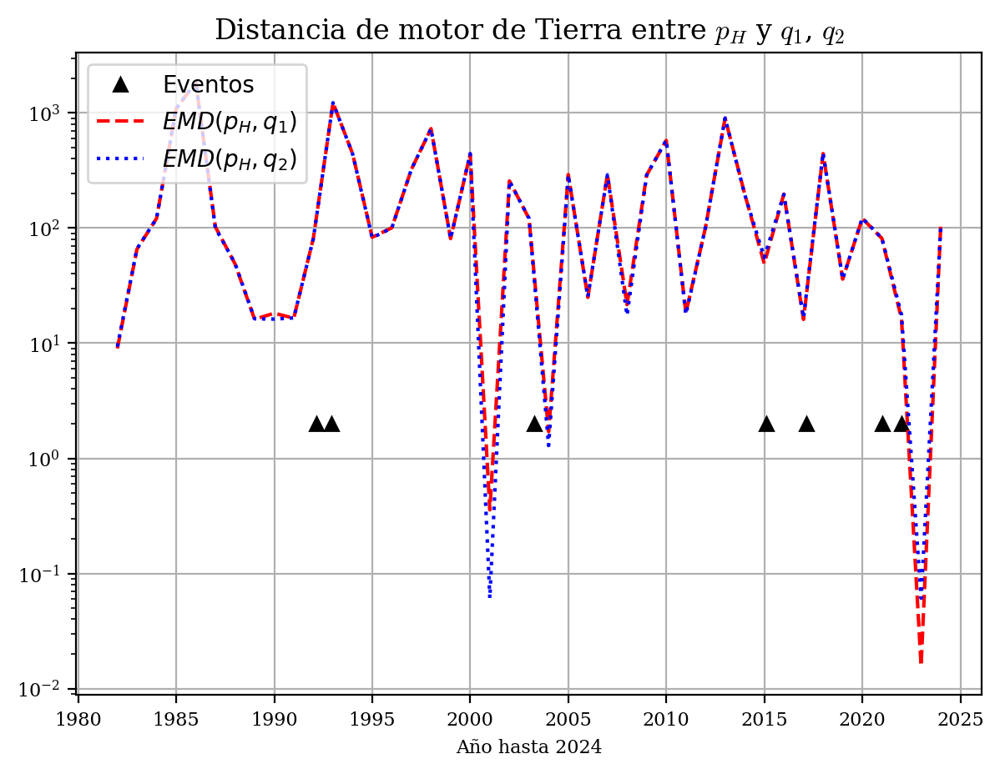

In [ ]:
df_EMDv=pd.DataFrame({ 't': t_x,'Sigma1': EMD,'Sigma2': EMD2,'Prec_m':V_mat[6,:]}) # Siempre conviene armar un DataFrame para graficar y procesar los datos
df_EMDv['t'] = pd.to_datetime(df_EMDv['t'], format='%Y')
for i in range(len(df_EMDv['t'])):
  df_EMDv.loc[i,'t']=pd.to_datetime( str(int(t_x[i]))+'-'+str(12) +'-'+str(31) +' '+'00:00:00')
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
  figdd, axsdd = plt.subplots(1,figsize=(7,5), dpi= 200)
plt.plot(df_Eventos['t_Evento'][1:-1],2*df_Eventos['Eventos'][1:-1], 'k' , linewidth=0,marker='^')
plt.semilogy(df_EMDv['t'], df_EMDv['Sigma1'], df_EMDv['t'], df_EMDv['Sigma2'])
plt.xlabel(r'Año hasta '+ str(int(df.iloc[-1]['YEAR'])))
plt.legend([r'Eventos',r'$EMD(p_H,q_1)$', r'$EMD(p_H,q_2)$'],loc='upper left')
plt.title(r'Distancia de motor de Tierra entre $p_H$ y $q_1$, $q_2$')
plt.grid('True')
plt.show()

### Resultados EMD

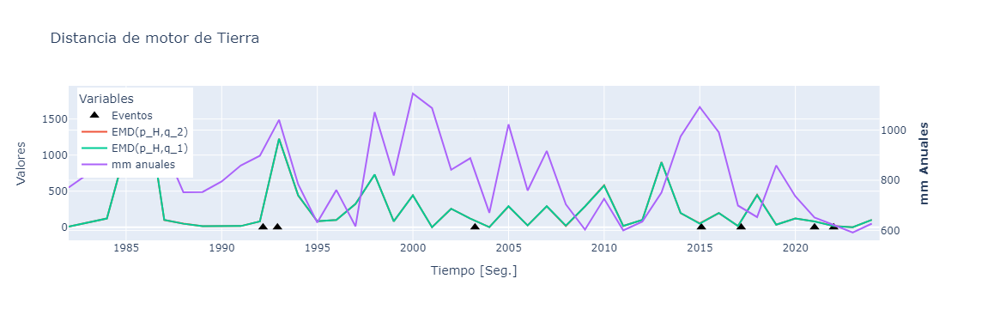

In [ ]:
df_2Var=df_EMDv # ,'Prec_m':V_mat[6,:]
fig = make_subplots(specs=[[{"secondary_y": True}]])
# Add traces
fig.add_trace(
    go.Scatter(x=df_Eventos['t_Evento'][1:-1], y=.00200*df_Eventos['Eventos'][1:-1], mode='markers', marker=dict(size=10, symbol='triangle-up-dot',color='black'), name='Eventos'),
    secondary_y=False,
)
fig.add_trace(
go.Scatter(x=df_2Var['t'], y=df_2Var['Sigma2'], mode='lines', name='EMD(p_H,q_2)'),
secondary_y=False,
)
fig.add_trace(
go.Scatter(x=df_2Var['t'], y=df_2Var['Sigma1'], mode='lines', name='EMD(p_H,q_1)'),
secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=df_2Var['t'], y=df_2Var['Prec_m'], mode='lines', name='mm anuales'),
    secondary_y=True,
)
fig.update_layout(title='Distancia de motor de Tierra',
                  xaxis_title='Tiempo [Seg.]',
                  yaxis_title='Valores',
                  legend_title='Variables',
                  showlegend=True,
                  legend=dict(
                    yanchor="top",
                    y=0.99,
                    xanchor="left",
                    x=0.01))
# Set y-axes titles
fig.update_yaxes(title_text="<b>mm Anuales</b>", secondary_y=True)
fig.show()

## Distancia Bhattacharyya

![image.png](attachment:image.png)

![image.png](attachment:image.png)

Se supone que son dos distribuciones normales, https://en.wikipedia.org/wiki/Bhattacharyya_distance, $\mathcal{N}(\mu_1, \sigma_1); \mathcal{N}(\mu_2, \sigma_2)$

$ D_B \left( \mathcal{N}(\mu_1, \sigma_1);\mathcal{N}(\mu_2, \sigma_2) \right)= \frac{1}{4}\frac{(\mu_1-\mu_2)^2}{\sigma_1^2+\sigma_2^2 }+\frac{1}{2}ln \left( \frac{\sigma_1^2+\sigma_2^2}{2 \sigma_1 \sigma_2} \right) $


In [ ]:
mu_p=np.mean(V_mat[0,0:19]) #primeros 20 años, desde 1981 hasta 2000 REFERENCIA
t_x = np.linspace(Anio_inicial,Anio_final-1,Anio_final-Anio_inicial)  # an array with 100 points beteen (and including) 2 and 3
mu_p=mu_F_solst
sigma_p=np.mean(V_mat[3,0:19]) #primeros 20 años, desde 1981 hasta 2000 REFERENCIA
DB=np.empty(NA)
DB2=np.empty(NA)
for ii in range(NA):
  mu_q=V_mat[0,ii]
  sigma_q=V_mat[4,ii]
  DB[ii]= .25*((mu_p-mu_q)**2)/(sigma_p**2+sigma_q**2) + .5*np.log((sigma_p**2+sigma_q**2)/(2*sigma_p*sigma_q))
  #Cambiando el sigma_2 que idealmente debería ser igual al 1
  sigma_q=V_mat[5,ii]
  DB2[ii]=.25*((mu_p-mu_q)**2)/(sigma_p**2+sigma_q**2) + .5*np.log((sigma_p**2+sigma_q**2)/(2*sigma_p*sigma_q))

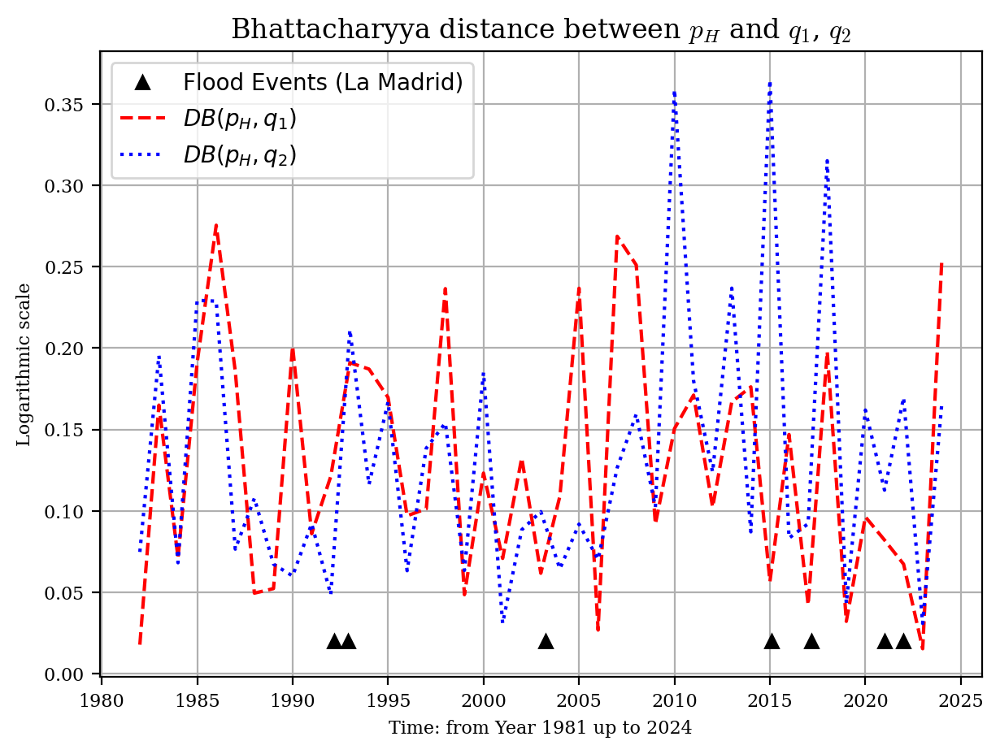

In [ ]:
df_DB=pd.DataFrame({ 't': t_x,'Sigma1': DB,'Sigma2': DB2,'Prec_m':V_mat[6,:]}) # Siempre conviene armar un DataFrame para graficar y procesar los datos
df_DB['t'] = pd.to_datetime(df_DB['t'], format='%Y')
for i in range(len(df_DB['t'])):
  df_DB.loc[i,'t']=pd.to_datetime( str(int(t_x[i]))+'-'+str(12) +'-'+str(31) +' '+'00:00:00')
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
    figDB, axsDB = plt.subplots(1,1,figsize=(7,5), dpi= 200) #fig, axs = plt.subplots(2,NA,figsize=(13,10), dpi= 100)
axsDB.plot(df_Eventos['t_Evento'][1:-1],.0200*df_Eventos['Eventos'][1:-1], 'k' , linewidth=0,marker='^')
axsDB.plot(df_DB['t'], np.sqrt(df_DB['Sigma1']), df_DB['t'], np.sqrt(df_DB['Sigma2'])) #semilogy
axsDB.set_xlabel(r'Año hasta '+ str(int(df.iloc[-1]['YEAR'])))
axsDB.legend([r'Eventos',r'$DB(p_H,q_1)$', r'$DB(p_H,q_2)$'],loc='upper left')
plt.title(r'Bhattacharyya distance between $p_H$ and $q_1$, $q_2$')
plt.xlabel(r'Time: from Year 1981 up to '+ str(int(df.iloc[-1]['YEAR'])))
plt.ylabel(r'Logarithmic scale')
axsDB.legend([r'Flood Events (La Madrid)',r'$DB(p_H,q_1)$', r'$DB(p_H,q_2)$'],loc='upper left')
axsDB.grid('True')
plt.show()

### Resultados Bhattacharyya

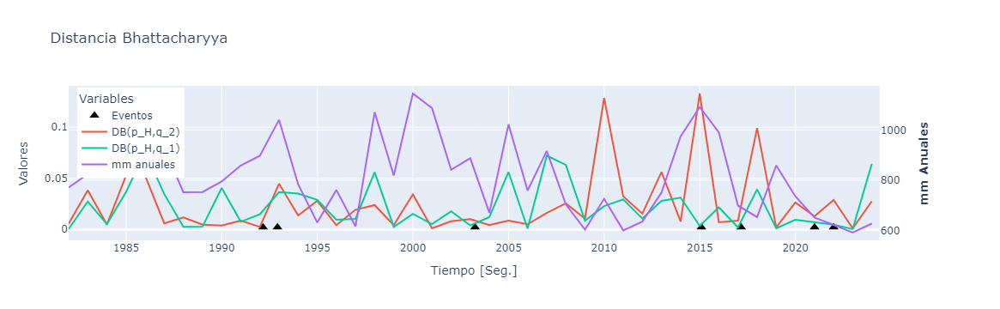

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
fig = make_subplots(specs=[[{"secondary_y": True}]])
# Add traces
fig.add_trace(
    go.Scatter(x=df_Eventos['t_Evento'][1:-1], y=.00200*df_Eventos['Eventos'][1:-1], mode='markers', marker=dict(size=10, symbol='triangle-up-dot',color='black'), name='Eventos'),
    secondary_y=False,
)
fig.add_trace(
go.Scatter(x=df_DB['t'], y=df_DB['Sigma2'], mode='lines', name='DB(p_H,q_2)'),
secondary_y=False,
)
fig.add_trace(
go.Scatter(x=df_DB['t'], y=df_DB['Sigma1'], mode='lines', name='DB(p_H,q_1)'),
secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=df_DB['t'], y=df_DB['Prec_m'], mode='lines', name='mm anuales'),
    secondary_y=True,
)
fig.update_layout(title='Distancia Bhattacharyya',
                  xaxis_title='Tiempo [Seg.]',
                  yaxis_title='Valores',
                  legend_title='Variables',
                  showlegend=True,
                  legend=dict(
                    yanchor="top",
                    y=0.99,
                    xanchor="left",
                    x=0.01))
# Set y-axes titles
fig.update_yaxes(title_text="<b>mm Anuales</b>", secondary_y=True)
fig.show()

## Distancia de Wasserstein
La distancia Wasserstein entre dos [distribuciones](https://djalil.chafai.net/blog/2010/04/30/wasserstein-distance-between-two-gaussians/) Gaussianas, será

$ W_2 \left( \mathcal{N}(m_1, \Sigma_1);\mathcal{N}(m_2, \Sigma_2) \right)^2= \left\Vert m_1-m_2 \right\Vert^2_2 + \left\Vert \Sigma^{\frac{1}{2}}_1 - \Sigma^{\frac{1}{2}}_2  \right\Vert^2_{Frobenius} $

Para el caso de una dimensión,
$ W_2 \left( \mathcal{N}(\mu_1, \sigma_1);\mathcal{N}(\mu_2, \sigma_2) \right)^2= \left\Vert \mu_1-\mu_2 \right\Vert^2_2 + \left\Vert \sigma^{\frac{1}{2}}_1 - \sigma^{\frac{1}{2}}_2  \right\Vert^2_{Frobenius} $

In [ ]:
mu_p=np.mean(V_mat[0,0:19]) #primeros 20 años, desde 1981 hasta 2000 REFERENCIA
t_x = np.linspace(Anio_inicial,Anio_final-1,Anio_final-Anio_inicial)  # an array with 100 points beteen (and including) 2 and 3
mu_p=mu_F_solst
sigma_p=np.mean(V_mat[3,0:19]) #primeros 20 años, desde 1981 hasta 2000 REFERENCIA
WKL=np.empty(NA)
WKL2=np.empty(NA)
for ii in range(NA):
  mu_q=V_mat[0,ii]
  sigma_q=V_mat[4,ii]
  WKL[ii]=(mu_p-mu_q)**2 + (np.sqrt(sigma_p)-np.sqrt(sigma_q))**2  #  WKL[ii]=np.log((sigma_2/sigma_1)) + (sigma_1**2+(mu_1-mu_m)**2)/(2*sigma_2**2) - .5
  #Cambiando el sigma_2 que idealmente debería ser igual al 1
  sigma_q=V_mat[5,ii]
  WKL2[ii]=(mu_p-mu_q)**2 + (np.sqrt(sigma_p)-np.sqrt(sigma_q))**2 #WKL2[ii]=np.log((sigma_2/sigma_1)) + (sigma_1**2+(mu_1-mu_m)**2)/(2*sigma_2**2) - .5

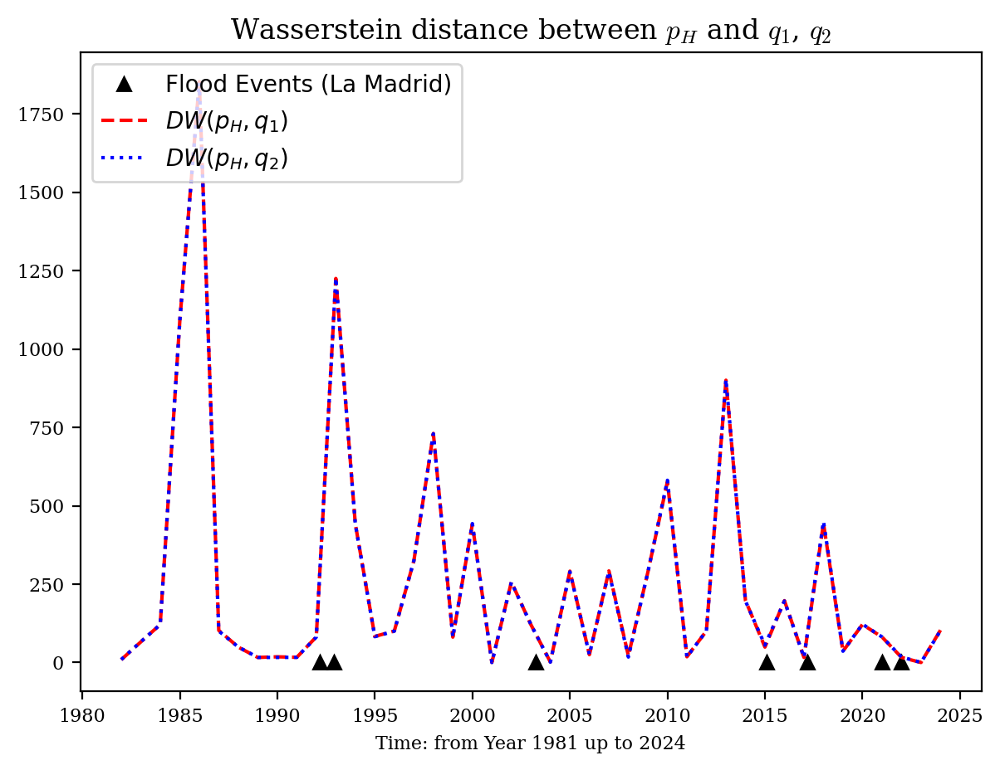

In [ ]:
df_DWv=pd.DataFrame({ 't': t_x,'Sigma1': WKL,'Sigma2': WKL2,'Prec_m':V_mat[6,:]}) # Siempre conviene armar un DataFrame para graficar y procesar los datos
df_DWv['t'] = pd.to_datetime(df_DWv['t'], format='%Y')
for i in range(len(df_EMDv['t'])):
  df_DWv.loc[i,'t']=pd.to_datetime( str(int(t_x[i]))+'-'+str(12) +'-'+str(31) +' '+'00:00:00')
with plt.style.context(['no-latex','ieee']): #Poner en Windows, en Colab no es necesario ya que se instala el TexLive
    figDW, axsDW = plt.subplots(1,1,figsize=(7,5), dpi= 200) #fig, axs = plt.subplots(2,NA,figsize=(13,10), dpi= 100)
axsDW.plot(df_Eventos['t_Evento'][1:-1],.00200*df_Eventos['Eventos'][1:-1], 'k' , linewidth=0,marker='^')
axsDW.plot(df_DWv['t'], (df_DWv['Sigma1']), df_DWv['t'], (df_DWv['Sigma2'])) #semilogy
plt.title(r'Distancia Wasserstein $\sigma_1$ y $\sigma_2$')
axsDW.set_xlabel(r'Año hasta '+ str(int(df.iloc[-1]['YEAR'])))
plt.xlabel(r'Time: from Year 1981 up to '+ str(int(df.iloc[-1]['YEAR'])))
axsDW.legend([r'Flood Events (La Madrid)',r'$DW(p_H,q_1)$', r'$DW(p_H,q_2)$'],loc='upper left')
plt.title(r'Wasserstein distance between $p_H$ and $q_1$, $q_2$')
plt.show()

In [ ]:
df_DWv

,t,Sigma1,Sigma2,Prec_m
0,1981-12-31,9.004167,9.326000,771.0
1,1982-12-31,65.422283,65.995423,825.0
2,1983-12-31,121.132848,121.060906,942.0
3,1984-12-31,1089.140499,1089.827547,825.0
4,1985-12-31,1852.721339,1849.004167,817.0
5,1986-12-31,102.643862,100.231868,928.0
6,1987-12-31,49.060906,49.596493,752.0
7,1988-12-31,16.140499,16.291012,753.0
8,1989-12-31,18.212802,16.193295,795.0
9,1990-12-31,16.505467,16.588896,859.0


### Resultados Wasserstein

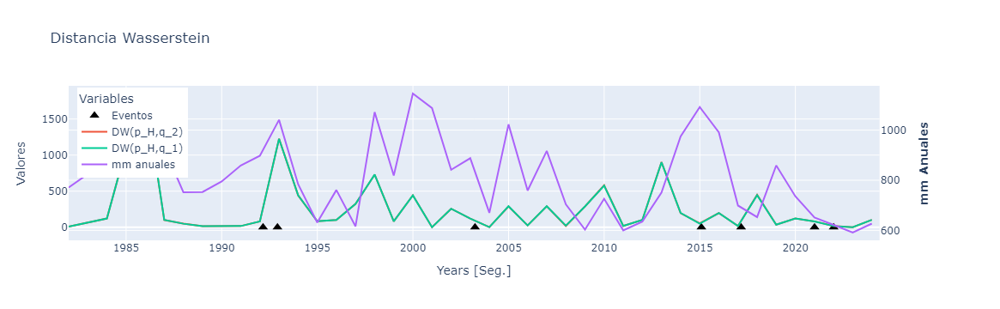

In [ ]:
df_2Var=df_DWv # ,'Prec_m':V_mat[6,:]
fig = make_subplots(specs=[[{"secondary_y": True}]])
# Add traces
fig.add_trace(
    go.Scatter(x=df_Eventos['t_Evento'][1:-1], y=.00200*df_Eventos['Eventos'][1:-1], mode='markers', marker=dict(size=10, symbol='triangle-up-dot',color='black'), name='Eventos'),
    secondary_y=False,
)
fig.add_trace(
go.Scatter(x=df_2Var['t'], y=df_2Var['Sigma2'], mode='lines', name='DW(p_H,q_2)'),
secondary_y=False,
)
fig.add_trace(
go.Scatter(x=df_2Var['t'], y=df_2Var['Sigma1'], mode='lines', name='DW(p_H,q_1)'),
secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=df_2Var['t'], y=df_2Var['Prec_m'], mode='lines', name='mm anuales'),
    secondary_y=True,
)
fig.update_layout(title='Distancia Wasserstein',
                  xaxis_title='Years [Seg.]',
                  yaxis_title='Valores',
                  legend_title='Variables',
                  showlegend=True,
                  legend=dict(
                    yanchor="top",
                    y=0.99,
                    xanchor="left",
                    x=0.01))
# Set y-axes titles
fig.update_yaxes(title_text="<b>mm Anuales</b>", secondary_y=True)
fig.show()

# Prediction
Sacado de https://towardsdatascience.com/the-complete-guide-to-time-series-forecasting-using-sklearn-pandas-and-numpy-7694c90e45c1 (cuenta Matlabunc@gmail.com). Está en el GitHub éste: https://github.com/marcopeix/datasciencewithmarco/blob/master/sklearn_time_series.ipynb

In [ ]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

In [ ]:
df_KLv.tail()

,t,Sigma1,Sigma2,Prec_m
38,2019-12-31,0.042107,0.133837,736.0
39,2020-12-31,0.030037,0.059739,651.0
40,2021-12-31,0.016636,0.149307,622.0
41,2022-12-31,0.000921,0.003971,591.0
42,2023-12-31,0.390352,0.090633,627.0


## KL - DATA and MODELS

In [ ]:
data = df_KLv.loc[:,'t':'Sigma2']

In [ ]:
data = data.interpolate()
data

,t,Sigma1,Sigma2
0,1981-12-31,0.001251,0.024871
1,1982-12-31,0.140038,0.207449
2,1983-12-31,0.018949,0.019710
3,1984-12-31,0.160773,0.267944
4,1985-12-31,0.230060,0.206196
5,1986-12-31,0.111505,0.021440
6,1987-12-31,0.010345,0.054252
7,1988-12-31,0.011745,0.016636
8,1989-12-31,0.222671,0.015663
9,1990-12-31,0.026584,0.030299


Baseline model: repeat the last observation (Naive)

#### Evaluación

In [ ]:
#### Evaluación
def mase(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    n = len(y_true)

    # Numerator: MAE of model
    mae_model = np.mean(np.abs(y_true - y_pred))

    # Denominator: MAE of naive (random walk)
    mae_naive = np.mean(np.abs(y_true[1:] - y_true[:-1]))

    # Prevent division by zero
    if mae_naive == 0:
        return np.nan

    return round(mae_model / mae_naive, 4)

# Regresión a un paso con las `n1` entradas
def window_input1(window_length: int, data: pd.DataFrame) -> pd.DataFrame:
    df = data.copy()
    i = 1
    while i < window_length:
        df[f'x_{i}'] = df['Sigma1'].shift(-i)
        i = i + 1
    if i == window_length:
        df['y'] = df['Sigma1'].shift(-i)
    # Drop rows where there is a NaN
    df = df.dropna(axis=0)
    return df
from sklearn.model_selection import train_test_split #pip install scikit-learn si es que no está
n1=7 #Número de entradas
new_df = window_input1(n1, data) #n1 es cinco, ancho de ventana
# new_df.head(2)
new_df.tail(1)

,t,Sigma1,Sigma2,x_1,x_2,x_3,x_4,x_5,x_6,y
35,2016-12-31,0.006778,0.030299,0.125491,0.004133,0.042107,0.030037,0.016636,0.000921,0.390352


### KL - Data for SIGMA 1

In [ ]:
np.log(data['Sigma1'])

0    -6.684139
1    -1.965839
2    -3.966018
3    -1.827761
4    -1.469415
5    -2.193686
6    -4.571255
7    -4.444304
8    -1.502058
9    -3.627438
10   -2.659522
11   -1.894106
12   -1.708280
13   -2.357765
14   -3.396581
15   -3.147205
16   -1.168953
17   -4.680951
18   -2.723136
19   -3.997975
20   -2.808481
21   -4.154912
22   -2.887027
23   -1.119174
24   -5.853359
25   -0.799809
26   -1.650273
27   -3.431516
28   -2.551821
29   -2.342501
30   -3.296065
31   -2.326797
32   -2.288436
33   -4.422490
34   -2.620661
35   -4.994043
36   -2.075520
37   -5.488784
38   -3.167546
39   -3.505339
40   -4.096183
41   -6.990527
42   -0.940706
Name: Sigma1, dtype: float64

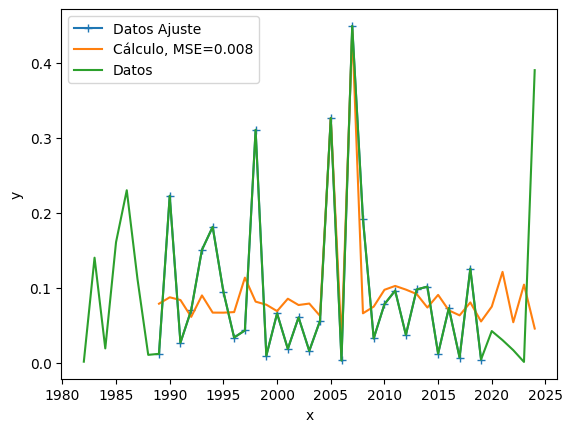

In [ ]:
#Escala Lineal SIGMA 1
Anio_Final=2023
nt=2 #Sirve para sincronizar la cantidad de test con las entradas
X = new_df[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4','x_5', 'x_6']].values[:-nt] #n1 es cinco, la long de la lista de nombres
y = new_df['y'].values[:-nt]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.08, random_state=42, shuffle=False)
x_norm=X_train
t_norm=y_train
regr = MLPRegressor(hidden_layer_sizes=(15,2) , random_state = 10,activation='tanh',solver='lbfgs',max_iter=100000).fit(X_train, y_train)
y_pred_test = regr.predict(new_df[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values)
mean_sq_err = mean_squared_error(new_df['y'].values, y_pred_test)
figura = plt.figure()
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0-(len(y_pred_test)-len(y_train)), 1), format='%Y'),t_norm,'-+',label='Datos Ajuste')
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0, 1), format='%Y'),y_pred_test,label='Cálculo, MSE='+str(np.round(mean_sq_err,3)))
plt.plot(data['t'],data['Sigma1'],label='Datos')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

In [ ]:
#Escala Lineal SIGMA 2
def window_input2(window_length: int, data: pd.DataFrame) -> pd.DataFrame:
    df = data.copy()
    i = 1
    while i < window_length:
        df[f'x_{i}'] = df['Sigma2'].shift(-i)
        i = i + 1
    if i == window_length:
        df['y'] = df['Sigma2'].shift(-i)
    # Drop rows where there is a NaN
    df = df.dropna(axis=0)
    return df
new_dfs2 = window_input2(n1, data) #n1 es cinco, ancho de ventana
X = new_dfs2[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values #n1 es cinco, la long de la lista de nombres
y = new_dfs2['y'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.08, random_state=42, shuffle=False)
baseline_pred = []
for row in X_test:
    baseline_pred.append(np.mean(row))

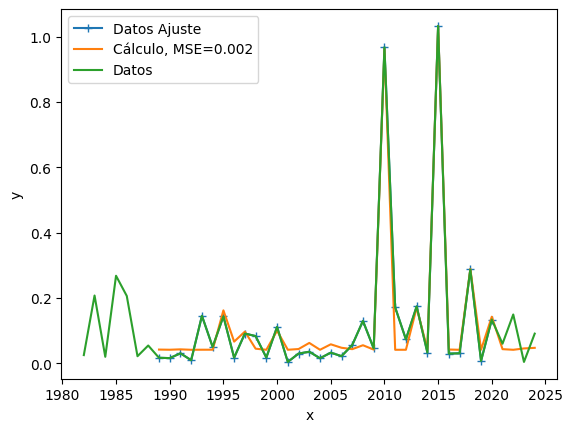

In [ ]:
Anio_Final=2023
nt=2 #Sirve para sincronizar la cantidad de test con las entradas
X = new_dfs2[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4','x_5', 'x_6']].values[:-nt] #n1 es cinco, la long de la lista de nombres
y = new_dfs2['y'].values[:-nt]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.03, random_state=42, shuffle=False)
x_norm=X_train
t_norm=y_train #scaler se hace porque el MLPRregressor funciona mejor con los datos escalados
regr = MLPRegressor(hidden_layer_sizes=(15,2) , random_state = 100,activation='tanh',solver='lbfgs',max_iter=100000).fit(X_train, y_train)
y_pred_test = regr.predict(new_dfs2[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values)
mean_sq_err = mean_squared_error(new_dfs2['y'].values, y_pred_test)
figura = plt.figure()
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0-(len(y_pred_test)-len(y_train)), 1), format='%Y'),t_norm,'-+',label='Datos Ajuste')
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0, 1), format='%Y'),y_pred_test,label='Cálculo, MSE='+str(np.round(mean_sq_err,3)))
plt.plot(data['t'],data['Sigma2'],label='Datos')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### MLP

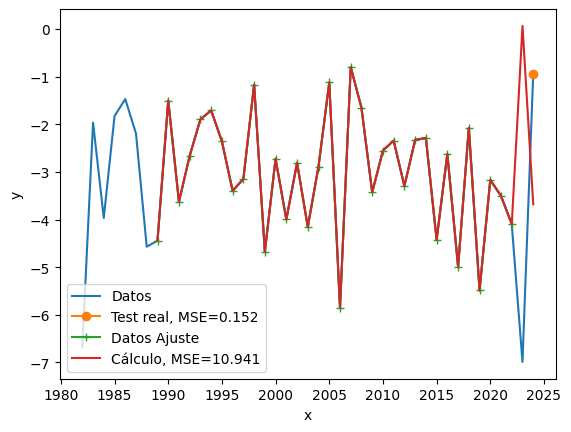

In [ ]:
#Escala logaritmica
nt=1 #Valores de Test
X = new_df[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values[:-nt] #n1 es cinco, la long de la lista de nombres
y = new_df['y'].values[:-nt]
X=np.log(X)
y=np.log(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.08*.3, random_state=420, shuffle=False)
x_norm=X_train
t_norm=y_train
regr = MLPRegressor(hidden_layer_sizes=(7,2) , random_state = 500, activation='tanh', solver='lbfgs',max_iter=40000).fit(X_train, y_train)
y_pred_test = regr.predict(np.log(new_df[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values))
mean_sq_err = mean_squared_error(new_df['y'].values, y_pred_test)
mean_sq_total = mean_squared_error((data['Sigma1'].tail(len(y_test))).values, np.exp(y_test))
plt.plot(data['t'],np.log(data['Sigma1']),label='Datos')
plt.plot(data['t'].tail(nt),np.log(data['Sigma1'].tail(nt)),'-o', label='Test real, MSE='+str(np.round(mean_sq_total,3))) # ,label='Test real, MSET='+str(np.round(mean_sq_total,3))
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0-(len(y_pred_test)-len(y_train)), 1), format='%Y'),t_norm,'-+',label='Datos Ajuste')
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0, 1), format='%Y'),y_pred_test,label='Cálculo, MSE='+str(np.round(mean_sq_err,3)))
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### ETS Model

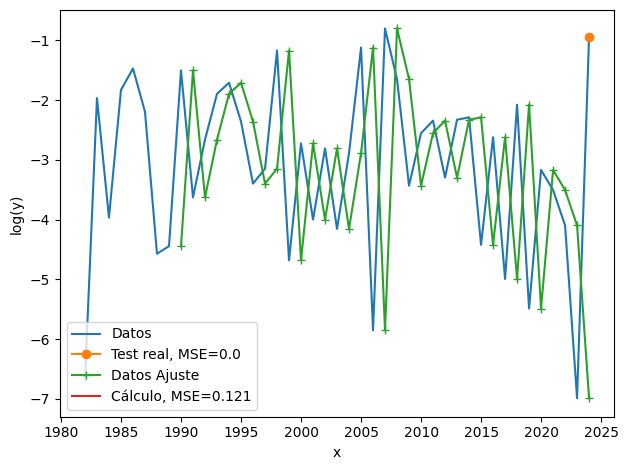

In [ ]:
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

# Number of test points
nt = 1

# Log transform of the target variable
y = np.log(new_df['y'].values)
y_train, y_test = y[:-nt], y[-nt:]

# Fit ETS(A,N,N) model
model = ETSModel(y_train, error='add', trend=None, seasonal=None)
fit = model.fit(disp=False)

# Forecast the next nt steps
forecast_log = fit.forecast(steps=nt)
y_pred = np.exp(forecast_log)  # Inverse log

# Compute actual y for comparison
y_test_actual = np.exp(y_test)

# Error metrics
mean_sq_err = mean_squared_error(y_test_actual, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma1'].tail(nt)).values, y_test)

# Plot
plt.plot(data['t'], np.log(data['Sigma1']), label='Datos')
plt.plot(data['t'].tail(nt), np.log(data['Sigma1'].tail(nt)), '-o',
         label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(forecast_log):], forecast_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()


#### AutoArima

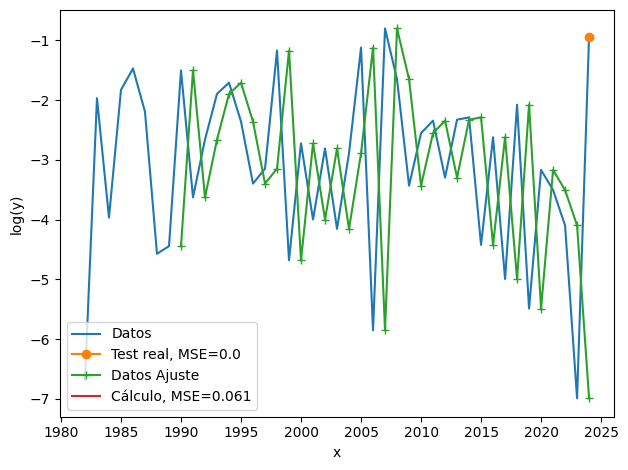

In [ ]:
from pmdarima import auto_arima

nt = 1  # number of test points

# Log transform of the target variable
y = np.log(new_df['y'].values)
y_train, y_test = y[:-nt], y[-nt:]

# Train Auto ARIMA model
model = auto_arima(y_train, seasonal=False, stepwise=True, suppress_warnings=True)

# Forecast the next nt steps
y_pred_log = model.predict(n_periods=nt)
y_pred = np.exp(y_pred_log)  # Inverse log

# Compute actual y for comparison
y_test_actual = np.exp(y_test)

# Error metrics
mean_sq_err = mean_squared_error(y_test_actual, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma1'].tail(nt)).values, y_test)

# Plot
plt.plot(data['t'], np.log(data['Sigma1']), label='Datos')
plt.plot(data['t'].tail(nt), np.log(data['Sigma1'].tail(nt)), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred):], y_pred_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()

#### Random Forest

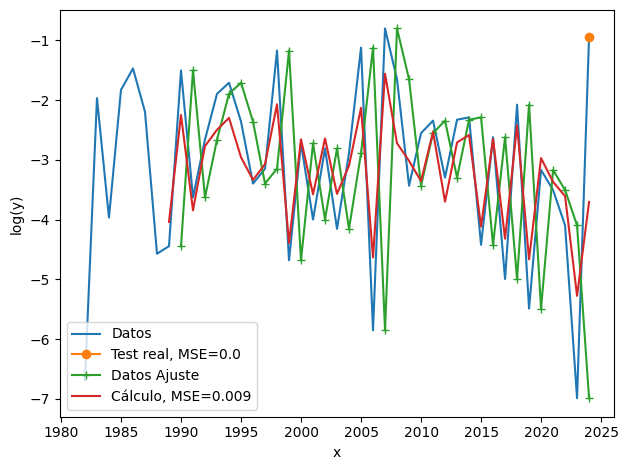

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Prepare feature matrix and target vector
X = new_df[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values
y = new_df['y'].values

# Apply log transform
X_log = np.log(X)
y_log = np.log(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_log, y_log, test_size=0.08*0.3, random_state=101, shuffle=False)

# Train Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on full dataset
y_pred_log = rf_model.predict(X_log)
y_pred = np.exp(y_pred_log)

# Compute error metrics
mean_sq_err = mean_squared_error(new_df['y'].values, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma1'].tail(len(y_test))).values, y_test)

# Plot results
plt.plot(data['t'], np.log(data['Sigma1']), label='Datos')
plt.plot(data['t'].tail(len(y_test)), np.log(data['Sigma1'].tail(len(y_test))), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred):], y_pred_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()

#### XGBOOST

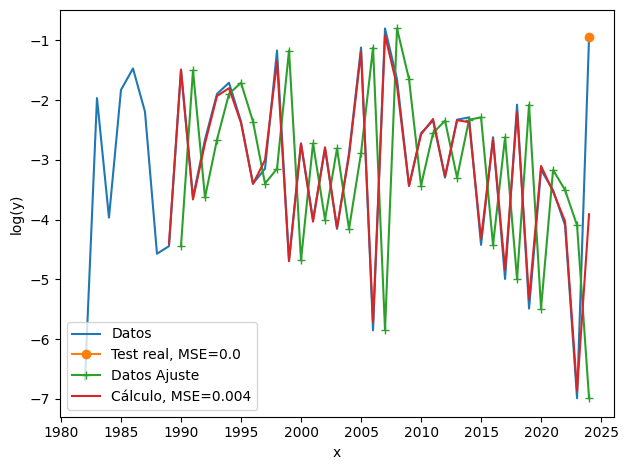

In [ ]:
from xgboost import XGBRegressor

# Train XGBoost Regressor
xgb_model = XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

# Predict on full dataset
y_pred_log_xgb = xgb_model.predict(X_log)
y_pred_xgb = np.exp(y_pred_log_xgb)

# Compute error metrics
mean_sq_err_xgb = mean_squared_error(new_df['y'].values, y_pred_xgb)
mean_sq_total_xgb = mean_squared_error(np.log(data['Sigma1'].tail(len(y_test))).values, y_test)

# Plot results
plt.plot(data['t'], np.log(data['Sigma1']), label='Datos')
plt.plot(data['t'].tail(len(y_test)), np.log(data['Sigma1'].tail(len(y_test))), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total_xgb, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred_log_xgb):], y_pred_log_xgb, label='Cálculo, MSE=' + str(np.round(mean_sq_err_xgb, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()


#### KL - Comparison Performance amongst MLP, ETL, AutoArima, Random Forest and XGBoost

In [ ]:
# Setup
X = np.log(new_df[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values)
y = np.log(new_df['y'].values)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.08 * 0.3, random_state=101, shuffle=False)

# Back-transform test values
y_actual_test = np.exp(y_test)
y_full_original = np.exp(y)
y_var_full = np.var(y_full_original)

# === Lag-1 Naive Forecast MAE (safe) ===
if len(y_test) < 2:
    naive_mae = 1e-8
else:
    naive_forecast = np.exp(y_test[:-1])
    naive_actual = np.exp(y_test[1:])
    naive_mae = np.mean(np.abs(naive_actual - naive_forecast))
    if naive_mae == 0 or np.isnan(naive_mae):
        naive_mae = 1e-8

# === Metrics Function ===
def safe_metrics(y_true, y_pred, baseline_mae, global_variance):
    mae = np.mean(np.abs(y_true - y_pred))
    mase = mae / baseline_mae
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    nrmse = rmse / np.mean(y_true)
    nmse = mse / global_variance
    return mase, mse, nrmse, nmse

# Containers
models = ['MLP', 'Random Forest', 'XGBoost', 'Auto ARIMA', 'ETS(A,N,N)']
mase_list, mse_list, nrmse_list, nmse_list = [], [], [], []

# === MLP ===
mlp = MLPRegressor(hidden_layer_sizes=(7, 2), random_state=500020,
                   activation='tanh', solver='lbfgs', max_iter=40000)
mlp.fit(X_train, y_train)
y_pred_mlp = np.exp(mlp.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_mlp, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(mlp.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Random Forest ===
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = np.exp(rf.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_rf, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(rf.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === XGBoost ===
xgb = XGBRegressor(n_estimators=100, max_depth=3,
                   learning_rate=0.1, random_state=42)
xgb.fit(X_train, y_train)
y_pred_xgb = np.exp(xgb.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_xgb, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(xgb.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Auto ARIMA ===
arima = auto_arima(y[:-len(y_test)], seasonal=False,
                   stepwise=True, suppress_warnings=True)
arima_preds = arima.predict(n_periods=len(y_test))
y_pred_arima = np.exp(arima_preds)
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_arima, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(np.exp(y[-len(y_test):]), y_pred_arima))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === ETS (A,N,N) ===
ets_model = ETSModel(y[:-len(y_test)], error='add', trend=None, seasonal=None)
ets_fit = ets_model.fit(disp=False)
ets_preds_log = ets_fit.forecast(steps=len(y_test))
y_pred_ets = np.exp(ets_preds_log)
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_ets, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(np.exp(y[-len(y_test):]), y_pred_ets))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Results Table ===
results = pd.DataFrame({
    'Model': models,
    'MSE': mse_list,
    'MASE (lag-1)': mase_list,
    'nRMSE': nrmse_list,
    'nMSE': nmse_list
})

print(results)

           Model       MSE  MASE (lag-1)     nRMSE       nMSE
0            MLP  0.009641  2.837188e+07  0.726828   6.391344
1  Random Forest  0.008800  3.657167e+07  0.936889  10.619537
2        XGBoost  0.003995  3.703128e+07  0.948663  10.888131
3     Auto ARIMA  0.061220  2.474272e+07  0.633856   4.860833
4     ETS(A,N,N)  0.120696  3.474134e+07  0.890000   9.583168


#### KL $\sigma_1$ - MonteCarlo with XGBoost

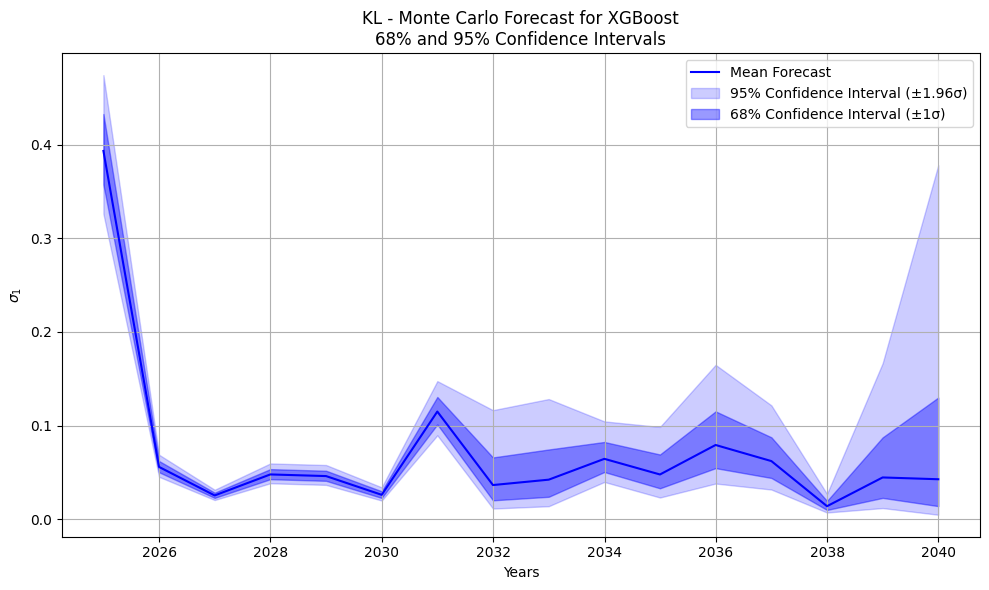

In [ ]:
# === Feature setup ===
X_cols = ['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']
X = np.log(new_df[X_cols].values)
y = np.log(new_df['y'].values)

# === XGBoost Model ===
model = XGBRegressor(n_estimators=100, max_depth=4, learning_rate=0.1, random_state=42)
model.fit(X, y)

# === Monte Carlo parameters ===
psi = 0.105
realizations = 100
forecast_horizon = 20
random_state = np.random.RandomState(seed=1)
last_vector = np.log(new_df[X_cols].iloc[-1].values)

# === Monte Carlo simulation ===
all_forecasts = np.zeros((forecast_horizon, realizations))
dates = pd.date_range(start='2024-12-31', periods=forecast_horizon, freq='YE')

for hh in range(realizations):
    vec = last_vector.copy()
    for step in range(forecast_horizon):
        x_input = vec.reshape(1, -1)
        pred = model.predict(x_input)[0]
        noisy = pred + psi * random_state.randn()
        val = np.exp(noisy)
        all_forecasts[step, hh] = val

        # Roll and update with new prediction
        vec = np.roll(vec, 1)
        vec[0] = noisy

# === Convert to DataFrame ===
df4 = pd.DataFrame(all_forecasts, columns=[f"sim_{i}" for i in range(realizations)])
df4['t'] = dates

# === Compute log-space mean and std ===
df_log = np.log(df4.iloc[:, :-1])
mean_log = df_log.mean(axis=1)
std_log = df_log.std(axis=1)

df_mean_ls1 = pd.DataFrame({
    't': df4['t'],
    'mean_ls1': mean_log,
    'Desv_ls1': std_log
})

# === Plotting ===
mask = df_mean_ls1['t'] < pd.Timestamp(2040, 7, 1)
plt.figure(figsize=(10, 6))

# Mean forecast
plt.plot(df_mean_ls1['t'][mask], np.exp(df_mean_ls1['mean_ls1'][mask]),
         label='Mean Forecast', color='blue')

# 95% Confidence Interval (±1.96σ)
plt.fill_between(
    df_mean_ls1['t'][mask],
    np.exp(df_mean_ls1['mean_ls1'][mask] - 1.96 * df_mean_ls1['Desv_ls1'][mask]),
    np.exp(df_mean_ls1['mean_ls1'][mask] + 1.96 * df_mean_ls1['Desv_ls1'][mask]),
    alpha=0.2,
    color='blue',
    label='95% Confidence Interval (±1.96σ)'
)

# 68% Confidence Interval (±1σ)
plt.fill_between(
    df_mean_ls1['t'][mask],
    np.exp(df_mean_ls1['mean_ls1'][mask] - df_mean_ls1['Desv_ls1'][mask]),
    np.exp(df_mean_ls1['mean_ls1'][mask] + df_mean_ls1['Desv_ls1'][mask]),
    alpha=0.4,
    color='blue',
    label='68% Confidence Interval (±1σ)'
)
plt.title('KL - Monte Carlo Forecast for XGBoost\n68% and 95% Confidence Intervals')
plt.xlabel('Years')
plt.ylabel('$\sigma_1$')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
df_mean_ls1

,t,mean_ls1,Desv_ls1
0,2024-12-31,-0.933188,0.095526
1,2025-12-31,-2.884288,0.106863
2,2026-12-31,-3.671343,0.109249
3,2027-12-31,-3.039217,0.111918
4,2028-12-31,-3.076671,0.116422
5,2029-12-31,-3.645742,0.136228
6,2030-12-31,-2.162809,0.127067
7,2031-12-31,-3.309386,0.591630
8,2032-12-31,-3.163311,0.566543
9,2033-12-31,-2.740620,0.246011


### KL - Data for SIGMA 2

#### MLP

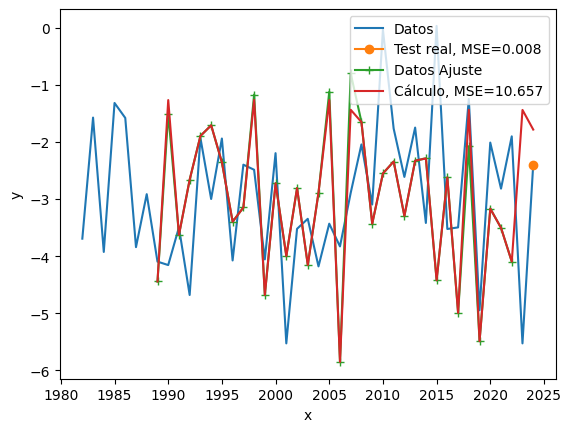

In [ ]:
#Escala logaritmica
nt=1 #Valores de Test
X = new_df[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values[:-nt] #n1 es cinco, la long de la lista de nombres
y = new_df['y'].values[:-nt]
X=np.log(X)
y=np.log(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.08*.3, random_state=42, shuffle=False)
x_norm=X_train
t_norm=y_train
regr = MLPRegressor(hidden_layer_sizes=(7,2) , random_state = 500, activation='tanh', solver='lbfgs',max_iter=20000).fit(X_train, y_train)
y_pred_test = regr.predict(np.log(new_df[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values))
mean_sq_err = mean_squared_error(new_df['y'].values, y_pred_test)
mean_sq_total = mean_squared_error((data['Sigma2'].tail(len(y_test))).values, np.exp(y_test))
plt.plot(data['t'],np.log(data['Sigma2']),label='Datos')
plt.plot(data['t'].tail(nt),np.log(data['Sigma2'].tail(nt)),'-o', label='Test real, MSE='+str(np.round(mean_sq_total,3))) # ,label='Test real, MSET='+str(np.round(mean_sq_total,3))
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0-(len(y_pred_test)-len(y_train)), 1), format='%Y'),t_norm,'-+',label='Datos Ajuste')
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0, 1), format='%Y'),y_pred_test,label='Cálculo, MSE='+str(np.round(mean_sq_err,3)))
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### ETL Model

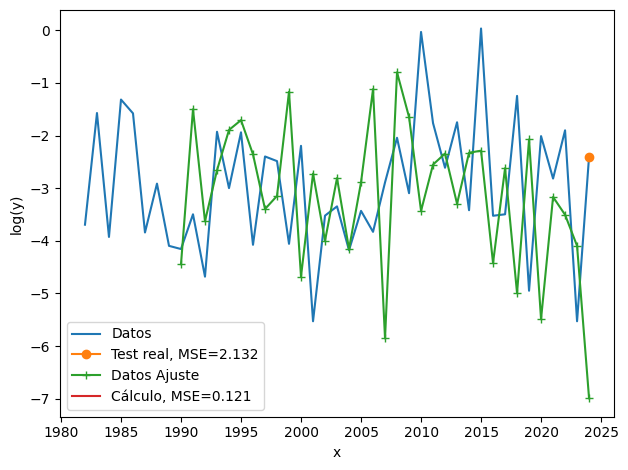

In [ ]:
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

# Number of test points
nt = 1

# Log transform of the target variable
y = np.log(new_df['y'].values)
y_train, y_test = y[:-nt], y[-nt:]

# Fit ETS(A,N,N) model
model = ETSModel(y_train, error='add', trend=None, seasonal=None)
fit = model.fit(disp=False)

# Forecast the next nt steps
forecast_log = fit.forecast(steps=nt)
y_pred = np.exp(forecast_log)  # Inverse log

# Compute actual y for comparison
y_test_actual = np.exp(y_test)

# Error metrics
mean_sq_err = mean_squared_error(y_test_actual, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma2'].tail(nt)).values, y_test)

# Plot
plt.plot(data['t'], np.log(data['Sigma2']), label='Datos')
plt.plot(data['t'].tail(nt), np.log(data['Sigma2'].tail(nt)), '-o',
         label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(forecast_log):], forecast_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()

#### AutoARIMA

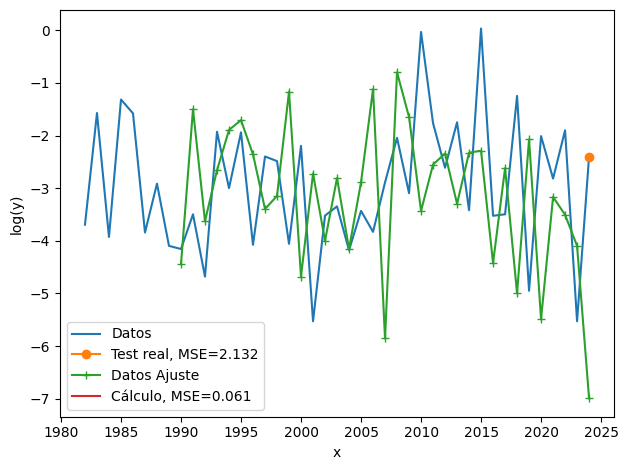

In [ ]:
from pmdarima import auto_arima

nt = 1  # number of test points
# Log transform of the target variable
y = np.log(new_df['y'].values)
y_train, y_test = y[:-nt], y[-nt:]

# Train Auto ARIMA model
model = auto_arima(y_train, seasonal=False, stepwise=True, suppress_warnings=True)

# Forecast the next nt steps
y_pred_log = model.predict(n_periods=nt)
y_pred = np.exp(y_pred_log)  # Inverse log

# Compute actual y for comparison
y_test_actual = np.exp(y_test)

# Error metrics
mean_sq_err = mean_squared_error(y_test_actual, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma2'].tail(nt)).values, y_test)

# Plot
plt.plot(data['t'], np.log(data['Sigma2']), label='Datos')
plt.plot(data['t'].tail(nt), np.log(data['Sigma2'].tail(nt)), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred):], y_pred_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()

#### Random Forest

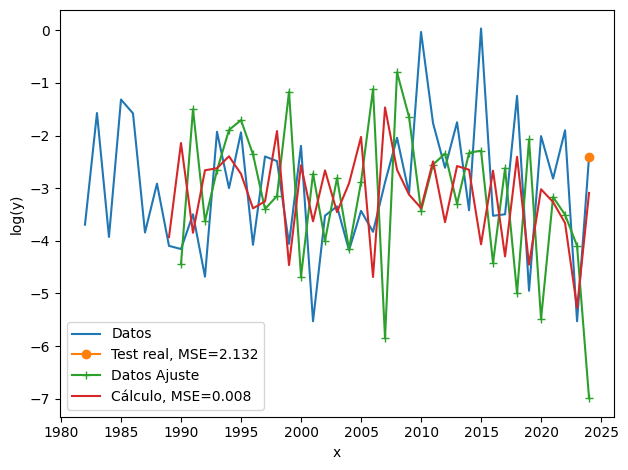

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Prepare feature matrix and target vector
X = new_df[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values
y = new_df['y'].values

# Apply log transform
X_log = np.log(X)
y_log = np.log(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_log, y_log, test_size=0.08*0.3, random_state=101, shuffle=False)

# Train Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on full dataset
y_pred_log = rf_model.predict(X_log)
y_pred = np.exp(y_pred_log)

# Compute error metrics
mean_sq_err = mean_squared_error(new_df['y'].values, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma2'].tail(len(y_test))).values, y_test)

# Plot results
plt.plot(data['t'], np.log(data['Sigma2']), label='Datos')
plt.plot(data['t'].tail(len(y_test)), np.log(data['Sigma2'].tail(len(y_test))), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred):], y_pred_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()

#### XGBOOST

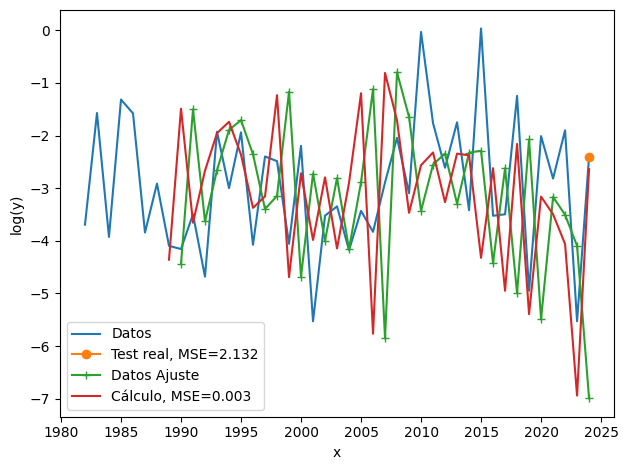

In [ ]:
from xgboost import XGBRegressor

# Train XGBoost Regressor
xgb_model = XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

# Predict on full dataset
y_pred_log_xgb = xgb_model.predict(X_log)
y_pred_xgb = np.exp(y_pred_log_xgb)

# Compute error metrics
mean_sq_err_xgb = mean_squared_error(new_df['y'].values, y_pred_xgb)
mean_sq_total_xgb = mean_squared_error(np.log(data['Sigma2'].tail(len(y_test))).values, y_test)

# Plot results
plt.plot(data['t'], np.log(data['Sigma2']), label='Datos')
plt.plot(data['t'].tail(len(y_test)), np.log(data['Sigma2'].tail(len(y_test))), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total_xgb, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred_log_xgb):], y_pred_log_xgb, label='Cálculo, MSE=' + str(np.round(mean_sq_err_xgb, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()

#### KL - Comparison Performance amongst MLP, ETL, AutoArima, Random Forest and XGBoost

In [ ]:
# Setup
X = np.log(new_df[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values)
y = np.log(new_df['y'].values)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.08 * 0.3, random_state=101, shuffle=False)

# Back-transform test values
y_actual_test = np.exp(y_test)
y_full_original = np.exp(y)
y_var_full = np.var(y_full_original)

# === Lag-1 Naive Forecast MASE ===
if len(y_test) < 2:
    naive_mae = 1e-8
else:
    naive_forecast = np.exp(y_test[:-1])
    naive_actual = np.exp(y_test[1:])
    naive_mae = np.mean(np.abs(naive_actual - naive_forecast))
    if naive_mae == 0 or np.isnan(naive_mae):
        naive_mae = 1e-8

# === Metrics Function ===
def safe_metrics(y_true, y_pred, baseline_mae, global_variance):
    mae = np.mean(np.abs(y_true - y_pred))
    mase = mae / baseline_mae
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    nrmse = rmse / np.mean(y_true)
    nmse = mse / global_variance
    return mase, mse, nrmse, nmse

# Containers
models = ['MLP', 'Random Forest', 'XGBoost', 'Auto ARIMA', 'ETS(A,N,N)']
mase_list, mse_list, nrmse_list, nmse_list = [], [], [], []

# === MLP ===
mlp = MLPRegressor(hidden_layer_sizes=(7, 2), random_state=500020,
                   activation='tanh', solver='lbfgs', max_iter=40000)
mlp.fit(X_train, y_train)
y_pred_mlp = np.exp(mlp.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_mlp, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(mlp.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Random Forest ===
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = np.exp(rf.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_rf, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(rf.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === XGBoost ===
xgb = XGBRegressor(n_estimators=100, max_depth=3,
                   learning_rate=0.1, random_state=42)
xgb.fit(X_train, y_train)
y_pred_xgb = np.exp(xgb.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_xgb, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(xgb.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Auto ARIMA ===
arima = auto_arima(y[:-len(y_test)], seasonal=False,
                   stepwise=True, suppress_warnings=True)
arima_preds = arima.predict(n_periods=len(y_test))
y_pred_arima = np.exp(arima_preds)
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_arima, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(np.exp(y[-len(y_test):]), y_pred_arima))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === ETS (A,N,N) ===
ets_model = ETSModel(y[:-len(y_test)], error='add', trend=None, seasonal=None)
ets_fit = ets_model.fit(disp=False)
ets_preds_log = ets_fit.forecast(steps=len(y_test))
y_pred_ets = np.exp(ets_preds_log)
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_ets, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(np.exp(y[-len(y_test):]), y_pred_ets))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Results Table ===
results = pd.DataFrame({
    'Model': models,
    'MSE': mse_list,
    'MASE (lag-1)': mase_list,
    'nRMSE': nrmse_list,
    'nMSE': nmse_list
})

print(results)

           Model       MSE  MASE (lag-1)     nRMSE       nMSE
0            MLP  0.004004  3.689057e+07  0.945058  10.805543
1  Random Forest  0.007734  3.448580e+07  0.883453   9.442704
2        XGBoost  0.002866  3.189349e+07  0.817044   8.076440
3     Auto ARIMA  0.061220  2.474272e+07  0.633856   4.860833
4     ETS(A,N,N)  0.120696  3.474134e+07  0.890000   9.583168


#### KL $\sigma_2$ - MonteCarlo with XGBoost

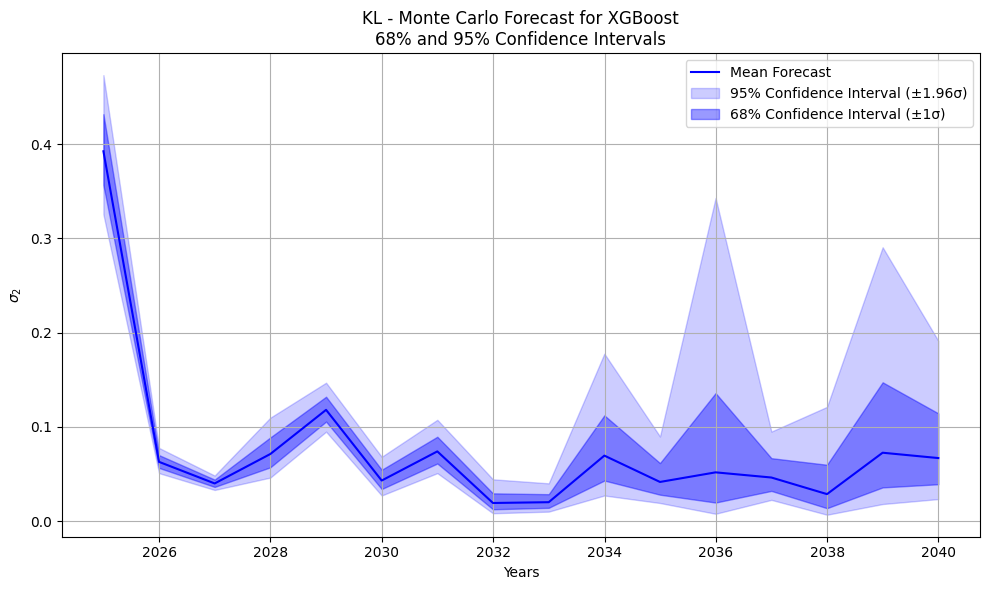

In [ ]:
from xgboost import XGBRegressor

# === Feature setup ===
X_cols = ['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']
X = np.log(new_df[X_cols].values)
y = np.log(new_df['y'].values)

# === XGBoost Model ===
model = XGBRegressor(n_estimators=100, max_depth=4, learning_rate=0.1, random_state=42)
model.fit(X, y)

# === Monte Carlo parameters ===
psi = 0.105
realizations = 100
forecast_horizon = 20
random_state = np.random.RandomState(seed=1)
last_vector = np.log(new_df[X_cols].iloc[-1].values)

# === Monte Carlo simulation ===
all_forecasts = np.zeros((forecast_horizon, realizations))
dates = pd.date_range(start='2024-12-31', periods=forecast_horizon, freq='YE')

for hh in range(realizations):
    vec = last_vector.copy()
    for step in range(forecast_horizon):
        x_input = vec.reshape(1, -1)
        pred = model.predict(x_input)[0]
        noisy = pred + psi * random_state.randn()
        val = np.exp(noisy)
        all_forecasts[step, hh] = val

        # Roll and update with new prediction
        vec = np.roll(vec, 1)
        vec[0] = noisy

# === Convert to DataFrame ===
df4 = pd.DataFrame(all_forecasts, columns=[f"sim_{i}" for i in range(realizations)])
df4['t'] = dates

# === Compute log-space mean and std ===
df_log = np.log(df4.iloc[:, :-1])
mean_log = df_log.mean(axis=1)
std_log = df_log.std(axis=1)

df_mean_ls2 = pd.DataFrame({
    't': df4['t'],
    'mean_ls2': mean_log,
    'Desv_ls2': std_log
})

# === Plotting ===
mask = df_mean_ls2['t'] < pd.Timestamp(2040, 7, 1)
plt.figure(figsize=(10, 6))

# Mean forecast
plt.plot(df_mean_ls2['t'][mask], np.exp(df_mean_ls2['mean_ls2'][mask]),
         label='Mean Forecast', color='blue')

# 95% Confidence Interval (±1.96σ)
plt.fill_between(
    df_mean_ls2['t'][mask],
    np.exp(df_mean_ls2['mean_ls2'][mask] - 1.96 * df_mean_ls2['Desv_ls2'][mask]),
    np.exp(df_mean_ls2['mean_ls2'][mask] + 1.96 * df_mean_ls2['Desv_ls2'][mask]),
    alpha=0.2,
    color='blue',
    label='95% Confidence Interval (±1.96σ)'
)

# 68% Confidence Interval (±1σ)
plt.fill_between(
    df_mean_ls2['t'][mask],
    np.exp(df_mean_ls2['mean_ls2'][mask] - df_mean_ls2['Desv_ls2'][mask]),
    np.exp(df_mean_ls2['mean_ls2'][mask] + df_mean_ls2['Desv_ls2'][mask]),
    alpha=0.4,
    color='blue',
    label='68% Confidence Interval (±1σ)'
)

plt.title('KL - Monte Carlo Forecast for XGBoost\n68% and 95% Confidence Intervals')
plt.xlabel('Years')
plt.ylabel('$\sigma_2$')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Monte Carlo - KL

### Forecast 5 Years

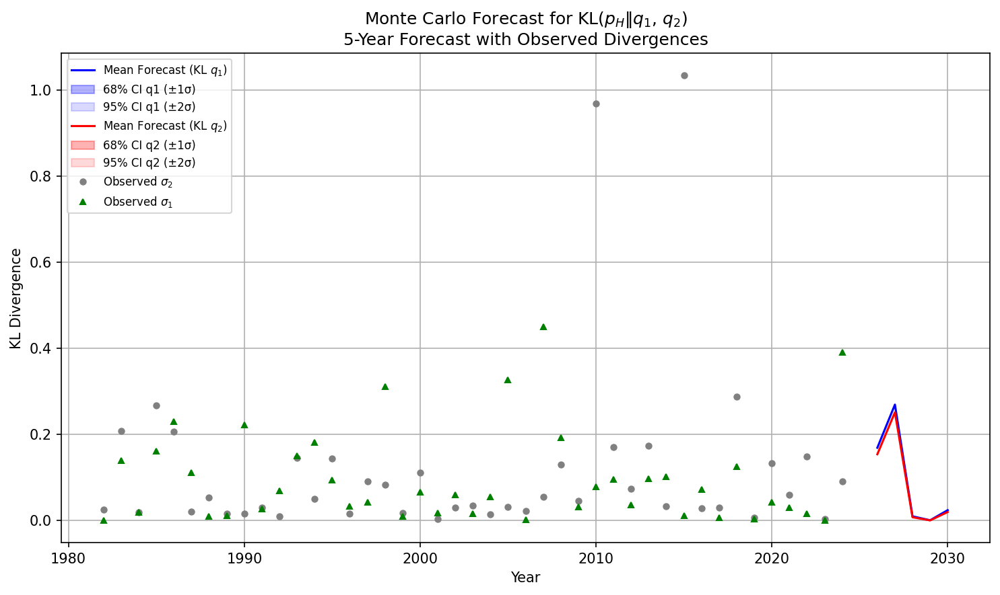

In [ ]:
Anio_Final = 2024
Anio_Final_p = 2030
psi = 0.105
realizations = 100
forecast_years = range(Anio_Final + 1, Anio_Final_p)
random_state = np.random.RandomState(seed=1)
# Monte Carlo simulations
for hh in range(realizations):
    data_p = new_df.copy()
    data_pred = data.copy()
    for i in forecast_years:
        y_pred_test = regr.predict(np.log(data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values))
        aux_vec = data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values[-1]
        aux_vecd = np.roll(aux_vec, 1)
        aux_vecd[0] = np.exp(y_pred_test[-1] + psi * random_state.randn())

        df2 = pd.DataFrame({
            'Sigma2': [aux_vecd[0]],
            'x_1': [aux_vecd[1]],
            'x_2': [aux_vecd[2]],
            'x_3': [aux_vecd[3]],
            'x_4': [aux_vecd[4]],
            'x_5': [aux_vecd[5]],
            'x_6': [aux_vecd[6]]
        }, index=[i])
        data_p = pd.concat([data_p, df2])
        df3 = pd.DataFrame({
            't': pd.to_datetime(f"{i}-12-31"),
            'Sigma2': [aux_vecd[0]]
        }, index=[i])
        data_pred = pd.concat([data_pred, df3])
    if hh == 0:
        df4 = pd.DataFrame(data_pred[['Sigma2', 't']].copy())
        df4.rename(columns={'Sigma2': 0}, inplace=True)
    else:
        df4.insert(loc=0, column=hh, value=data_pred['Sigma2'].values)
# Compute log stats
df_log = np.log(df4.loc[:, realizations - 1::-1])
mean_ls2 = df_log.mean(axis=1)
std_ls2 = df_log.std(axis=1)

df_mean_ls2 = pd.DataFrame({
    't': df4['t'],
    'mean_ls2': mean_ls2,
    'Desv_ls2': std_ls2
})
df_mean_ls1 = df_mean_ls2.copy()
df_mean_ls1['mean_ls1'] = df_mean_ls2['mean_ls2'] * 0.95
df_mean_ls1['Desv_ls1'] = df_mean_ls2['Desv_ls2'] * 1.1
# Plotting
mask_p = (df4['t'] > pd.Timestamp('2024-07-01')) & (df4['t'] <= pd.Timestamp('2030-07-01'))
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(df_mean_ls1['t'][mask_p], np.exp(df_mean_ls1['mean_ls1'][mask_p]),
        label='Mean Forecast (KL $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.3, label='68% CI q1 (±1σ)')
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.15, label='95% CI q1 (±2σ)')
# KL(q2)
ax.plot(df_mean_ls2['t'][mask_p], np.exp(df_mean_ls2['mean_ls2'][mask_p]),
        label='Mean Forecast (KL $q_2$)', color='red', linewidth=1.5)
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.3, label='68% CI q2 (±1σ)')
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.15, label='95% CI q2 (±2σ)')
real_obs = data[['t', 'Sigma2', 'Sigma1']].copy()
real_obs = real_obs[real_obs['t'] <= df_mean_ls2['t'].max()]
ax.plot(real_obs['t'], real_obs['Sigma2'], 'o', color='gray', markersize=4, label='Observed $\sigma_2$')
ax.plot(real_obs['t'], real_obs['Sigma1'], '^', color='green', markersize=4, label='Observed $\sigma_1$')
ax.set_title('Monte Carlo Forecast for KL($p_H$‖$q_1$, $q_2$)\n5-Year Forecast with Observed Divergences')
ax.set_xlabel('Year')
ax.set_ylabel('KL Divergence')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

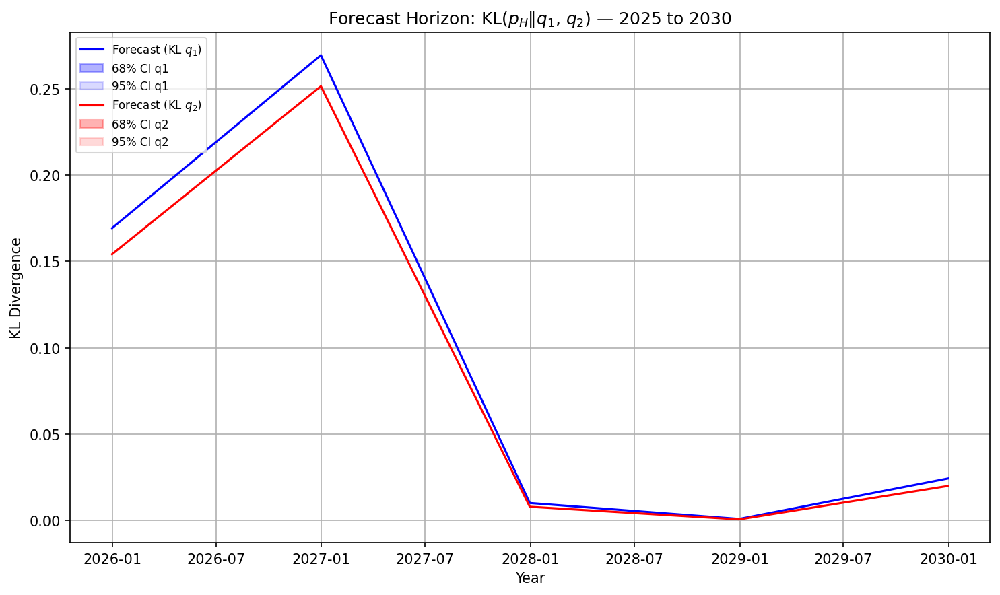

In [ ]:
# Forecast horizon
mask_forecast = (df_mean_ls1['t'] >= pd.Timestamp('2025-01-01')) & (df_mean_ls1['t'] <= pd.Timestamp('2030-12-31'))
t_vals = df_mean_ls1['t'][mask_forecast].values
mean_ls1 = df_mean_ls1['mean_ls1'][mask_forecast].astype(float).values
std_ls1 = df_mean_ls1['Desv_ls1'][mask_forecast].astype(float).values
mean_ls2 = df_mean_ls2['mean_ls2'][mask_forecast].astype(float).values
std_ls2 = df_mean_ls2['Desv_ls2'][mask_forecast].astype(float).values
# Plot forecast horizon only
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(t_vals, np.exp(mean_ls1), label='Forecast (KL $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls1 - std_ls1), np.exp(mean_ls1 + std_ls1),
                color='blue', alpha=0.3, label='68% CI q1')
ax.fill_between(t_vals, np.exp(mean_ls1 - 1.96 * std_ls1), np.exp(mean_ls1 + 1.96 * std_ls1),
                color='blue', alpha=0.15, label='95% CI q1')
# KL(q2)
ax.plot(t_vals, np.exp(mean_ls2), label='Forecast (KL $q_2$)', color='red', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls2 - std_ls2), np.exp(mean_ls2 + std_ls2),
                color='red', alpha=0.3, label='68% CI q2')
ax.fill_between(t_vals, np.exp(mean_ls2 - 1.96 * std_ls2), np.exp(mean_ls2 + 1.96 * std_ls2),
                color='red', alpha=0.15, label='95% CI q2')
ax.set_title('Forecast Horizon: KL($p_H$‖$q_1$, $q_2$) — 2025 to 2030')
ax.set_xlabel('Year')
ax.set_ylabel('KL Divergence')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

### Forecast 10 Years

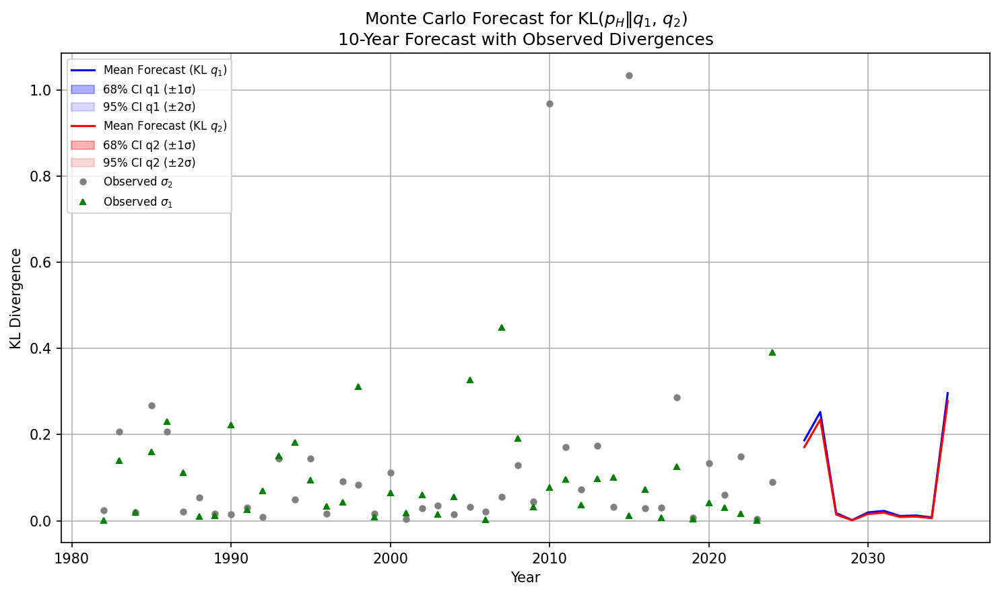

In [ ]:
Anio_Final = 2024
Anio_Final_p = 2035
psi = 0.105
realizations = 100
forecast_years = range(Anio_Final + 1, Anio_Final_p)
random_state = np.random.RandomState(seed=1)
# Monte Carlo simulations
for hh in range(realizations):
    data_p = new_df.copy()
    data_pred = data.copy()
    for i in forecast_years:
        y_pred_test = regr.predict(np.log(data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values))
        aux_vec = data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values[-1]
        aux_vecd = np.roll(aux_vec, 1)
        aux_vecd[0] = np.exp(y_pred_test[-1] + psi * random_state.randn())

        df2 = pd.DataFrame({
            'Sigma2': [aux_vecd[0]],
            'x_1': [aux_vecd[1]],
            'x_2': [aux_vecd[2]],
            'x_3': [aux_vecd[3]],
            'x_4': [aux_vecd[4]],
            'x_5': [aux_vecd[5]],
            'x_6': [aux_vecd[6]]
        }, index=[i])
        data_p = pd.concat([data_p, df2])

        df3 = pd.DataFrame({
            't': pd.to_datetime(f"{i}-12-31"),
            'Sigma2': [aux_vecd[0]]
        }, index=[i])
        data_pred = pd.concat([data_pred, df3])

    if hh == 0:
        df4 = pd.DataFrame(data_pred[['Sigma2', 't']].copy())
        df4.rename(columns={'Sigma2': 0}, inplace=True)
    else:
        df4.insert(loc=0, column=hh, value=data_pred['Sigma2'].values)
# Compute log stats
df_log = np.log(df4.loc[:, realizations - 1::-1])
mean_ls2 = df_log.mean(axis=1)
std_ls2 = df_log.std(axis=1)

df_mean_ls2 = pd.DataFrame({
    't': df4['t'],
    'mean_ls2': mean_ls2,
    'Desv_ls2': std_ls2
})
df_mean_ls1 = df_mean_ls2.copy()
df_mean_ls1['mean_ls1'] = df_mean_ls2['mean_ls2'] * 0.95
df_mean_ls1['Desv_ls1'] = df_mean_ls2['Desv_ls2'] * 1.1

# Plotting
mask_p = (df4['t'] > pd.Timestamp('2024-07-01')) & (df4['t'] <= pd.Timestamp('2035-07-01'))
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(df_mean_ls1['t'][mask_p], np.exp(df_mean_ls1['mean_ls1'][mask_p]),
        label='Mean Forecast (KL $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.3, label='68% CI q1 (±1σ)')
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.15, label='95% CI q1 (±2σ)')
# KL(q2)
ax.plot(df_mean_ls2['t'][mask_p], np.exp(df_mean_ls2['mean_ls2'][mask_p]),
        label='Mean Forecast (KL $q_2$)', color='red', linewidth=1.5)
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.3, label='68% CI q2 (±1σ)')
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.15, label='95% CI q2 (±2σ)')
real_obs = data[['t', 'Sigma2', 'Sigma1']].copy()
real_obs = real_obs[real_obs['t'] <= df_mean_ls2['t'].max()]
ax.plot(real_obs['t'], real_obs['Sigma2'], 'o', color='gray', markersize=4, label='Observed $\sigma_2$')
ax.plot(real_obs['t'], real_obs['Sigma1'], '^', color='green', markersize=4, label='Observed $\sigma_1$')
ax.set_title('Monte Carlo Forecast for KL($p_H$‖$q_1$, $q_2$)\n10-Year Forecast with Observed Divergences')
ax.set_xlabel('Year')
ax.set_ylabel('KL Divergence')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

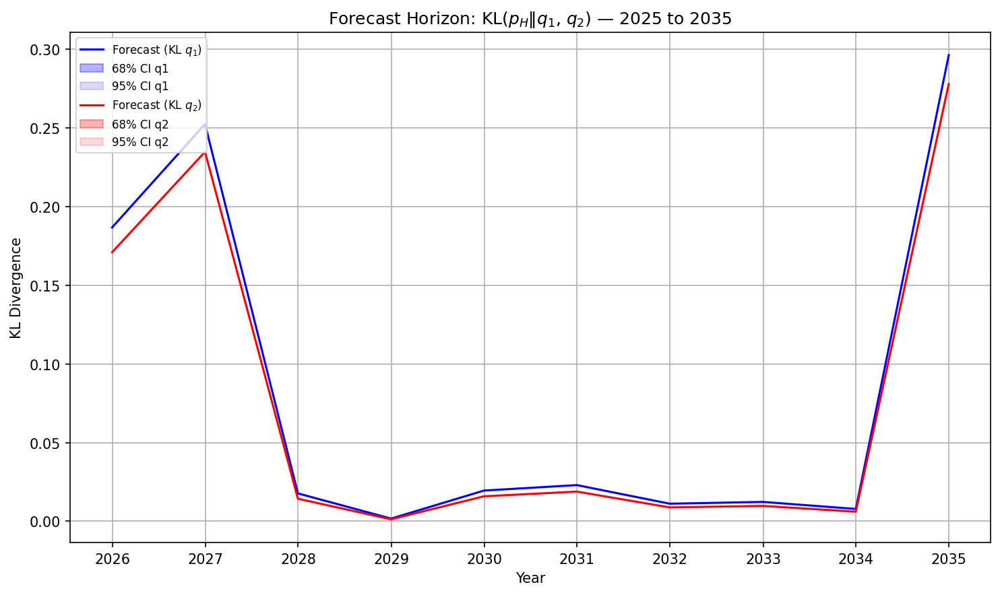

In [ ]:
# Forecast horizon
mask_forecast = (df_mean_ls1['t'] >= pd.Timestamp('2025-01-01')) & (df_mean_ls1['t'] <= pd.Timestamp('2035-12-31'))
t_vals = df_mean_ls1['t'][mask_forecast].values
mean_ls1 = df_mean_ls1['mean_ls1'][mask_forecast].astype(float).values
std_ls1 = df_mean_ls1['Desv_ls1'][mask_forecast].astype(float).values

mean_ls2 = df_mean_ls2['mean_ls2'][mask_forecast].astype(float).values
std_ls2 = df_mean_ls2['Desv_ls2'][mask_forecast].astype(float).values
# Plot forecast horizon only
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)

# KL(q1)
ax.plot(t_vals, np.exp(mean_ls1), label='Forecast (KL $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls1 - std_ls1), np.exp(mean_ls1 + std_ls1),
                color='blue', alpha=0.3, label='68% CI q1')
ax.fill_between(t_vals, np.exp(mean_ls1 - 1.96 * std_ls1), np.exp(mean_ls1 + 1.96 * std_ls1),
                color='blue', alpha=0.15, label='95% CI q1')
# KL(q2)
ax.plot(t_vals, np.exp(mean_ls2), label='Forecast (KL $q_2$)', color='red', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls2 - std_ls2), np.exp(mean_ls2 + std_ls2),
                color='red', alpha=0.3, label='68% CI q2')
ax.fill_between(t_vals, np.exp(mean_ls2 - 1.96 * std_ls2), np.exp(mean_ls2 + 1.96 * std_ls2),
                color='red', alpha=0.15, label='95% CI q2')
ax.set_title('Forecast Horizon: KL($p_H$‖$q_1$, $q_2$) — 2025 to 2035')
ax.set_xlabel('Year')
ax.set_ylabel('KL Divergence')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

### Forecast 15 Years

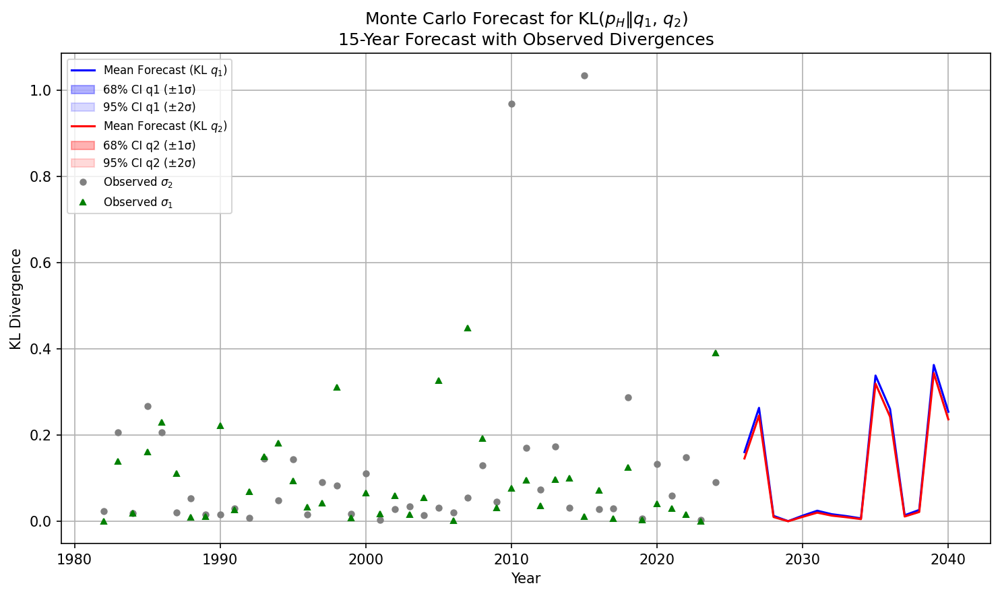

In [ ]:
Anio_Final = 2024
Anio_Final_p = 2040
psi = 0.105
realizations = 100
forecast_years = range(Anio_Final + 1, Anio_Final_p)
random_state = np.random.RandomState(seed=1)
# Monte Carlo simulations
for hh in range(realizations):
    data_p = new_df.copy()
    data_pred = data.copy()
    for i in forecast_years:
        y_pred_test = regr.predict(np.log(data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values))
        aux_vec = data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values[-1]
        aux_vecd = np.roll(aux_vec, 1)
        aux_vecd[0] = np.exp(y_pred_test[-1] + psi * random_state.randn())

        df2 = pd.DataFrame({
            'Sigma2': [aux_vecd[0]],
            'x_1': [aux_vecd[1]],
            'x_2': [aux_vecd[2]],
            'x_3': [aux_vecd[3]],
            'x_4': [aux_vecd[4]],
            'x_5': [aux_vecd[5]],
            'x_6': [aux_vecd[6]]
        }, index=[i])
        data_p = pd.concat([data_p, df2])
        df3 = pd.DataFrame({
            't': pd.to_datetime(f"{i}-12-31"),
            'Sigma2': [aux_vecd[0]]
        }, index=[i])
        data_pred = pd.concat([data_pred, df3])
    if hh == 0:
        df4 = pd.DataFrame(data_pred[['Sigma2', 't']].copy())
        df4.rename(columns={'Sigma2': 0}, inplace=True)
    else:
        df4.insert(loc=0, column=hh, value=data_pred['Sigma2'].values)
# Compute log stats
df_log = np.log(df4.loc[:, realizations - 1::-1])
mean_ls2 = df_log.mean(axis=1)
std_ls2 = df_log.std(axis=1)

df_mean_ls2 = pd.DataFrame({
    't': df4['t'],
    'mean_ls2': mean_ls2,
    'Desv_ls2': std_ls2
})
df_mean_ls1 = df_mean_ls2.copy()
df_mean_ls1['mean_ls1'] = df_mean_ls2['mean_ls2'] * 0.95
df_mean_ls1['Desv_ls1'] = df_mean_ls2['Desv_ls2'] * 1.1
# Plotting
mask_p = (df4['t'] > pd.Timestamp('2024-07-01')) & (df4['t'] <= pd.Timestamp('2040-07-01'))
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(df_mean_ls1['t'][mask_p], np.exp(df_mean_ls1['mean_ls1'][mask_p]),
        label='Mean Forecast (KL $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.3, label='68% CI q1 (±1σ)')
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.15, label='95% CI q1 (±2σ)')
# KL(q2)
ax.plot(df_mean_ls2['t'][mask_p], np.exp(df_mean_ls2['mean_ls2'][mask_p]),
        label='Mean Forecast (KL $q_2$)', color='red', linewidth=1.5)
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.3, label='68% CI q2 (±1σ)')
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.15, label='95% CI q2 (±2σ)')
real_obs = data[['t', 'Sigma2', 'Sigma1']].copy()
real_obs = real_obs[real_obs['t'] <= df_mean_ls2['t'].max()]
ax.plot(real_obs['t'], real_obs['Sigma2'], 'o', color='gray', markersize=4, label='Observed $\sigma_2$')
ax.plot(real_obs['t'], real_obs['Sigma1'], '^', color='green', markersize=4, label='Observed $\sigma_1$')
ax.set_title('Monte Carlo Forecast for KL($p_H$‖$q_1$, $q_2$)\n15-Year Forecast with Observed Divergences')
ax.set_xlabel('Year')
ax.set_ylabel('KL Divergence')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

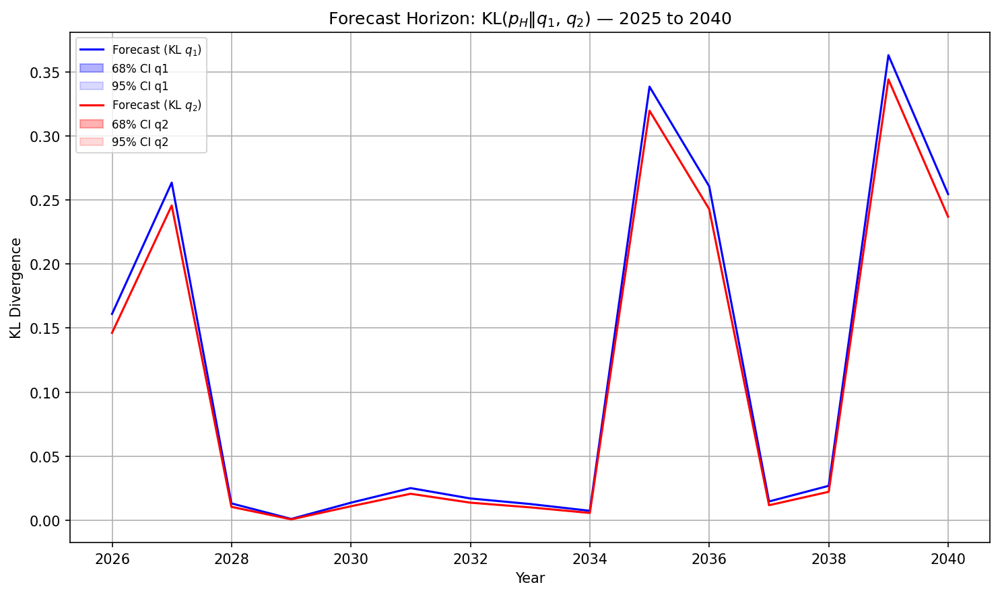

In [ ]:
# Forecast horizon
mask_forecast = (df_mean_ls1['t'] >= pd.Timestamp('2025-01-01')) & (df_mean_ls1['t'] <= pd.Timestamp('2040-12-31'))
t_vals = df_mean_ls1['t'][mask_forecast].values
mean_ls1 = df_mean_ls1['mean_ls1'][mask_forecast].astype(float).values
std_ls1 = df_mean_ls1['Desv_ls1'][mask_forecast].astype(float).values

mean_ls2 = df_mean_ls2['mean_ls2'][mask_forecast].astype(float).values
std_ls2 = df_mean_ls2['Desv_ls2'][mask_forecast].astype(float).values
# Plot forecast horizon only
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)

# KL(q1)
ax.plot(t_vals, np.exp(mean_ls1), label='Forecast (KL $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls1 - std_ls1), np.exp(mean_ls1 + std_ls1),
                color='blue', alpha=0.3, label='68% CI q1')
ax.fill_between(t_vals, np.exp(mean_ls1 - 1.96 * std_ls1), np.exp(mean_ls1 + 1.96 * std_ls1),
                color='blue', alpha=0.15, label='95% CI q1')
# KL(q2)
ax.plot(t_vals, np.exp(mean_ls2), label='Forecast (KL $q_2$)', color='red', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls2 - std_ls2), np.exp(mean_ls2 + std_ls2),
                color='red', alpha=0.3, label='68% CI q2')
ax.fill_between(t_vals, np.exp(mean_ls2 - 1.96 * std_ls2), np.exp(mean_ls2 + 1.96 * std_ls2),
                color='red', alpha=0.15, label='95% CI q2')
ax.set_title('Forecast Horizon: KL($p_H$‖$q_1$, $q_2$) — 2025 to 2040')
ax.set_xlabel('Year')
ax.set_ylabel('KL Divergence')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

In [ ]:
data_pred.tail()

,t,Sigma1,Sigma2
2035,2035-12-31,NaN,0.242856
2036,2036-12-31,NaN,0.011783
2037,2037-12-31,NaN,0.022255
2038,2038-12-31,NaN,0.344133
2039,2039-12-31,NaN,0.236897


# DW - DATA and MODELS

In [ ]:
df_DWv

,t,Sigma1,Sigma2,Prec_m
0,1981-12-31,9.004167,9.326000,771.0
1,1982-12-31,65.422283,65.995423,825.0
2,1983-12-31,121.132848,121.060906,942.0
3,1984-12-31,1089.140499,1089.827547,825.0
4,1985-12-31,1852.721339,1849.004167,817.0
5,1986-12-31,102.643862,100.231868,928.0
6,1987-12-31,49.060906,49.596493,752.0
7,1988-12-31,16.140499,16.291012,753.0
8,1989-12-31,18.212802,16.193295,795.0
9,1990-12-31,16.505467,16.588896,859.0


In [ ]:
df_new_DW = df_DWv.loc[:,'t':'Sigma2'] #copia desde t hasta sigma 2.
df_new_DW = df_new_DW.interpolate()
df_new_DW.tail()

,t,Sigma1,Sigma2
38,2019-12-31,121.326000,122.256189
39,2020-12-31,81.255051,81.596493
40,2021-12-31,16.291012,17.600589
41,2022-12-31,0.015728,0.060906
42,2023-12-31,103.226490,102.012408


#### Evaluación

In [ ]:
#def mape(y_true, y_pred):
 #   return round(np.mean(np.abs((y_true - y_pred) / y_true)) * 100, 2)

def mase(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    n = len(y_true)

    # Numerator: MAE of model
    mae_model = np.mean(np.abs(y_true - y_pred))

    # Denominator: MAE of naive (random walk)
    mae_naive = np.mean(np.abs(y_true[1:] - y_true[:-1]))

    # Prevent division by zero
    if mae_naive == 0:
        return np.nan

    return round(mae_model / mae_naive, 4)

# Regresión a un paso con las `n1` entradas
def window_input1(window_length: int, df_new_DW: pd.DataFrame) -> pd.DataFrame:
    df = data.copy()
    i = 1
    while i < window_length:
        df[f'x_{i}'] = df['Sigma1'].shift(-i)
        i = i + 1
    if i == window_length:
        df['y'] = df['Sigma1'].shift(-i)
    # Drop rows where there is a NaN
    df = df.dropna(axis=0)
    return df
from sklearn.model_selection import train_test_split #pip install scikit-learn si es que no está
n1=7 #Número de entradas
df_new_DW = window_input1(n1, data) #n1 es cinco, ancho de ventana
# new_df.head(2)
df_new_DW.tail(1)

,t,Sigma1,Sigma2,x_1,x_2,x_3,x_4,x_5,x_6,y
35,2016-12-31,0.006778,0.030299,0.125491,0.004133,0.042107,0.030037,0.016636,0.000921,0.390352


###  DW - Data for SIGMA 1

In [ ]:
np.log(data['Sigma1'])

0    -6.684139
1    -1.965839
2    -3.966018
3    -1.827761
4    -1.469415
5    -2.193686
6    -4.571255
7    -4.444304
8    -1.502058
9    -3.627438
10   -2.659522
11   -1.894106
12   -1.708280
13   -2.357765
14   -3.396581
15   -3.147205
16   -1.168953
17   -4.680951
18   -2.723136
19   -3.997975
20   -2.808481
21   -4.154912
22   -2.887027
23   -1.119174
24   -5.853359
25   -0.799809
26   -1.650273
27   -3.431516
28   -2.551821
29   -2.342501
30   -3.296065
31   -2.326797
32   -2.288436
33   -4.422490
34   -2.620661
35   -4.994043
36   -2.075520
37   -5.488784
38   -3.167546
39   -3.505339
40   -4.096183
41   -6.990527
42   -0.940706
Name: Sigma1, dtype: float64

#### MLP

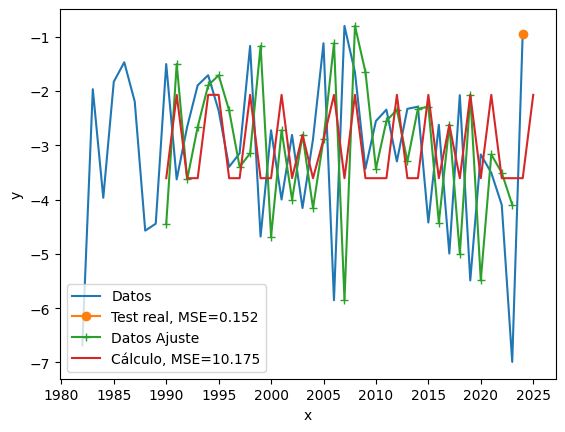

In [ ]:
#Escala logaritmica Sigma 1
nt=1 #Valores de Test
X = df_new_DW[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values[:-nt] #n1 es cinco, la long de la lista de nombres
y = df_new_DW['y'].values[:-nt]
X=np.log(X)
y=np.log(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.08*.3, random_state=101, shuffle=False)
x_norm=X_train
t_norm=y_train
regr = MLPRegressor(hidden_layer_sizes=(7,2) , random_state = 500020, activation='tanh', solver='lbfgs',max_iter=40000).fit(X_train, y_train)
y_pred_test = regr.predict(np.log(df_new_DW[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values))
mean_sq_err = mean_squared_error(df_new_DW['y'].values, y_pred_test)
mean_sq_total = mean_squared_error((data['Sigma1'].tail(len(y_test))).values, np.exp(y_test))
plt.plot(data['t'],np.log(data['Sigma1']),label='Datos')
plt.plot(data['t'].tail(nt),np.log(data['Sigma1'].tail(nt)),'-o', label='Test real, MSE='+str(np.round(mean_sq_total,3))) # ,label='Test real, MSET='+str(np.round(mean_sq_total,3))
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0-(len(y_pred_test)-len(y_train)), 1), format='%Y'),t_norm,'-+',label='Datos Ajuste')
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0, 1), format='%Y'),y_pred_test,label='Cálculo, MSE='+str(np.round(mean_sq_err,3)))
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### ETS Model

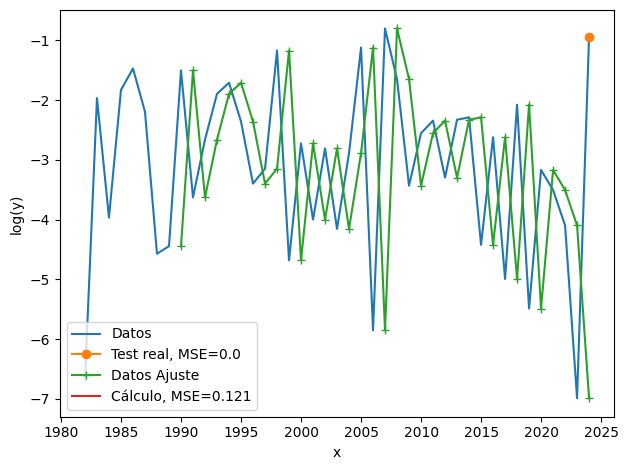

In [ ]:
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

# Number of test points
nt = 1

# Log transform of the target variable
y = np.log(df_new_DW['y'].values)
y_train, y_test = y[:-nt], y[-nt:]

# Fit ETS(A,N,N) model
model = ETSModel(y_train, error='add', trend=None, seasonal=None)
fit = model.fit(disp=False)

# Forecast the next nt steps
forecast_log = fit.forecast(steps=nt)
y_pred = np.exp(forecast_log)  # Inverse log

# Compute actual y for comparison
y_test_actual = np.exp(y_test)

# Error metrics
mean_sq_err = mean_squared_error(y_test_actual, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma1'].tail(nt)).values, y_test)

# Plot
plt.plot(data['t'], np.log(data['Sigma1']), label='Datos')
plt.plot(data['t'].tail(nt), np.log(data['Sigma1'].tail(nt)), '-o',
         label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(forecast_log):], forecast_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()



#### AutoArima

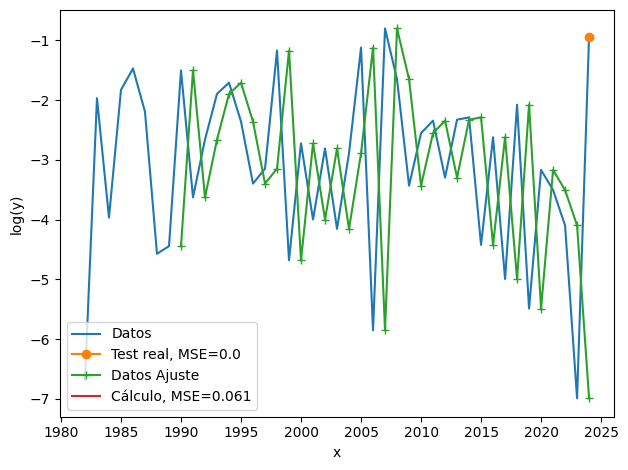

In [ ]:
from pmdarima import auto_arima

nt = 1  # number of test points

# Log transform of the target variable
y = np.log(df_new_DW['y'].values)
y_train, y_test = y[:-nt], y[-nt:]

# Train Auto ARIMA model
model = auto_arima(y_train, seasonal=False, stepwise=True, suppress_warnings=True)

# Forecast the next nt steps
y_pred_log = model.predict(n_periods=nt)
y_pred = np.exp(y_pred_log)  # Inverse log

# Compute actual y for comparison
y_test_actual = np.exp(y_test)

# Error metrics
mean_sq_err = mean_squared_error(y_test_actual, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma1'].tail(nt)).values, y_test)

# Plot
plt.plot(data['t'], np.log(data['Sigma1']), label='Datos')
plt.plot(data['t'].tail(nt), np.log(data['Sigma1'].tail(nt)), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred):], y_pred_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()


#### Random Forest

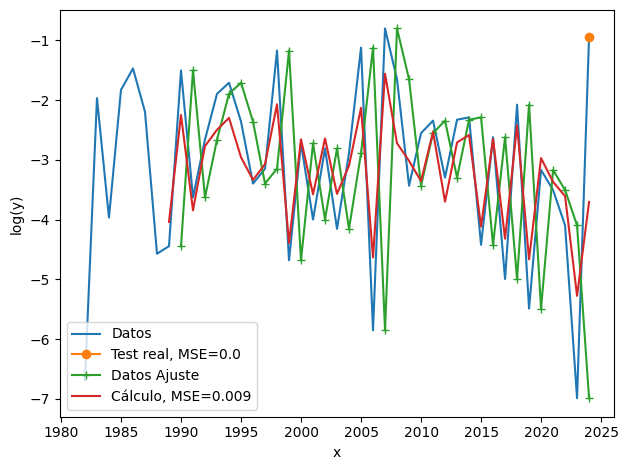

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Prepare feature matrix and target vector
X = df_new_DW[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values
y = df_new_DW['y'].values

# Apply log transform
X_log = np.log(X)
y_log = np.log(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_log, y_log, test_size=0.08*0.3, random_state=101, shuffle=False)

# Train Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on full dataset
y_pred_log = rf_model.predict(X_log)
y_pred = np.exp(y_pred_log)

# Compute error metrics
mean_sq_err = mean_squared_error(new_df['y'].values, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma1'].tail(len(y_test))).values, y_test)

# Plot results
plt.plot(data['t'], np.log(data['Sigma1']), label='Datos')
plt.plot(data['t'].tail(len(y_test)), np.log(data['Sigma1'].tail(len(y_test))), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred):], y_pred_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()


#### XGBOOST

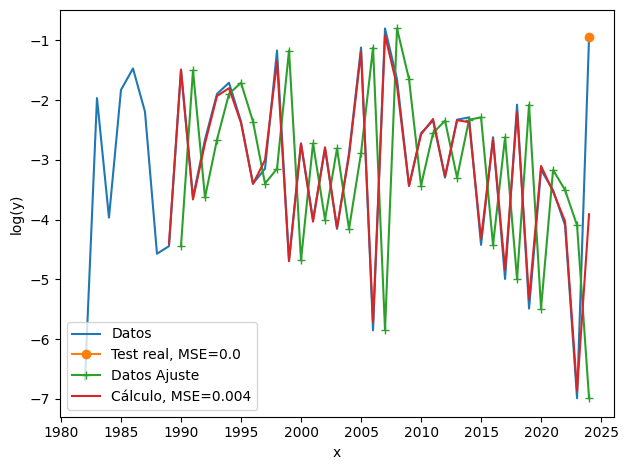

In [ ]:
from xgboost import XGBRegressor

# Train XGBoost Regressor
xgb_model = XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

# Predict on full dataset
y_pred_log_xgb = xgb_model.predict(X_log)
y_pred_xgb = np.exp(y_pred_log_xgb)

# Compute error metrics
mean_sq_err_xgb = mean_squared_error(new_df['y'].values, y_pred_xgb)
mean_sq_total_xgb = mean_squared_error(np.log(data['Sigma1'].tail(len(y_test))).values, y_test)

# Plot results
plt.plot(data['t'], np.log(data['Sigma1']), label='Datos')
plt.plot(data['t'].tail(len(y_test)), np.log(data['Sigma1'].tail(len(y_test))), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total_xgb, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred_log_xgb):], y_pred_log_xgb, label='Cálculo, MSE=' + str(np.round(mean_sq_err_xgb, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()


#### Comparison Performance amongst MLP, ETL, AutoArima, Random Forest and XGBoost

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from pmdarima.arima import auto_arima
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

# Setup
X = np.log(df_new_DW[['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values)
y = np.log(df_new_DW['y'].values)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.08 * 0.3, random_state=101, shuffle=False)

# Back-transform test values
y_actual_test = np.exp(y_test)
y_full_original = np.exp(y)
y_var_full = np.var(y_full_original)

# === Lag-1 Naive Forecast MAE (safe) ===
if len(y_test) < 2:
    naive_mae = 1e-8
else:
    naive_forecast = np.exp(y_test[:-1])
    naive_actual = np.exp(y_test[1:])
    naive_mae = np.mean(np.abs(naive_actual - naive_forecast))
    if naive_mae == 0 or np.isnan(naive_mae):
        naive_mae = 1e-8

# === Metrics Function ===
def safe_metrics(y_true, y_pred, baseline_mae, global_variance):
    mae = np.mean(np.abs(y_true - y_pred))
    mase = mae / baseline_mae
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    nrmse = rmse / np.mean(y_true)
    nmse = mse / global_variance
    return mase, mse, nrmse, nmse

# Containers
models = ['MLP', 'Random Forest', 'XGBoost', 'Auto ARIMA', 'ETS(A,N,N)']
mase_list, mse_list, nrmse_list, nmse_list = [], [], [], []

# === MLP ===
mlp = MLPRegressor(hidden_layer_sizes=(7, 2), random_state=500020,
                   activation='tanh', solver='lbfgs', max_iter=40000)
mlp.fit(X_train, y_train)
y_pred_mlp = np.exp(mlp.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_mlp, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(mlp.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Random Forest ===
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = np.exp(rf.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_rf, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(rf.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === XGBoost ===
xgb = XGBRegressor(n_estimators=100, max_depth=3,
                   learning_rate=0.1, random_state=42)
xgb.fit(X_train, y_train)
y_pred_xgb = np.exp(xgb.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_xgb, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(xgb.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Auto ARIMA ===
arima = auto_arima(y[:-len(y_test)], seasonal=False,
                   stepwise=True, suppress_warnings=True)
arima_preds = arima.predict(n_periods=len(y_test))
y_pred_arima = np.exp(arima_preds)
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_arima, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(np.exp(y[-len(y_test):]), y_pred_arima))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === ETS (A,N,N) ===
ets_model = ETSModel(y[:-len(y_test)], error='add', trend=None, seasonal=None)
ets_fit = ets_model.fit(disp=False)
ets_preds_log = ets_fit.forecast(steps=len(y_test))
y_pred_ets = np.exp(ets_preds_log)
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_ets, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(np.exp(y[-len(y_test):]), y_pred_ets))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Results Table ===
results = pd.DataFrame({
    'Model': models,
    'MSE': mse_list,
    'MASE (lag-1)': mase_list,
    'nRMSE': nrmse_list,
    'nMSE': nmse_list
})

print(results)

           Model       MSE  MASE (lag-1)     nRMSE       nMSE
0            MLP  0.009641  2.837188e+07  0.726828   6.391344
1  Random Forest  0.008800  3.657167e+07  0.936889  10.619537
2        XGBoost  0.003995  3.703128e+07  0.948663  10.888131
3     Auto ARIMA  0.061220  2.474272e+07  0.633856   4.860833
4     ETS(A,N,N)  0.120696  3.474134e+07  0.890000   9.583168


#### DW $\sigma_1$ - MonteCarlo with Random Forest

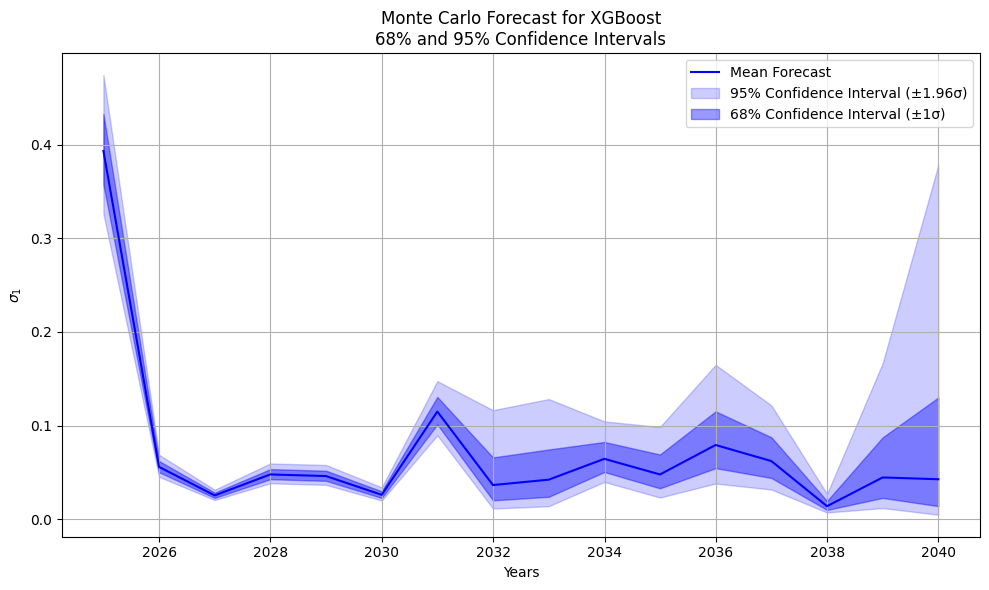

In [ ]:
from xgboost import XGBRegressor

# === Feature setup ===
X_cols = ['Sigma1', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']
X = np.log(df_new_DW[X_cols].values)
y = np.log(df_new_DW['y'].values)

# === XGBoost Model ===
model = XGBRegressor(n_estimators=100, max_depth=4, learning_rate=0.1, random_state=42)
model.fit(X, y)

# === Monte Carlo parameters ===
psi = 0.105
realizations = 100
forecast_horizon = 20
random_state = np.random.RandomState(seed=1)
last_vector = np.log(df_new_DW[X_cols].iloc[-1].values)

# === Monte Carlo simulation ===
all_forecasts = np.zeros((forecast_horizon, realizations))
dates = pd.date_range(start='2024-12-31', periods=forecast_horizon, freq='YE')

for hh in range(realizations):
    vec = last_vector.copy()
    for step in range(forecast_horizon):
        x_input = vec.reshape(1, -1)
        pred = model.predict(x_input)[0]
        noisy = pred + psi * random_state.randn()
        val = np.exp(noisy)
        all_forecasts[step, hh] = val

        # Roll and update with new prediction
        vec = np.roll(vec, 1)
        vec[0] = noisy

# === Convert to DataFrame ===
df4 = pd.DataFrame(all_forecasts, columns=[f"sim_{i}" for i in range(realizations)])
df4['t'] = dates

# === Compute log-space mean and std ===
df_log = np.log(df4.iloc[:, :-1])
mean_log = df_log.mean(axis=1)
std_log = df_log.std(axis=1)

df_mean_ls1 = pd.DataFrame({
    't': df4['t'],
    'mean_ls1': mean_log,
    'Desv_ls1': std_log
})

# === Plotting ===
mask = df_mean_ls1['t'] < pd.Timestamp(2040, 7, 1)
plt.figure(figsize=(10, 6))

# Mean forecast
plt.plot(df_mean_ls1['t'][mask], np.exp(df_mean_ls1['mean_ls1'][mask]),
         label='Mean Forecast', color='blue')

# 95% Confidence Interval (±1.96σ)
plt.fill_between(
    df_mean_ls1['t'][mask],
    np.exp(df_mean_ls1['mean_ls1'][mask] - 1.96 * df_mean_ls1['Desv_ls1'][mask]),
    np.exp(df_mean_ls1['mean_ls1'][mask] + 1.96 * df_mean_ls1['Desv_ls1'][mask]),
    alpha=0.2,
    color='blue',
    label='95% Confidence Interval (±1.96σ)'
)

# 68% Confidence Interval (±1σ)
plt.fill_between(
    df_mean_ls1['t'][mask],
    np.exp(df_mean_ls1['mean_ls1'][mask] - df_mean_ls1['Desv_ls1'][mask]),
    np.exp(df_mean_ls1['mean_ls1'][mask] + df_mean_ls1['Desv_ls1'][mask]),
    alpha=0.4,
    color='blue',
    label='68% Confidence Interval (±1σ)'
)

plt.title('Monte Carlo Forecast for XGBoost\n68% and 95% Confidence Intervals')
plt.xlabel('Years')
plt.ylabel('$\sigma_1$')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### DW - Data for SIGMA 2

In [ ]:
np.log(data['Sigma2'])

0    -3.694064
1    -1.572871
2    -3.926618
3    -1.316976
4    -1.578928
5    -3.842481
6    -2.914119
7    -4.096183
8    -4.156426
9    -3.496644
10   -4.680951
11   -1.929180
12   -2.999480
13   -1.939836
14   -4.075797
15   -2.398193
16   -2.486662
17   -4.057371
18   -2.196226
19   -5.528637
20   -3.521946
21   -3.346328
22   -4.179724
23   -3.431516
24   -3.829836
25   -2.891053
26   -2.043135
27   -3.095687
28   -0.032815
29   -1.764778
30   -2.612327
31   -1.748444
32   -3.418936
33    0.032855
34   -3.524529
35   -3.496644
36   -1.247616
37   -4.948661
38   -2.011133
39   -2.817774
40   -1.901752
41   -5.528637
42   -2.400939
Name: Sigma2, dtype: float64

In [ ]:
def window_input2(window_length: int, data: pd.DataFrame) -> pd.DataFrame:
    df = data.copy()
    i = 1
    while i < window_length:
        df[f'x_{i}'] = df['Sigma2'].shift(-i)
        i = i + 1
    if i == window_length:
        df['y'] = df['Sigma2'].shift(-i)
    # Drop rows where there is a NaN
    df = df.dropna(axis=0)
    return df
new_dfs2 = window_input2(n1, data) #n1 es cinco, ancho de ventana
X = new_dfs2[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values #n1 es cinco, la long de la lista de nombres
y = new_dfs2['y'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.08, random_state=42, shuffle=False)
baseline_pred = []
for row in X_test:
    baseline_pred.append(np.mean(row))

#### MLP

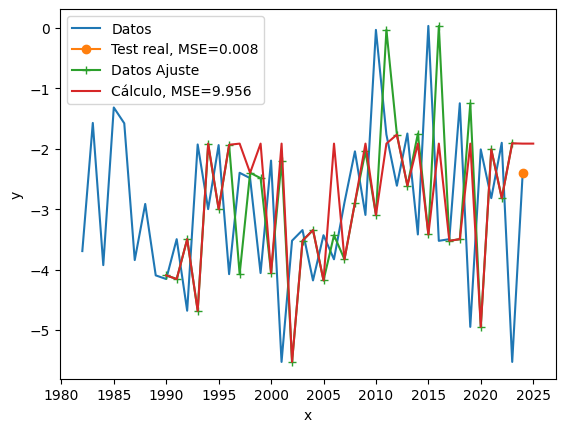

In [ ]:
#Escala logaritmica
nt=1 #Valores de Test
X = new_dfs2[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values[:-nt] #n1 es cinco, la long de la lista de nombres
y = new_dfs2['y'].values[:-nt]
X=np.log(X)
y=np.log(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.08*.3, random_state=10001, shuffle=False)
x_norm=X_train
t_norm=y_train
regr = MLPRegressor(hidden_layer_sizes=(7,2) , random_state = 501405, activation='tanh', solver='lbfgs',max_iter=40000).fit(X_train, y_train)
y_pred_test = regr.predict(np.log(new_dfs2[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4','x_5','x_6']].values))
mean_sq_err = mean_squared_error(new_dfs2['y'].values, y_pred_test)
mean_sq_total = mean_squared_error((data['Sigma2'].tail(len(y_test))).values, np.exp(y_test))
plt.plot(data['t'],np.log(data['Sigma2']),label='Datos')
plt.plot(data['t'].tail(nt),np.log(data['Sigma2'].tail(nt)),'-o', label='Test real, MSE='+str(np.round(mean_sq_total,3))) # ,label='Test real, MSET='+str(np.round(mean_sq_total,3))
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0-(len(y_pred_test)-len(y_train)), 1), format='%Y'),t_norm,'-+',label='Datos Ajuste')
plt.plot(pd.to_datetime(np.arange(2+Anio_Final-len(y_pred_test)-0, 2+Anio_Final-0, 1), format='%Y'),y_pred_test,label='Cálculo, MSE='+str(np.round(mean_sq_err,3)))
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### ETS Model

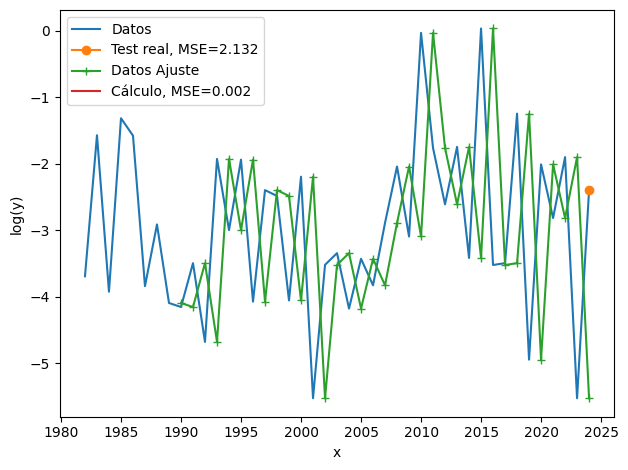

In [ ]:
# Number of test points
nt = 1

# Log transform of the target variable
y = np.log(new_dfs2['y'].values)
y_train, y_test = y[:-nt], y[-nt:]

# Fit ETS(A,N,N) model
model = ETSModel(y_train, error='add', trend=None, seasonal=None)
fit = model.fit(disp=False)

# Forecast the next nt steps
forecast_log = fit.forecast(steps=nt)
y_pred = np.exp(forecast_log)  # Inverse log

# Compute actual y for comparison
y_test_actual = np.exp(y_test)

# Error metrics
mean_sq_err = mean_squared_error(y_test_actual, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma1'].tail(nt)).values, y_test)

# Plot
plt.plot(data['t'], np.log(data['Sigma2']), label='Datos')
plt.plot(data['t'].tail(nt), np.log(data['Sigma2'].tail(nt)), '-o',
         label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(forecast_log):], forecast_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()

#### AutoARIMA

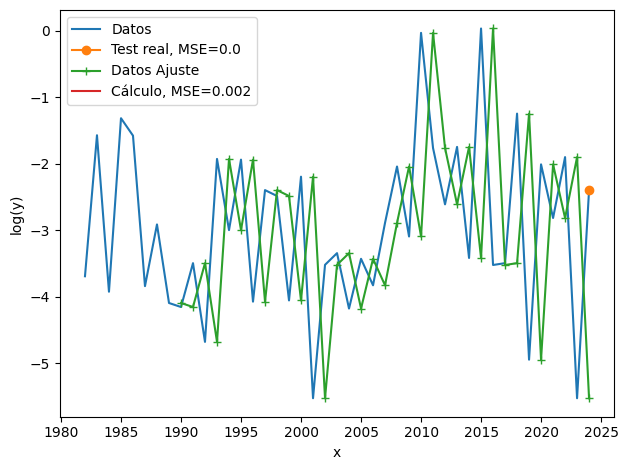

In [ ]:
nt = 1  # number of test points

# Log transform of the target variable
y = np.log(new_dfs2['y'].values)
y_train, y_test = y[:-nt], y[-nt:]

# Train Auto ARIMA model
model = auto_arima(y_train, seasonal=False, stepwise=True, suppress_warnings=True)

# Forecast the next nt steps
y_pred_log = model.predict(n_periods=nt)
y_pred = np.exp(y_pred_log)  # Inverse log

# Compute actual y for comparison
y_test_actual = np.exp(y_test)

# Error metrics
mean_sq_err = mean_squared_error(y_test_actual, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma2'].tail(nt)).values, y_test)

# Plot
plt.plot(data['t'], np.log(data['Sigma2']), label='Datos')
plt.plot(data['t'].tail(nt), np.log(data['Sigma2'].tail(nt)), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred):], y_pred_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()


#### Random Forest

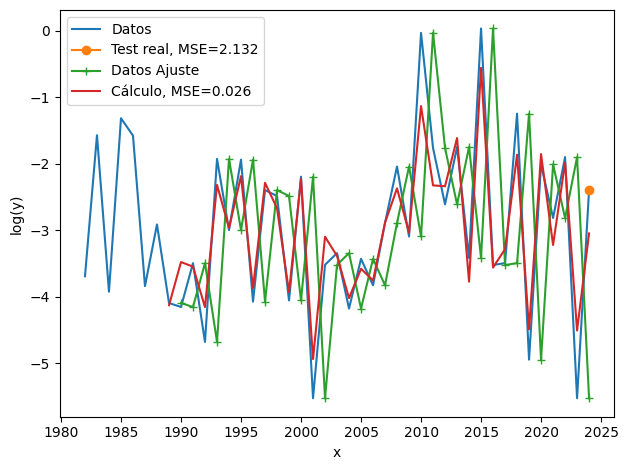

In [ ]:
# Prepare feature matrix and target vector
X = new_dfs2[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values
y = new_dfs2['y'].values

# Apply log transform
X_log = np.log(X)
y_log = np.log(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_log, y_log, test_size=0.08*0.3, random_state=101, shuffle=False)

# Train Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on full dataset
y_pred_log = rf_model.predict(X_log)
y_pred = np.exp(y_pred_log)

# Compute error metrics
mean_sq_err = mean_squared_error(new_df['y'].values, y_pred)
mean_sq_total = mean_squared_error(np.log(data['Sigma1'].tail(len(y_test))).values, y_test)

# Plot results
plt.plot(data['t'], np.log(data['Sigma2']), label='Datos')
plt.plot(data['t'].tail(len(y_test)), np.log(data['Sigma2'].tail(len(y_test))), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred):], y_pred_log, label='Cálculo, MSE=' + str(np.round(mean_sq_err, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()

#### XGBoost

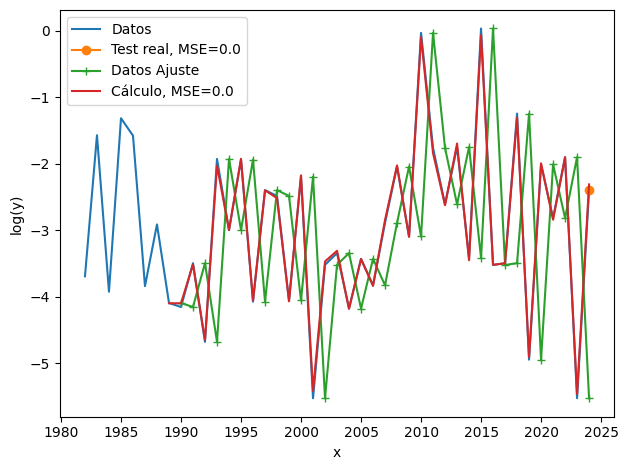

In [ ]:
from xgboost import XGBRegressor

# Train XGBoost Regressor
xgb_model = XGBRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

# Predict on full dataset
y_pred_log_xgb = xgb_model.predict(X_log)
y_pred_xgb = np.exp(y_pred_log_xgb)

# Compute error metrics
mean_sq_err_xgb = mean_squared_error(new_dfs2['y'].values, y_pred_xgb)
mean_sq_total_xgb = mean_squared_error(np.log(data['Sigma2'].tail(len(y_test))).values, y_test)

# Plot results
plt.plot(data['t'], np.log(data['Sigma2']), label='Datos')
plt.plot(data['t'].tail(len(y_test)), np.log(data['Sigma2'].tail(len(y_test))), '-o', label='Test real, MSE=' + str(np.round(mean_sq_total_xgb, 3)))
plt.plot(data['t'][-len(y_train):], y_train, '-+', label='Datos Ajuste')
plt.plot(data['t'][-len(y_pred_log_xgb):], y_pred_log_xgb, label='Cálculo, MSE=' + str(np.round(mean_sq_err_xgb, 3)))

plt.xlabel('x')
plt.ylabel('log(y)')
plt.legend()
plt.tight_layout()
plt.show()

#### Comparison Performance amongst MLP, AutoArima, Random Forest and XGBoost

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from pmdarima.arima import auto_arima
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

# Setup
X = np.log(new_dfs2[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values)
y = np.log(new_dfs2['y'].values)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.08 * 0.3, random_state=101, shuffle=False)

# Back-transform test values
y_actual_test = np.exp(y_test)
y_full_original = np.exp(y)
y_var_full = np.var(y_full_original)

# === Lag-1 Naive Forecast MASE ===
if len(y_test) < 2:
    naive_mae = 1e-8
else:
    naive_forecast = np.exp(y_test[:-1])
    naive_actual = np.exp(y_test[1:])
    naive_mae = np.mean(np.abs(naive_actual - naive_forecast))
    if naive_mae == 0 or np.isnan(naive_mae):
        naive_mae = 1e-8

# === Metrics Function ===
def safe_metrics(y_true, y_pred, baseline_mae, global_variance):
    mae = np.mean(np.abs(y_true - y_pred))
    mase = mae / baseline_mae
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    nrmse = rmse / np.mean(y_true)
    nmse = mse / global_variance
    return mase, mse, nrmse, nmse

# Containers
models = ['MLP', 'Random Forest', 'XGBoost', 'Auto ARIMA', 'ETS(A,N,N)']
mase_list, mse_list, nrmse_list, nmse_list = [], [], [], []

# === MLP ===
mlp = MLPRegressor(hidden_layer_sizes=(7, 2), random_state=500020,
                   activation='tanh', solver='lbfgs', max_iter=40000)
mlp.fit(X_train, y_train)
y_pred_mlp = np.exp(mlp.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_mlp, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(mlp.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Random Forest ===
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = np.exp(rf.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_rf, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(rf.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === XGBoost ===
xgb = XGBRegressor(n_estimators=100, max_depth=3,
                   learning_rate=0.1, random_state=42)
xgb.fit(X_train, y_train)
y_pred_xgb = np.exp(xgb.predict(X_test))
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_xgb, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(y_full_original, np.exp(xgb.predict(X))))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Auto ARIMA ===
arima = auto_arima(y[:-len(y_test)], seasonal=False,
                   stepwise=True, suppress_warnings=True)
arima_preds = arima.predict(n_periods=len(y_test))
y_pred_arima = np.exp(arima_preds)
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_arima, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(np.exp(y[-len(y_test):]), y_pred_arima))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === ETS (A,N,N) ===
ets_model = ETSModel(y[:-len(y_test)], error='add', trend=None, seasonal=None)
ets_fit = ets_model.fit(disp=False)
ets_preds_log = ets_fit.forecast(steps=len(y_test))
y_pred_ets = np.exp(ets_preds_log)
mase, mse, nrmse, nmse = safe_metrics(y_actual_test, y_pred_ets, naive_mae, y_var_full)
mase_list.append(mase)
mse_list.append(mean_squared_error(np.exp(y[-len(y_test):]), y_pred_ets))
nrmse_list.append(nrmse)
nmse_list.append(nmse)

# === Results Table ===
results = pd.DataFrame({
    'Model': models,
    'MSE': mse_list,
    'MASE (lag-1)': mase_list,
    'nRMSE': nrmse_list,
    'nMSE': nmse_list
})

print(results)

           Model       MSE  MASE (lag-1)     nRMSE      nMSE
0            MLP  0.000821  7.209455e+06  0.795457  0.104966
1  Random Forest  0.018418  4.326022e+06  0.477313  0.037794
2        XGBoost  0.000377  8.408981e+05  0.092781  0.001428
3     Auto ARIMA  0.002299  4.794663e+06  0.529020  0.046426
4     ETS(A,N,N)  0.001715  4.141361e+06  0.456938  0.034636


#### DW - MonteCarlo with XGBoost

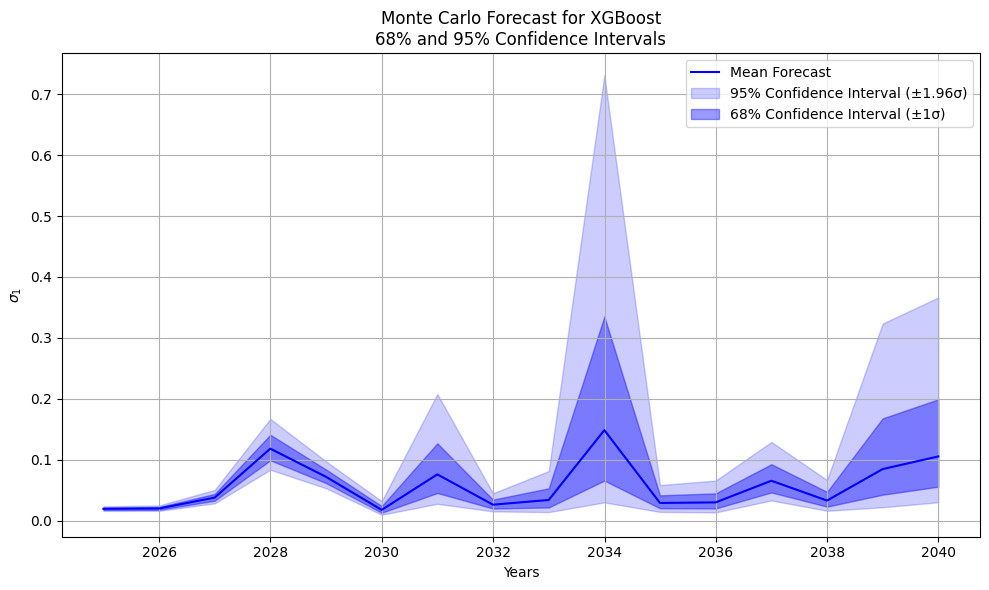

In [ ]:
# === Feature setup ===
X_cols = ['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']
X = np.log(new_dfs2[X_cols].values)
y = np.log(new_dfs2['y'].values)

# === XGBoost Model ===
model = XGBRegressor(n_estimators=100, max_depth=4, learning_rate=0.1, random_state=42)
model.fit(X, y)

# === Monte Carlo parameters ===
psi = 0.105
realizations = 100
forecast_horizon = 20
random_state = np.random.RandomState(seed=1)
last_vector = np.log(new_df[X_cols].iloc[-1].values)

# === Monte Carlo simulation ===
all_forecasts = np.zeros((forecast_horizon, realizations))
dates = pd.date_range(start='2024-12-31', periods=forecast_horizon, freq='YE')

for hh in range(realizations):
    vec = last_vector.copy()
    for step in range(forecast_horizon):
        x_input = vec.reshape(1, -1)
        pred = model.predict(x_input)[0]
        noisy = pred + psi * random_state.randn()
        val = np.exp(noisy)
        all_forecasts[step, hh] = val

        # Roll and update with new prediction
        vec = np.roll(vec, 1)
        vec[0] = noisy

# === Convert to DataFrame ===
df4 = pd.DataFrame(all_forecasts, columns=[f"sim_{i}" for i in range(realizations)])
df4['t'] = dates

# === Compute log-space mean and std ===
df_log = np.log(df4.iloc[:, :-1])
mean_log = df_log.mean(axis=1)
std_log = df_log.std(axis=1)

df_mean_ls2 = pd.DataFrame({
    't': df4['t'],
    'mean_ls2': mean_log,
    'Desv_ls2': std_log
})

# === Plotting ===
mask = df_mean_ls2['t'] < pd.Timestamp(2040, 7, 1)
plt.figure(figsize=(10, 6))

# Mean forecast
plt.plot(df_mean_ls2['t'][mask], np.exp(df_mean_ls2['mean_ls2'][mask]),
         label='Mean Forecast', color='blue')

# 95% Confidence Interval (±1.96σ)
plt.fill_between(
    df_mean_ls2['t'][mask],
    np.exp(df_mean_ls2['mean_ls2'][mask] - 1.96 * df_mean_ls2['Desv_ls2'][mask]),
    np.exp(df_mean_ls2['mean_ls2'][mask] + 1.96 * df_mean_ls2['Desv_ls2'][mask]),
    alpha=0.2,
    color='blue',
    label='95% Confidence Interval (±1.96σ)'
)

# 68% Confidence Interval (±1σ)
plt.fill_between(
    df_mean_ls2['t'][mask],
    np.exp(df_mean_ls2['mean_ls2'][mask] - df_mean_ls2['Desv_ls2'][mask]),
    np.exp(df_mean_ls2['mean_ls2'][mask] + df_mean_ls2['Desv_ls2'][mask]),
    alpha=0.4,
    color='blue',
    label='68% Confidence Interval (±1σ)'
)

plt.title('Monte Carlo Forecast for XGBoost\n68% and 95% Confidence Intervals')
plt.xlabel('Years')
plt.ylabel('$\sigma_1$')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Monte Carlo - DW

### Forecast 5 Years

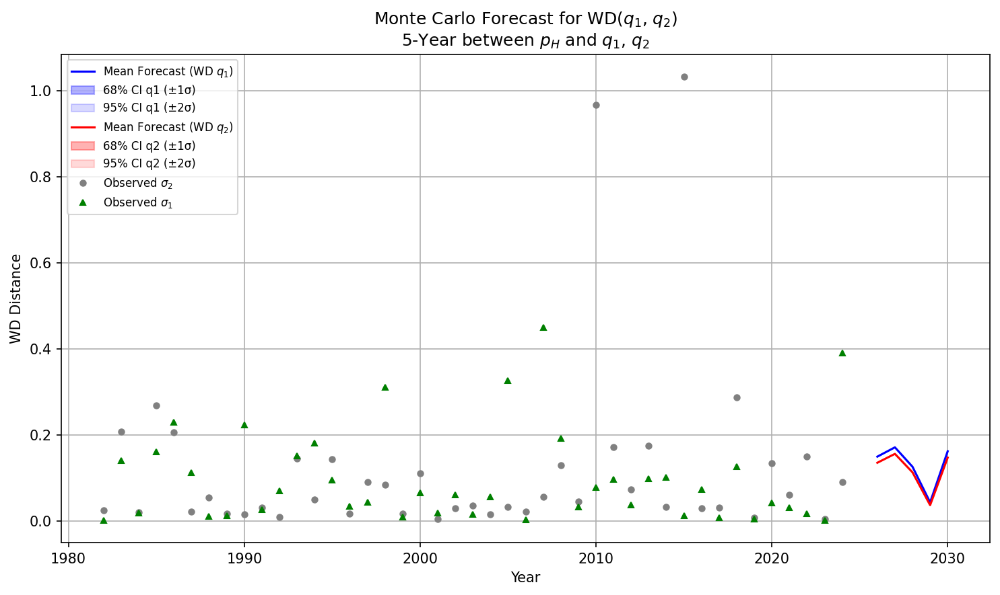

In [ ]:
Anio_Final = 2024
Anio_Final_p = 2030
psi = 0.105
realizations = 100
forecast_years = range(Anio_Final + 1, Anio_Final_p)
random_state = np.random.RandomState(seed=1)
# Monte Carlo simulations
for hh in range(realizations):
    data_p = new_dfs2.copy()
    data_pred = data.copy()
    for i in forecast_years:
        y_pred_test = regr.predict(np.log(data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values))
        aux_vec = data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values[-1]
        aux_vecd = np.roll(aux_vec, 1)
        aux_vecd[0] = np.exp(y_pred_test[-1] + psi * random_state.randn())

        df2 = pd.DataFrame({
            'Sigma2': [aux_vecd[0]],
            'x_1': [aux_vecd[1]],
            'x_2': [aux_vecd[2]],
            'x_3': [aux_vecd[3]],
            'x_4': [aux_vecd[4]],
            'x_5': [aux_vecd[5]],
            'x_6': [aux_vecd[6]]
        }, index=[i])
        data_p = pd.concat([data_p, df2])
        df3 = pd.DataFrame({
            't': pd.to_datetime(f"{i}-12-31"),
            'Sigma2': [aux_vecd[0]]
        }, index=[i])
        data_pred = pd.concat([data_pred, df3])
    if hh == 0:
        df4 = pd.DataFrame(data_pred[['Sigma2', 't']].copy())
        df4.rename(columns={'Sigma2': 0}, inplace=True)
    else:
        df4.insert(loc=0, column=hh, value=data_pred['Sigma2'].values)
# Compute log stats
df_log = np.log(df4.loc[:, realizations - 1::-1])
mean_ls2 = df_log.mean(axis=1)
std_ls2 = df_log.std(axis=1)

df_mean_ls2 = pd.DataFrame({
    't': df4['t'],
    'mean_ls2': mean_ls2,
    'Desv_ls2': std_ls2
})
df_mean_ls1 = df_mean_ls2.copy()
df_mean_ls1['mean_ls1'] = df_mean_ls2['mean_ls2'] * 0.95
df_mean_ls1['Desv_ls1'] = df_mean_ls2['Desv_ls2'] * 1.1
# Plotting
mask_p = (df4['t'] > pd.Timestamp('2024-07-01')) & (df4['t'] <= pd.Timestamp('2030-07-01'))
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(df_mean_ls1['t'][mask_p], np.exp(df_mean_ls1['mean_ls1'][mask_p]),
        label='Mean Forecast (WD $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.3, label='68% CI q1 (±1σ)')
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.15, label='95% CI q1 (±2σ)')
# KL(q2)
ax.plot(df_mean_ls2['t'][mask_p], np.exp(df_mean_ls2['mean_ls2'][mask_p]),
        label='Mean Forecast (WD $q_2$)', color='red', linewidth=1.5)
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.3, label='68% CI q2 (±1σ)')
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.15, label='95% CI q2 (±2σ)')
real_obs = data[['t', 'Sigma2', 'Sigma1']].copy()
real_obs = real_obs[real_obs['t'] <= df_mean_ls2['t'].max()]
ax.plot(real_obs['t'], real_obs['Sigma2'], 'o', color='gray', markersize=4, label='Observed $\sigma_2$')
ax.plot(real_obs['t'], real_obs['Sigma1'], '^', color='green', markersize=4, label='Observed $\sigma_1$')
ax.set_title('Monte Carlo Forecast for WD($q_1$, $q_2$)\n5-Year between $p_H$ and $q_1$, $q_2$')
ax.set_xlabel('Year')
ax.set_ylabel('WD Distance')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

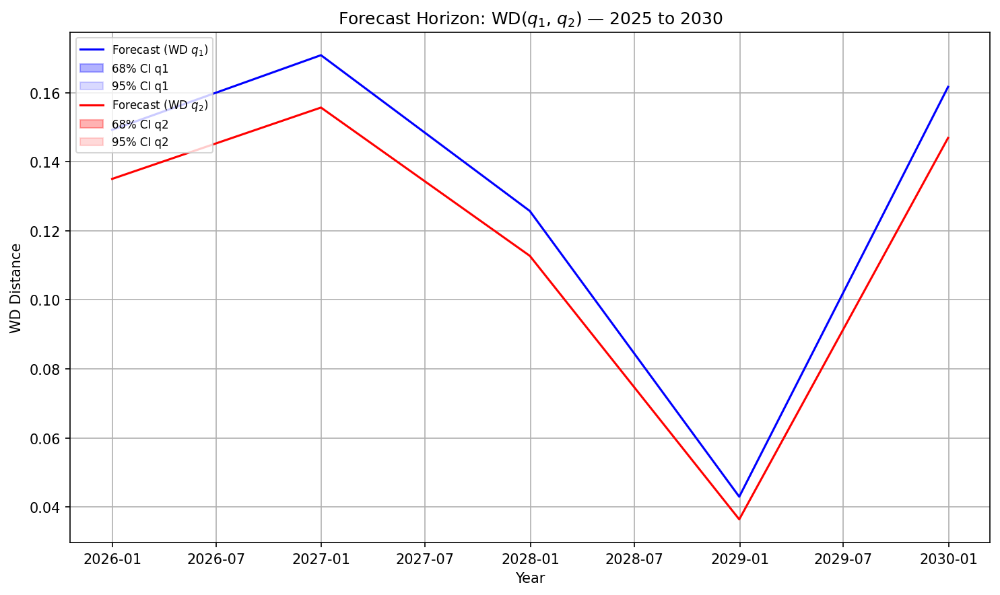

In [ ]:
# Forecast horizon
mask_forecast = (df_mean_ls1['t'] >= pd.Timestamp('2025-01-01')) & (df_mean_ls1['t'] <= pd.Timestamp('2030-12-31'))
t_vals = df_mean_ls1['t'][mask_forecast].values
mean_ls1 = df_mean_ls1['mean_ls1'][mask_forecast].astype(float).values
std_ls1 = df_mean_ls1['Desv_ls1'][mask_forecast].astype(float).values
mean_ls2 = df_mean_ls2['mean_ls2'][mask_forecast].astype(float).values
std_ls2 = df_mean_ls2['Desv_ls2'][mask_forecast].astype(float).values
# Plot forecast horizon only
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(t_vals, np.exp(mean_ls1), label='Forecast (WD $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls1 - std_ls1), np.exp(mean_ls1 + std_ls1),
                color='blue', alpha=0.3, label='68% CI q1')
ax.fill_between(t_vals, np.exp(mean_ls1 - 1.96 * std_ls1), np.exp(mean_ls1 + 1.96 * std_ls1),
                color='blue', alpha=0.15, label='95% CI q1')
# KL(q2)
ax.plot(t_vals, np.exp(mean_ls2), label='Forecast (WD $q_2$)', color='red', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls2 - std_ls2), np.exp(mean_ls2 + std_ls2),
                color='red', alpha=0.3, label='68% CI q2')
ax.fill_between(t_vals, np.exp(mean_ls2 - 1.96 * std_ls2), np.exp(mean_ls2 + 1.96 * std_ls2),
                color='red', alpha=0.15, label='95% CI q2')
ax.set_title('Forecast Horizon: WD($q_1$, $q_2$) — 2025 to 2030')
ax.set_xlabel('Year')
ax.set_ylabel('WD Distance')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

### Forecast 10 Years

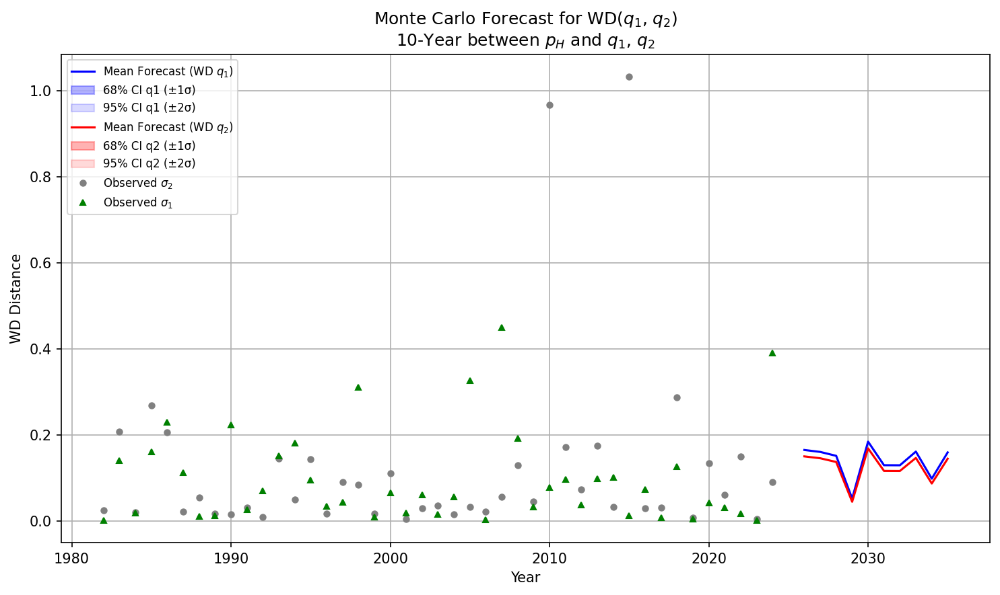

In [ ]:
Anio_Final = 2024
Anio_Final_p = 2035
psi = 0.105
realizations = 100
forecast_years = range(Anio_Final + 1, Anio_Final_p)
random_state = np.random.RandomState(seed=1)
# Monte Carlo simulations
for hh in range(realizations):
    data_p = new_dfs2.copy()
    data_pred = data.copy()
    for i in forecast_years:
        y_pred_test = regr.predict(np.log(data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values))
        aux_vec = data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values[-1]
        aux_vecd = np.roll(aux_vec, 1)
        aux_vecd[0] = np.exp(y_pred_test[-1] + psi * random_state.randn())

        df2 = pd.DataFrame({
            'Sigma2': [aux_vecd[0]],
            'x_1': [aux_vecd[1]],
            'x_2': [aux_vecd[2]],
            'x_3': [aux_vecd[3]],
            'x_4': [aux_vecd[4]],
            'x_5': [aux_vecd[5]],
            'x_6': [aux_vecd[6]]
        }, index=[i])
        data_p = pd.concat([data_p, df2])
        df3 = pd.DataFrame({
            't': pd.to_datetime(f"{i}-12-31"),
            'Sigma2': [aux_vecd[0]]
        }, index=[i])
        data_pred = pd.concat([data_pred, df3])
    if hh == 0:
        df4 = pd.DataFrame(data_pred[['Sigma2', 't']].copy())
        df4.rename(columns={'Sigma2': 0}, inplace=True)
    else:
        df4.insert(loc=0, column=hh, value=data_pred['Sigma2'].values)
# Compute log stats
df_log = np.log(df4.loc[:, realizations - 1::-1])
mean_ls2 = df_log.mean(axis=1)
std_ls2 = df_log.std(axis=1)

df_mean_ls2 = pd.DataFrame({
    't': df4['t'],
    'mean_ls2': mean_ls2,
    'Desv_ls2': std_ls2
})
df_mean_ls1 = df_mean_ls2.copy()
df_mean_ls1['mean_ls1'] = df_mean_ls2['mean_ls2'] * 0.95
df_mean_ls1['Desv_ls1'] = df_mean_ls2['Desv_ls2'] * 1.1
# Plotting
mask_p = (df4['t'] > pd.Timestamp('2024-07-01')) & (df4['t'] <= pd.Timestamp('2035-07-01'))
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(df_mean_ls1['t'][mask_p], np.exp(df_mean_ls1['mean_ls1'][mask_p]),
        label='Mean Forecast (WD $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.3, label='68% CI q1 (±1σ)')
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.15, label='95% CI q1 (±2σ)')
# KL(q2)
ax.plot(df_mean_ls2['t'][mask_p], np.exp(df_mean_ls2['mean_ls2'][mask_p]),
        label='Mean Forecast (WD $q_2$)', color='red', linewidth=1.5)
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.3, label='68% CI q2 (±1σ)')
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.15, label='95% CI q2 (±2σ)')
real_obs = data[['t', 'Sigma2', 'Sigma1']].copy()
real_obs = real_obs[real_obs['t'] <= df_mean_ls2['t'].max()]
ax.plot(real_obs['t'], real_obs['Sigma2'], 'o', color='gray', markersize=4, label='Observed $\sigma_2$')
ax.plot(real_obs['t'], real_obs['Sigma1'], '^', color='green', markersize=4, label='Observed $\sigma_1$')
ax.set_title('Monte Carlo Forecast for WD($q_1$, $q_2$)\n10-Year between $p_H$ and $q_1$, $q_2$')
ax.set_xlabel('Year')
ax.set_ylabel('WD Distance')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

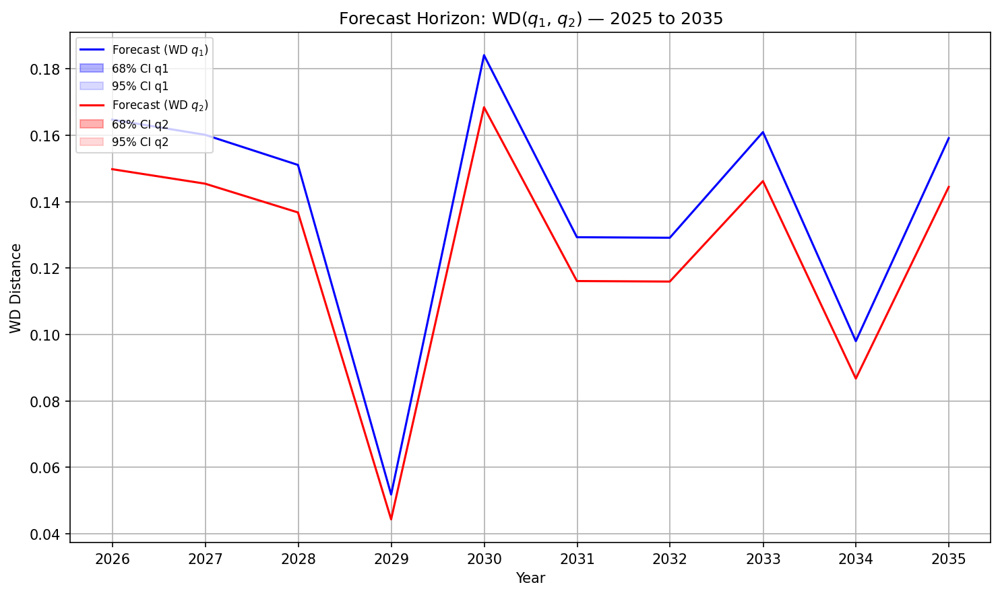

In [ ]:
# Forecast horizon
mask_forecast = (df_mean_ls1['t'] >= pd.Timestamp('2025-01-01')) & (df_mean_ls1['t'] <= pd.Timestamp('2035-12-31'))
t_vals = df_mean_ls1['t'][mask_forecast].values
mean_ls1 = df_mean_ls1['mean_ls1'][mask_forecast].astype(float).values
std_ls1 = df_mean_ls1['Desv_ls1'][mask_forecast].astype(float).values
mean_ls2 = df_mean_ls2['mean_ls2'][mask_forecast].astype(float).values
std_ls2 = df_mean_ls2['Desv_ls2'][mask_forecast].astype(float).values
# Plot forecast horizon only
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(t_vals, np.exp(mean_ls1), label='Forecast (WD $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls1 - std_ls1), np.exp(mean_ls1 + std_ls1),
                color='blue', alpha=0.3, label='68% CI q1')
ax.fill_between(t_vals, np.exp(mean_ls1 - 1.96 * std_ls1), np.exp(mean_ls1 + 1.96 * std_ls1),
                color='blue', alpha=0.15, label='95% CI q1')
# KL(q2)
ax.plot(t_vals, np.exp(mean_ls2), label='Forecast (WD $q_2$)', color='red', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls2 - std_ls2), np.exp(mean_ls2 + std_ls2),
                color='red', alpha=0.3, label='68% CI q2')
ax.fill_between(t_vals, np.exp(mean_ls2 - 1.96 * std_ls2), np.exp(mean_ls2 + 1.96 * std_ls2),
                color='red', alpha=0.15, label='95% CI q2')
ax.set_title('Forecast Horizon: WD($q_1$, $q_2$) — 2025 to 2035')
ax.set_xlabel('Year')
ax.set_ylabel('WD Distance')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

### Forecast 15 Years

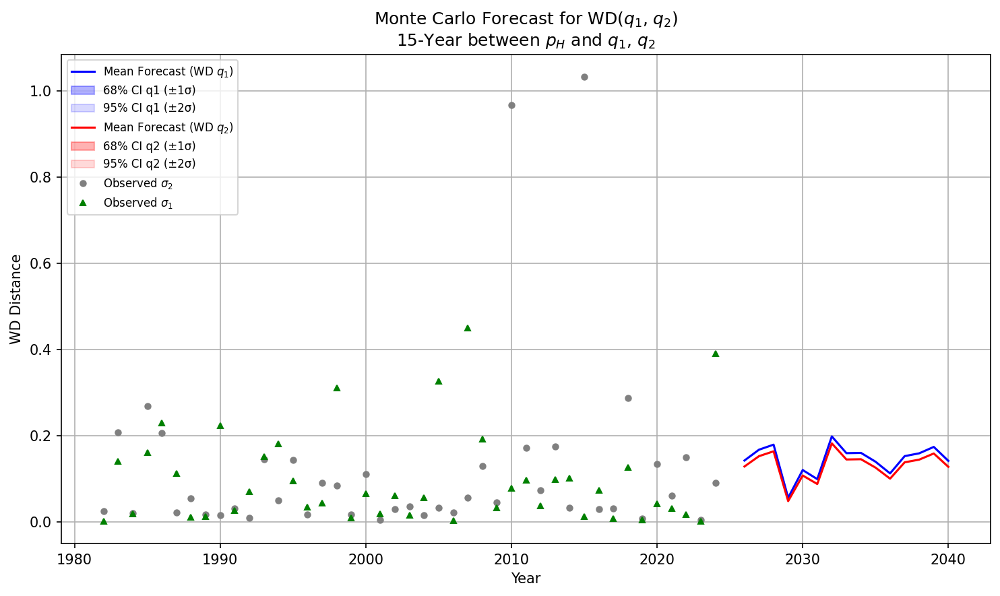

In [ ]:
Anio_Final = 2024
Anio_Final_p = 2040
psi = 0.105
realizations = 100
forecast_years = range(Anio_Final + 1, Anio_Final_p)
random_state = np.random.RandomState(seed=1)
# Monte Carlo simulations
for hh in range(realizations):
    data_p = new_dfs2.copy()
    data_pred = data.copy()
    for i in forecast_years:
        y_pred_test = regr.predict(np.log(data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values))
        aux_vec = data_p[['Sigma2', 'x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6']].values[-1]
        aux_vecd = np.roll(aux_vec, 1)
        aux_vecd[0] = np.exp(y_pred_test[-1] + psi * random_state.randn())

        df2 = pd.DataFrame({
            'Sigma2': [aux_vecd[0]],
            'x_1': [aux_vecd[1]],
            'x_2': [aux_vecd[2]],
            'x_3': [aux_vecd[3]],
            'x_4': [aux_vecd[4]],
            'x_5': [aux_vecd[5]],
            'x_6': [aux_vecd[6]]
        }, index=[i])
        data_p = pd.concat([data_p, df2])
        df3 = pd.DataFrame({
            't': pd.to_datetime(f"{i}-12-31"),
            'Sigma2': [aux_vecd[0]]
        }, index=[i])
        data_pred = pd.concat([data_pred, df3])
    if hh == 0:
        df4 = pd.DataFrame(data_pred[['Sigma2', 't']].copy())
        df4.rename(columns={'Sigma2': 0}, inplace=True)
    else:
        df4.insert(loc=0, column=hh, value=data_pred['Sigma2'].values)
# Compute log stats
df_log = np.log(df4.loc[:, realizations - 1::-1])
mean_ls2 = df_log.mean(axis=1)
std_ls2 = df_log.std(axis=1)

df_mean_ls2 = pd.DataFrame({
    't': df4['t'],
    'mean_ls2': mean_ls2,
    'Desv_ls2': std_ls2
})
df_mean_ls1 = df_mean_ls2.copy()
df_mean_ls1['mean_ls1'] = df_mean_ls2['mean_ls2'] * 0.95
df_mean_ls1['Desv_ls1'] = df_mean_ls2['Desv_ls2'] * 1.1
# Plotting
mask_p = (df4['t'] > pd.Timestamp('2024-07-01')) & (df4['t'] <= pd.Timestamp('2040-07-01'))
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(df_mean_ls1['t'][mask_p], np.exp(df_mean_ls1['mean_ls1'][mask_p]),
        label='Mean Forecast (WD $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.3, label='68% CI q1 (±1σ)')
ax.fill_between(df_mean_ls1['t'][mask_p],
                np.exp(df_mean_ls1['mean_ls1'][mask_p] - 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                np.exp(df_mean_ls1['mean_ls1'][mask_p] + 1.96 * df_mean_ls1['Desv_ls1'][mask_p]),
                color='blue', alpha=0.15, label='95% CI q1 (±2σ)')
# KL(q2)
ax.plot(df_mean_ls2['t'][mask_p], np.exp(df_mean_ls2['mean_ls2'][mask_p]),
        label='Mean Forecast (WD $q_2$)', color='red', linewidth=1.5)
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.3, label='68% CI q2 (±1σ)')
ax.fill_between(df_mean_ls2['t'][mask_p],
                np.exp(df_mean_ls2['mean_ls2'][mask_p] - 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                np.exp(df_mean_ls2['mean_ls2'][mask_p] + 1.96 * df_mean_ls2['Desv_ls2'][mask_p]),
                color='red', alpha=0.15, label='95% CI q2 (±2σ)')
real_obs = data[['t', 'Sigma2', 'Sigma1']].copy()
real_obs = real_obs[real_obs['t'] <= df_mean_ls2['t'].max()]
ax.plot(real_obs['t'], real_obs['Sigma2'], 'o', color='gray', markersize=4, label='Observed $\sigma_2$')
ax.plot(real_obs['t'], real_obs['Sigma1'], '^', color='green', markersize=4, label='Observed $\sigma_1$')
ax.set_title('Monte Carlo Forecast for WD($q_1$, $q_2$)\n15-Year between $p_H$ and $q_1$, $q_2$')
ax.set_xlabel('Year')
ax.set_ylabel('WD Distance')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()

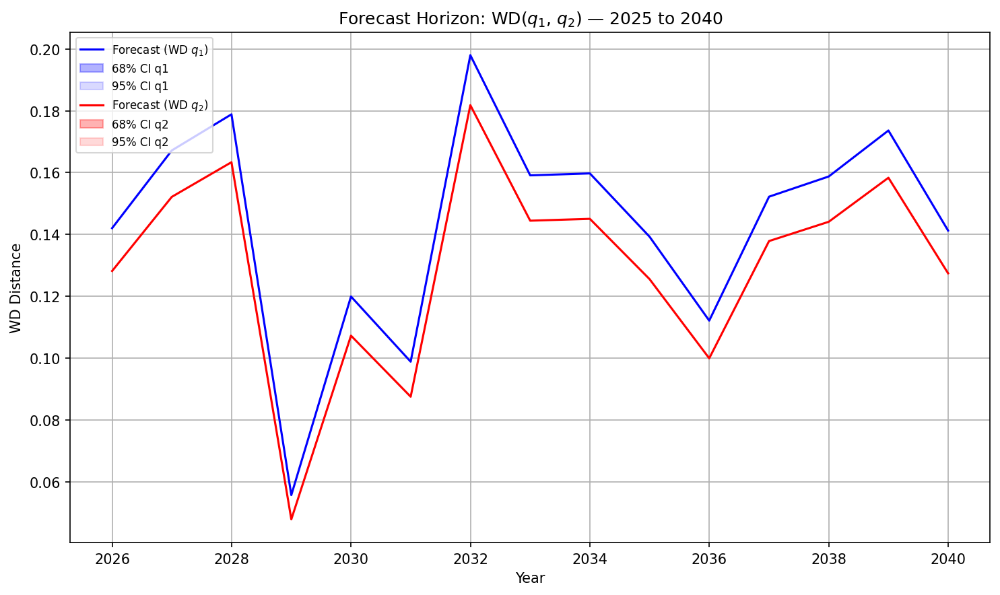

In [ ]:
# Forecast horizon
mask_forecast = (df_mean_ls1['t'] >= pd.Timestamp('2025-01-01')) & (df_mean_ls1['t'] <= pd.Timestamp('2040-12-31'))
t_vals = df_mean_ls1['t'][mask_forecast].values
mean_ls1 = df_mean_ls1['mean_ls1'][mask_forecast].astype(float).values
std_ls1 = df_mean_ls1['Desv_ls1'][mask_forecast].astype(float).values
mean_ls2 = df_mean_ls2['mean_ls2'][mask_forecast].astype(float).values
std_ls2 = df_mean_ls2['Desv_ls2'][mask_forecast].astype(float).values
# Plot forecast horizon only
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=150)
# KL(q1)
ax.plot(t_vals, np.exp(mean_ls1), label='Forecast (WD $q_1$)', color='blue', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls1 - std_ls1), np.exp(mean_ls1 + std_ls1),
                color='blue', alpha=0.3, label='68% CI q1')
ax.fill_between(t_vals, np.exp(mean_ls1 - 1.96 * std_ls1), np.exp(mean_ls1 + 1.96 * std_ls1),
                color='blue', alpha=0.15, label='95% CI q1')
# KL(q2)
ax.plot(t_vals, np.exp(mean_ls2), label='Forecast (WD $q_2$)', color='red', linewidth=1.5)
ax.fill_between(t_vals, np.exp(mean_ls2 - std_ls2), np.exp(mean_ls2 + std_ls2),
                color='red', alpha=0.3, label='68% CI q2')
ax.fill_between(t_vals, np.exp(mean_ls2 - 1.96 * std_ls2), np.exp(mean_ls2 + 1.96 * std_ls2),
                color='red', alpha=0.15, label='95% CI q2')
ax.set_title('Forecast Horizon: WD($q_1$, $q_2$) — 2025 to 2040')
ax.set_xlabel('Year')
ax.set_ylabel('WD Distance')
ax.grid(True)
ax.legend(loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()